## Germany PV Cut Scenario with 130 €/t CO2 price

In [140]:
import pypsa 
import matplotlib.pyplot as plt
plt.style.use("bmh")
import pandas as pd
from pypsa.plot import add_legend_patches
import gurobipy
import cartopy.crs as ccrs
from pypsa.optimization import optimize
import matplotlib.cm as cm
import numpy as np

pd.set_option("display.max_rows", None)  # Display all rows
pd.set_option("display.max_columns", None)  # Display all columns


## Import Network

In [141]:
n = pypsa.Network("C:\\Users\\Jeremy\\Documents\\MasterThesis\\Models\\Model_DE\\02042024_5nodes\\elec_s_5_ec_lv1.5_3h.nc")

INFO:pypsa.io:Imported network elec_s_5_ec_lv1.5_3h.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units


In [142]:
# add co2price
co2_price = 130 #€/t

for index in n.generators.index:
    emission = n.carriers.co2_emissions.filter(like= n.generators.carrier[index]) #t/MWh_th
    n.generators.at[index,'marginal_cost'] = n.generators.at[index,'marginal_cost'] + (emission * co2_price/n.generators.at[index,'efficiency']) # €/MWhel

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3184507867.py:6: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  n.generators.at[index,'marginal_cost'] = n.generators.at[index,'marginal_cost'] + (emission * co2_price/n.generators.at[index,'efficiency']) # €/MWhel


In [143]:
#n.global_constraints.loc['CO2Limit','constant'] = 184500000 #TCO2 184500000

In [144]:
for c in n.iterate_components(list(n.components.keys())[2:]):
    print("Component '{}' has {} entries".format(c.name,len(c.df)))

Component 'Bus' has 5 entries
Component 'Carrier' has 21 entries
Component 'GlobalConstraint' has 1 entries
Component 'Line' has 6 entries
Component 'LineType' has 34 entries
Component 'TransformerType' has 14 entries
Component 'Link' has 3 entries
Component 'Load' has 5 entries
Component 'Generator' has 66 entries
Component 'StorageUnit' has 17 entries


In [145]:
#remove nuclear fleet from germany
n.generators.loc[n.generators.index.str.endswith('nuclear'), 'p_nom'] = 0


In [146]:
# set marginal cost of load shedding to 3000€/MWh
for bus in n.generators.bus:
    for index in n.generators.index:
        if not bus.endswith('H2') and index.endswith('load'):
            n.generators.loc[index, 'marginal_cost'] = 3000

#edit load shedding's unit from kW to MW
for index in n.generators.index:
    if index.endswith('load') and not index.endswith('H2 load'):
        n.generators.loc[index, 'sign'] = 1

In [147]:
#solve network
n.optimize(solver_name='gurobi')
#n.lopf(solver_name='gurobi')

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 12/12 [00:01<00:00,  8.20it/s]
INFO:linopy.io: Writing time: 10.41s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-elyg6bwu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-elyg6bwu.lp


Reading time = 3.00 seconds


INFO:gurobipy:Reading time = 3.00 seconds


obj: 805986 rows, 373779 columns, 1491764 nonzeros


INFO:gurobipy:obj: 805986 rows, 373779 columns, 1491764 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 805986 rows, 373779 columns and 1491764 nonzeros


INFO:gurobipy:Optimize a model with 805986 rows, 373779 columns and 1491764 nonzeros


Model fingerprint: 0xf7b5d736


INFO:gurobipy:Model fingerprint: 0xf7b5d736


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-02, 5e+02]


INFO:gurobipy:  Matrix range     [1e-02, 5e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 9e+09]


INFO:gurobipy:  Bounds range     [1e+01, 9e+09]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 549449 rows and 73480 columns


INFO:gurobipy:Presolve removed 549449 rows and 73480 columns


Presolve time: 1.82s


INFO:gurobipy:Presolve time: 1.82s


Presolved: 256537 rows, 300299 columns, 900956 nonzeros


INFO:gurobipy:Presolved: 256537 rows, 300299 columns, 900956 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.40s


INFO:gurobipy:Ordering time: 0.40s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 40


INFO:gurobipy: Dense cols : 40


 AA' NZ     : 8.547e+05


INFO:gurobipy: AA' NZ     : 8.547e+05


 Factor NZ  : 4.220e+06 (roughly 260 MB of memory)


INFO:gurobipy: Factor NZ  : 4.220e+06 (roughly 260 MB of memory)


 Factor Ops : 2.595e+08 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 2.595e+08 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.30642472e+17 -1.98722807e+18  3.97e+09 6.74e+04  4.97e+13     3s


INFO:gurobipy:   0   1.30642472e+17 -1.98722807e+18  3.97e+09 6.74e+04  4.97e+13     3s


   1   1.20298744e+17 -5.32372076e+17  3.54e+09 1.94e+04  3.04e+13     4s


INFO:gurobipy:   1   1.20298744e+17 -5.32372076e+17  3.54e+09 1.94e+04  3.04e+13     4s


   2   9.34013456e+16 -2.53749447e+17  2.51e+09 8.09e+03  2.01e+13     4s


INFO:gurobipy:   2   9.34013456e+16 -2.53749447e+17  2.51e+09 8.09e+03  2.01e+13     4s


   3   5.32457442e+16 -1.21857996e+17  7.35e+08 3.03e+03  6.41e+12     5s


INFO:gurobipy:   3   5.32457442e+16 -1.21857996e+17  7.35e+08 3.03e+03  6.41e+12     5s


   4   4.30494757e+16 -3.03202539e+16  2.95e+08 6.85e+02  2.41e+12     5s


INFO:gurobipy:   4   4.30494757e+16 -3.03202539e+16  2.95e+08 6.85e+02  2.41e+12     5s


   5   2.27471653e+16 -4.89455157e+15  7.86e+07 1.38e+02  6.38e+11     6s


INFO:gurobipy:   5   2.27471653e+16 -4.89455157e+15  7.86e+07 1.38e+02  6.38e+11     6s


   6   4.30048479e+15 -6.07704703e+14  3.37e+06 1.10e+01  3.45e+10     6s


INFO:gurobipy:   6   4.30048479e+15 -6.07704703e+14  3.37e+06 1.10e+01  3.45e+10     6s


   7   5.93282631e+14 -2.51391748e+14  1.12e+05 3.02e+00  2.37e+09     6s


INFO:gurobipy:   7   5.93282631e+14 -2.51391748e+14  1.12e+05 3.02e+00  2.37e+09     6s


   8   2.12704639e+14 -7.56193323e+13  2.81e+04 1.72e-01  6.22e+08     7s


INFO:gurobipy:   8   2.12704639e+14 -7.56193323e+13  2.81e+04 1.72e-01  6.22e+08     7s


   9   7.65169693e+13 -2.63027375e+13  9.35e+03 2.03e-03  2.02e+08     7s


INFO:gurobipy:   9   7.65169693e+13 -2.63027375e+13  9.35e+03 2.03e-03  2.02e+08     7s


  10   9.33362499e+11 -5.53421448e+12  3.43e+00 5.48e-05  9.96e+06     8s


INFO:gurobipy:  10   9.33362499e+11 -5.53421448e+12  3.43e+00 5.48e-05  9.96e+06     8s


  11   4.26548304e+11 -2.16400686e+12  9.93e-01 2.73e-05  3.99e+06     8s


INFO:gurobipy:  11   4.26548304e+11 -2.16400686e+12  9.93e-01 2.73e-05  3.99e+06     8s


  12   3.12497499e+11 -1.57210883e+12  6.43e-01 1.98e-05  2.90e+06     9s


INFO:gurobipy:  12   3.12497499e+11 -1.57210883e+12  6.43e-01 1.98e-05  2.90e+06     9s


  13   2.05647086e+11 -1.11318416e+12  3.35e-01 1.38e-05  2.03e+06     9s


INFO:gurobipy:  13   2.05647086e+11 -1.11318416e+12  3.35e-01 1.38e-05  2.03e+06     9s


  14   1.83093540e+11 -1.09508155e+12  2.85e-01 1.35e-05  1.97e+06    10s


INFO:gurobipy:  14   1.83093540e+11 -1.09508155e+12  2.85e-01 1.35e-05  1.97e+06    10s


  15   9.95704338e+10 -4.43655995e+11  1.06e-01 5.72e-06  8.36e+05    10s


INFO:gurobipy:  15   9.95704338e+10 -4.43655995e+11  1.06e-01 5.72e-06  8.36e+05    10s


  16   6.87151604e+10 -2.21441143e+11  5.72e-02 2.91e-06  4.47e+05    11s


INFO:gurobipy:  16   6.87151604e+10 -2.21441143e+11  5.72e-02 2.91e-06  4.47e+05    11s


  17   5.72771358e+10 -1.49658107e+11  3.92e-02 2.08e-06  3.18e+05    11s


INFO:gurobipy:  17   5.72771358e+10 -1.49658107e+11  3.92e-02 2.08e-06  3.18e+05    11s


  18   5.00304961e+10 -1.05951491e+11  2.86e-02 1.54e-06  2.40e+05    12s


INFO:gurobipy:  18   5.00304961e+10 -1.05951491e+11  2.86e-02 1.54e-06  2.40e+05    12s


  19   4.65339923e+10 -7.62841221e+10  2.40e-02 1.20e-06  1.89e+05    12s


INFO:gurobipy:  19   4.65339923e+10 -7.62841221e+10  2.40e-02 1.20e-06  1.89e+05    12s


  20   4.24938823e+10 -5.68091154e+10  1.87e-02 9.55e-07  1.53e+05    12s


INFO:gurobipy:  20   4.24938823e+10 -5.68091154e+10  1.87e-02 9.55e-07  1.53e+05    12s


  21   3.73585310e+10 -3.98601496e+10  1.22e-02 7.63e-07  1.19e+05    13s


INFO:gurobipy:  21   3.73585310e+10 -3.98601496e+10  1.22e-02 7.63e-07  1.19e+05    13s


  22   3.46955099e+10 -2.37157305e+10  9.04e-03 5.78e-07  8.99e+04    13s


INFO:gurobipy:  22   3.46955099e+10 -2.37157305e+10  9.04e-03 5.78e-07  8.99e+04    13s


  23   3.18353040e+10 -9.12692301e+09  6.05e-03 4.10e-07  6.30e+04    13s


INFO:gurobipy:  23   3.18353040e+10 -9.12692301e+09  6.05e-03 4.10e-07  6.30e+04    13s


  24   3.04150248e+10 -1.31573636e+09  4.85e-03 3.12e-07  4.88e+04    14s


INFO:gurobipy:  24   3.04150248e+10 -1.31573636e+09  4.85e-03 3.12e-07  4.88e+04    14s


  25   2.86739302e+10  6.41044126e+09  3.56e-03 2.14e-07  3.43e+04    15s


INFO:gurobipy:  25   2.86739302e+10  6.41044126e+09  3.56e-03 2.14e-07  3.43e+04    15s


  26   2.73481882e+10  9.65832219e+09  2.66e-03 1.72e-07  2.72e+04    15s


INFO:gurobipy:  26   2.73481882e+10  9.65832219e+09  2.66e-03 1.72e-07  2.72e+04    15s


  27   2.54460765e+10  1.36938209e+10  1.39e-03 1.19e-07  1.81e+04    16s


INFO:gurobipy:  27   2.54460765e+10  1.36938209e+10  1.39e-03 1.19e-07  1.81e+04    16s


  28   2.45704926e+10  1.59587380e+10  8.89e-04 9.23e-08  1.33e+04    16s


INFO:gurobipy:  28   2.45704926e+10  1.59587380e+10  8.89e-04 9.23e-08  1.33e+04    16s


  29   2.37432559e+10  1.75205301e+10  4.59e-04 7.18e-08  9.58e+03    17s


INFO:gurobipy:  29   2.37432559e+10  1.75205301e+10  4.59e-04 7.18e-08  9.58e+03    17s


  30   2.33383682e+10  1.84341021e+10  2.79e-04 5.88e-08  7.55e+03    17s


INFO:gurobipy:  30   2.33383682e+10  1.84341021e+10  2.79e-04 5.88e-08  7.55e+03    17s


  31   2.31434837e+10  1.87469176e+10  2.04e-04 5.68e-08  6.77e+03    17s


INFO:gurobipy:  31   2.31434837e+10  1.87469176e+10  2.04e-04 5.68e-08  6.77e+03    17s


  32   2.30044083e+10  2.00591092e+10  1.52e-04 3.52e-08  4.53e+03    18s


INFO:gurobipy:  32   2.30044083e+10  2.00591092e+10  1.52e-04 3.52e-08  4.53e+03    18s


  33   2.29375546e+10  2.05358613e+10  1.31e-04 2.97e-08  3.70e+03    19s


INFO:gurobipy:  33   2.29375546e+10  2.05358613e+10  1.31e-04 2.97e-08  3.70e+03    19s


  34   2.28223935e+10  2.11596970e+10  9.42e-05 1.75e-08  2.56e+03    19s


INFO:gurobipy:  34   2.28223935e+10  2.11596970e+10  9.42e-05 1.75e-08  2.56e+03    19s


  35   2.27339911e+10  2.14769793e+10  6.86e-05 1.58e-08  1.93e+03    20s


INFO:gurobipy:  35   2.27339911e+10  2.14769793e+10  6.86e-05 1.58e-08  1.93e+03    20s


  36   2.26543498e+10  2.16934744e+10  4.66e-05 1.18e-08  1.48e+03    20s


INFO:gurobipy:  36   2.26543498e+10  2.16934744e+10  4.66e-05 1.18e-08  1.48e+03    20s


  37   2.26086917e+10  2.17261582e+10  3.52e-05 1.08e-08  1.36e+03    21s


INFO:gurobipy:  37   2.26086917e+10  2.17261582e+10  3.52e-05 1.08e-08  1.36e+03    21s


  38   2.25970616e+10  2.18356578e+10  3.20e-05 1.19e-08  1.17e+03    21s


INFO:gurobipy:  38   2.25970616e+10  2.18356578e+10  3.20e-05 1.19e-08  1.17e+03    21s


  39   2.25730319e+10  2.19386805e+10  2.56e-05 8.24e-09  9.76e+02    22s


INFO:gurobipy:  39   2.25730319e+10  2.19386805e+10  2.56e-05 8.24e-09  9.76e+02    22s


  40   2.25674960e+10  2.19475779e+10  2.43e-05 7.57e-09  9.54e+02    22s


INFO:gurobipy:  40   2.25674960e+10  2.19475779e+10  2.43e-05 7.57e-09  9.54e+02    22s


  41   2.25432743e+10  2.20606782e+10  1.84e-05 6.98e-09  7.43e+02    23s


INFO:gurobipy:  41   2.25432743e+10  2.20606782e+10  1.84e-05 6.98e-09  7.43e+02    23s


  42   2.25290616e+10  2.20861085e+10  1.51e-05 8.44e-09  6.82e+02    23s


INFO:gurobipy:  42   2.25290616e+10  2.20861085e+10  1.51e-05 8.44e-09  6.82e+02    23s


  43   2.25120373e+10  2.21119227e+10  1.13e-05 4.69e-09  6.16e+02    24s


INFO:gurobipy:  43   2.25120373e+10  2.21119227e+10  1.13e-05 4.69e-09  6.16e+02    24s


  44   2.25105012e+10  2.21344511e+10  1.09e-05 5.50e-09  5.79e+02    24s


INFO:gurobipy:  44   2.25105012e+10  2.21344511e+10  1.09e-05 5.50e-09  5.79e+02    24s


  45   2.25060323e+10  2.21917932e+10  9.87e-06 3.11e-09  4.84e+02    25s


INFO:gurobipy:  45   2.25060323e+10  2.21917932e+10  9.87e-06 3.11e-09  4.84e+02    25s


  46   2.24906041e+10  2.22254132e+10  6.66e-06 5.06e-09  4.08e+02    25s


INFO:gurobipy:  46   2.24906041e+10  2.22254132e+10  6.66e-06 5.06e-09  4.08e+02    25s


  47   2.24825414e+10  2.22426709e+10  5.48e-06 4.07e-09  3.69e+02    26s


INFO:gurobipy:  47   2.24825414e+10  2.22426709e+10  5.48e-06 4.07e-09  3.69e+02    26s


  48   2.24781008e+10  2.22920114e+10  4.27e-06 2.26e-09  2.86e+02    26s


INFO:gurobipy:  48   2.24781008e+10  2.22920114e+10  4.27e-06 2.26e-09  2.86e+02    26s


  49   2.24730120e+10  2.23268361e+10  2.99e-06 2.68e-09  2.25e+02    27s


INFO:gurobipy:  49   2.24730120e+10  2.23268361e+10  2.99e-06 2.68e-09  2.25e+02    27s


  50   2.24704780e+10  2.23307528e+10  2.46e-06 2.84e-09  2.15e+02    27s


INFO:gurobipy:  50   2.24704780e+10  2.23307528e+10  2.46e-06 2.84e-09  2.15e+02    27s


  51   2.24686690e+10  2.23566081e+10  1.99e-06 1.72e-09  1.72e+02    28s


INFO:gurobipy:  51   2.24686690e+10  2.23566081e+10  1.99e-06 1.72e-09  1.72e+02    28s


  52   2.24683060e+10  2.23639310e+10  1.92e-06 1.12e-09  1.61e+02    28s


INFO:gurobipy:  52   2.24683060e+10  2.23639310e+10  1.92e-06 1.12e-09  1.61e+02    28s


  53   2.24647783e+10  2.23872393e+10  2.04e-06 1.47e-09  1.19e+02    29s


INFO:gurobipy:  53   2.24647783e+10  2.23872393e+10  2.04e-06 1.47e-09  1.19e+02    29s


  54   2.24641320e+10  2.24000326e+10  1.75e-06 1.02e-09  9.86e+01    29s


INFO:gurobipy:  54   2.24641320e+10  2.24000326e+10  1.75e-06 1.02e-09  9.86e+01    29s


  55   2.24635724e+10  2.24033139e+10  1.55e-06 7.28e-10  9.27e+01    30s


INFO:gurobipy:  55   2.24635724e+10  2.24033139e+10  1.55e-06 7.28e-10  9.27e+01    30s


  56   2.24630916e+10  2.24083297e+10  1.33e-06 5.20e-10  8.43e+01    31s


INFO:gurobipy:  56   2.24630916e+10  2.24083297e+10  1.33e-06 5.20e-10  8.43e+01    31s


  57   2.24630227e+10  2.24140772e+10  1.29e-06 1.12e-09  7.53e+01    32s


INFO:gurobipy:  57   2.24630227e+10  2.24140772e+10  1.29e-06 1.12e-09  7.53e+01    32s


  58   2.24622909e+10  2.24234181e+10  1.04e-06 1.79e-09  5.98e+01    33s


INFO:gurobipy:  58   2.24622909e+10  2.24234181e+10  1.04e-06 1.79e-09  5.98e+01    33s


  59   2.24619425e+10  2.24309495e+10  8.87e-07 3.93e-10  4.77e+01    33s


INFO:gurobipy:  59   2.24619425e+10  2.24309495e+10  8.87e-07 3.93e-10  4.77e+01    33s


  60   2.24608173e+10  2.24392835e+10  4.82e-07 2.33e-10  3.31e+01    34s


INFO:gurobipy:  60   2.24608173e+10  2.24392835e+10  4.82e-07 2.33e-10  3.31e+01    34s


  61   2.24602488e+10  2.24431654e+10  2.72e-07 9.17e-10  2.63e+01    34s


INFO:gurobipy:  61   2.24602488e+10  2.24431654e+10  2.72e-07 9.17e-10  2.63e+01    34s


  62   2.24601428e+10  2.24440633e+10  2.44e-07 2.21e-09  2.47e+01    35s


INFO:gurobipy:  62   2.24601428e+10  2.24440633e+10  2.44e-07 2.21e-09  2.47e+01    35s


  63   2.24601009e+10  2.24446743e+10  2.28e-07 1.59e-09  2.37e+01    36s


INFO:gurobipy:  63   2.24601009e+10  2.24446743e+10  2.28e-07 1.59e-09  2.37e+01    36s


  64   2.24600083e+10  2.24474972e+10  1.99e-07 1.32e-09  1.93e+01    36s


INFO:gurobipy:  64   2.24600083e+10  2.24474972e+10  1.99e-07 1.32e-09  1.93e+01    36s


  65   2.24599615e+10  2.24485443e+10  1.88e-07 1.83e-09  1.76e+01    37s


INFO:gurobipy:  65   2.24599615e+10  2.24485443e+10  1.88e-07 1.83e-09  1.76e+01    37s


  66   2.24597014e+10  2.24529853e+10  1.18e-07 2.33e-10  1.03e+01    38s


INFO:gurobipy:  66   2.24597014e+10  2.24529853e+10  1.18e-07 2.33e-10  1.03e+01    38s


  67   2.24596430e+10  2.24540994e+10  1.06e-07 1.04e-09  8.53e+00    38s


INFO:gurobipy:  67   2.24596430e+10  2.24540994e+10  1.06e-07 1.04e-09  8.53e+00    38s


  68   2.24596131e+10  2.24541964e+10  1.00e-07 8.29e-10  8.34e+00    39s


INFO:gurobipy:  68   2.24596131e+10  2.24541964e+10  1.00e-07 8.29e-10  8.34e+00    39s


  69   2.24595922e+10  2.24544228e+10  9.64e-08 5.75e-10  7.96e+00    39s


INFO:gurobipy:  69   2.24595922e+10  2.24544228e+10  9.64e-08 5.75e-10  7.96e+00    39s


  70   2.24595180e+10  2.24555938e+10  7.95e-08 6.18e-10  6.04e+00    40s


INFO:gurobipy:  70   2.24595180e+10  2.24555938e+10  7.95e-08 6.18e-10  6.04e+00    40s


  71   2.24593991e+10  2.24570000e+10  5.70e-08 3.27e-10  3.69e+00    40s


INFO:gurobipy:  71   2.24593991e+10  2.24570000e+10  5.70e-08 3.27e-10  3.69e+00    40s


  72   2.24593429e+10  2.24580806e+10  4.87e-08 6.53e-10  1.94e+00    41s


INFO:gurobipy:  72   2.24593429e+10  2.24580806e+10  4.87e-08 6.53e-10  1.94e+00    41s


  73   2.24591332e+10  2.24585438e+10  1.83e-08 2.07e-09  9.07e-01    42s


INFO:gurobipy:  73   2.24591332e+10  2.24585438e+10  1.83e-08 2.07e-09  9.07e-01    42s


  74   2.24590922e+10  2.24587484e+10  1.35e-08 7.28e-10  5.29e-01    42s


INFO:gurobipy:  74   2.24590922e+10  2.24587484e+10  1.35e-08 7.28e-10  5.29e-01    42s


  75   2.24590896e+10  2.24587538e+10  1.32e-08 6.55e-10  5.17e-01    42s


INFO:gurobipy:  75   2.24590896e+10  2.24587538e+10  1.32e-08 6.55e-10  5.17e-01    42s


  76   2.24590838e+10  2.24587653e+10  1.26e-08 2.28e-09  4.90e-01    43s


INFO:gurobipy:  76   2.24590838e+10  2.24587653e+10  1.26e-08 2.28e-09  4.90e-01    43s


  77   2.24590775e+10  2.24587786e+10  1.19e-08 6.79e-10  4.60e-01    43s


INFO:gurobipy:  77   2.24590775e+10  2.24587786e+10  1.19e-08 6.79e-10  4.60e-01    43s


  78   2.24590635e+10  2.24588315e+10  1.04e-08 1.02e-09  3.57e-01    44s


INFO:gurobipy:  78   2.24590635e+10  2.24588315e+10  1.04e-08 1.02e-09  3.57e-01    44s


  79   2.24590520e+10  2.24588599e+10  9.09e-09 1.26e-09  2.96e-01    44s


INFO:gurobipy:  79   2.24590520e+10  2.24588599e+10  9.09e-09 1.26e-09  2.96e-01    44s


  80   2.24590118e+10  2.24589094e+10  4.95e-09 6.26e-10  1.57e-01    45s


INFO:gurobipy:  80   2.24590118e+10  2.24589094e+10  4.95e-09 6.26e-10  1.57e-01    45s


  81   2.24590082e+10  2.24589340e+10  4.56e-09 3.27e-10  1.14e-01    46s


INFO:gurobipy:  81   2.24590082e+10  2.24589340e+10  4.56e-09 3.27e-10  1.14e-01    46s


  82   2.24589858e+10  2.24589474e+10  2.26e-09 1.31e-09  5.91e-02    47s


INFO:gurobipy:  82   2.24589858e+10  2.24589474e+10  2.26e-09 1.31e-09  5.91e-02    47s


  83   2.24589738e+10  2.24589546e+10  1.10e-09 1.29e-09  2.96e-02    48s


INFO:gurobipy:  83   2.24589738e+10  2.24589546e+10  1.10e-09 1.29e-09  2.96e-02    48s


  84   2.24589692e+10  2.24589572e+10  5.93e-10 7.13e-10  1.84e-02    49s


INFO:gurobipy:  84   2.24589692e+10  2.24589572e+10  5.93e-10 7.13e-10  1.84e-02    49s


  85   2.24589675e+10  2.24589596e+10  4.18e-10 1.44e-09  1.22e-02    49s


INFO:gurobipy:  85   2.24589675e+10  2.24589596e+10  4.18e-10 1.44e-09  1.22e-02    49s


  86   2.24589666e+10  2.24589608e+10  6.98e-10 1.19e-09  8.78e-03    50s


INFO:gurobipy:  86   2.24589666e+10  2.24589608e+10  6.98e-10 1.19e-09  8.78e-03    50s


  87   2.24589660e+10  2.24589613e+10  7.24e-10 5.53e-10  7.09e-03    51s


INFO:gurobipy:  87   2.24589660e+10  2.24589613e+10  7.24e-10 5.53e-10  7.09e-03    51s


  88   2.24589655e+10  2.24589623e+10  7.80e-10 1.75e-09  4.89e-03    51s


INFO:gurobipy:  88   2.24589655e+10  2.24589623e+10  7.80e-10 1.75e-09  4.89e-03    51s


  89   2.24589643e+10  2.24589628e+10  2.64e-07 9.82e-10  2.31e-03    52s


INFO:gurobipy:  89   2.24589643e+10  2.24589628e+10  2.64e-07 9.82e-10  2.31e-03    52s


  90   2.24589638e+10  2.24589630e+10  3.41e-05 4.06e-10  1.23e-03    53s


INFO:gurobipy:  90   2.24589638e+10  2.24589630e+10  3.41e-05 4.06e-10  1.23e-03    53s


  91   2.24589635e+10  2.24589631e+10  2.14e-05 1.19e-09  6.57e-04    54s


INFO:gurobipy:  91   2.24589635e+10  2.24589631e+10  2.14e-05 1.19e-09  6.57e-04    54s


  92   2.24589635e+10  2.24589632e+10  1.83e-05 4.61e-10  5.50e-04    54s


INFO:gurobipy:  92   2.24589635e+10  2.24589632e+10  1.83e-05 4.61e-10  5.50e-04    54s


  93   2.24589635e+10  2.24589632e+10  1.63e-05 1.74e-09  4.60e-04    55s


INFO:gurobipy:  93   2.24589635e+10  2.24589632e+10  1.63e-05 1.74e-09  4.60e-04    55s


INFO:gurobipy:


Barrier solved model in 93 iterations and 54.56 seconds (17.02 work units)


INFO:gurobipy:Barrier solved model in 93 iterations and 54.56 seconds (17.02 work units)


Optimal objective 2.24589635e+10


INFO:gurobipy:Optimal objective 2.24589635e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  116569 variables added to crossover basis                       55s


INFO:gurobipy:  116569 variables added to crossover basis                       55s


INFO:gurobipy:


  118090 DPushes remaining with DInf 0.0000000e+00                55s


INFO:gurobipy:  118090 DPushes remaining with DInf 0.0000000e+00                55s


    2792 DPushes remaining with DInf 0.0000000e+00                60s


INFO:gurobipy:    2792 DPushes remaining with DInf 0.0000000e+00                60s


       0 DPushes remaining with DInf 0.0000000e+00                64s


INFO:gurobipy:       0 DPushes remaining with DInf 0.0000000e+00                64s


INFO:gurobipy:


  208123 PPushes remaining with PInf 0.0000000e+00                65s


INFO:gurobipy:  208123 PPushes remaining with PInf 0.0000000e+00                65s


   51607 PPushes remaining with PInf 3.0944979e-01                68s


INFO:gurobipy:   51607 PPushes remaining with PInf 3.0944979e-01                68s


   22546 PPushes remaining with PInf 2.7273074e-01                70s


INFO:gurobipy:   22546 PPushes remaining with PInf 2.7273074e-01                70s


      85 PPushes remaining with PInf 0.0000000e+00                75s


INFO:gurobipy:      85 PPushes remaining with PInf 0.0000000e+00                75s


       0 PPushes remaining with PInf 0.0000000e+00                75s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                75s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 1.6159261e+05     75s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 1.6159261e+05     75s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


  270927    2.2458963e+10   0.000000e+00   1.615926e+05     75s


INFO:gurobipy:  270927    2.2458963e+10   0.000000e+00   1.615926e+05     75s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


  272953    2.2458963e+10   0.000000e+00   0.000000e+00     79s


INFO:gurobipy:  272953    2.2458963e+10   0.000000e+00   0.000000e+00     79s


INFO:gurobipy:


Solved in 272953 iterations and 78.82 seconds (27.41 work units)


INFO:gurobipy:Solved in 272953 iterations and 78.82 seconds (27.41 work units)


Optimal objective  2.245896327e+10


INFO:gurobipy:Optimal objective  2.245896327e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 373779 primals, 805986 duals
Objective: 2.25e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper,

('ok', 'optimal')

In [148]:
def system_cost(n): #n.statistics.capex()
    stat = n.statistics()
    tsc = stat['Capital Expenditure'] + stat['Operational Expenditure']
    return tsc.droplevel(0).div(1e6) # million €/a

In [149]:
tot_cos_base=n.objective/1e9
system_cost_base = system_cost(n)
marg_price_region_base = n.buses_t.marginal_price.mean()
stat_base = n.statistics()

## Plot Network

<function matplotlib.pyplot.show(close=None, block=None)>

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


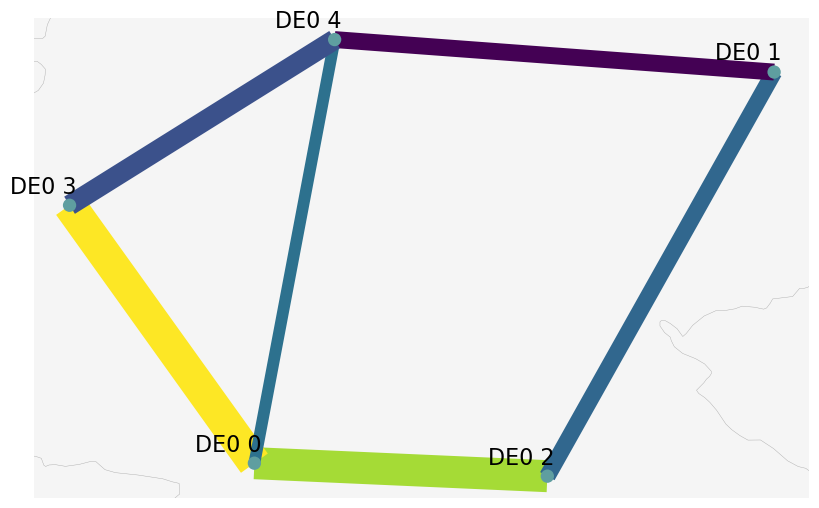

In [150]:
loading = (n.lines_t.p0.abs().mean().sort_index()/(n.lines.s_nom_opt*n.lines.s_max_pu).sort_index()).fillna(0.)

fig, ax = plt.subplots(
    figsize=(10,10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

n.plot(
    ax=ax,
    branch_components=["Line"],
    line_widths=n.lines.s_nom_opt/1e3, #GW
    line_colors=loading,
    line_cmap=plt.cm.viridis,
    color_geomap=True,
    bus_sizes=0.003
)

bus = n.buses
region = []
for index, row in bus.iterrows():
    x = row['x']
    y = row['y']
    if "H2" in index:
        pass
    else:
        region.append(index)
        ax.annotate(
        index,
        xy=(x, y),
        xytext=(5, 5),  # Adjust the position of the annotation
        textcoords="offset points",
        ha='right', va='bottom'
    )

plt.show


## Installed Capacity Map Plot

In [151]:
#color list for installed cap
tech_list = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
tech_list.remove('load')
color_cap = []

for i in range(len(tech_list)):
    for j in range(len(n.carriers.index)):
        if tech_list[i] == n.carriers.index[j]:
            color_cap.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  

cap = n.generators[n.generators['carrier']!='load'].groupby(['bus', 'carrier']).p_nom_opt.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3847545614.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_cap.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


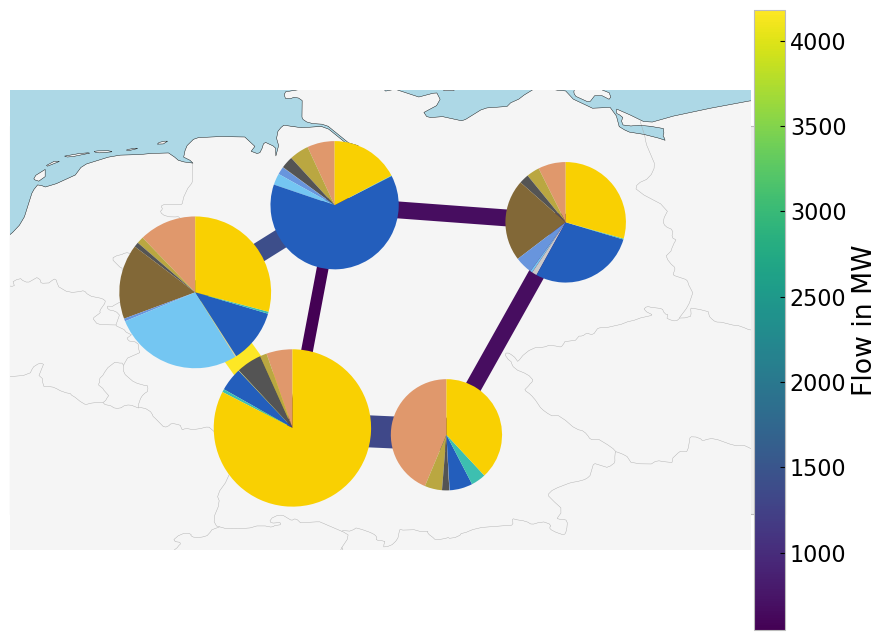

In [152]:
fig, ax = plt.subplots(
    figsize=(10,10),
    subplot_kw={"projection": ccrs.PlateCarree()}
)

collection = n.plot(
    bus_sizes=cap / 5e4,
    bus_colors = color_cap,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
        
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Generation Map Plot

In [153]:
#color list for energy generated 
tech_list_gen_table = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().unstack().columns.tolist()
colors_gen_table = []

for i in range(len(tech_list_gen_table)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen_table[i] == n.carriers.index[j]:
            colors_gen_table.append(n.carriers.color[j])
            break  # break the inner loop once a match is found 

#Adjust Load shedding's unit to MW from kW
#for column in n.generators_t.p.columns:
#    if column.endswith('load') and not column.endswith('H2 load'):
#        n.generators_t.p[column]/=1e3
        

gen = n.generators.assign(g=n.generators_t.p.mean()).groupby(["bus", "carrier"]).g.sum()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\971004373.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen_table.append(n.carriers.color[j])


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


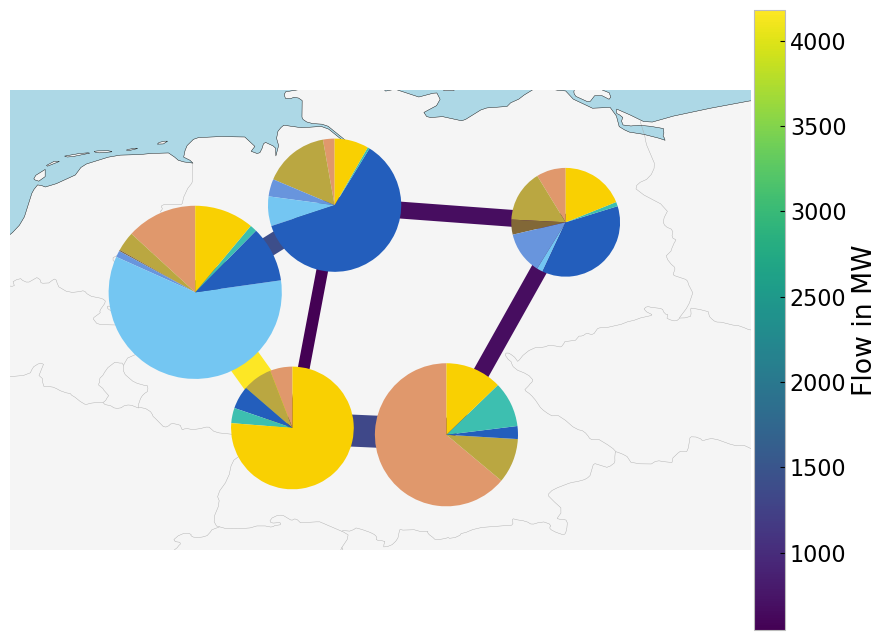

In [154]:
carriers = n.generators.carrier.unique()

plt.figure(figsize =(10,10))

collection = n.plot(
    bus_sizes=gen / 1e4,
    bus_colors = colors_gen_table,
    margin=0.5,
    #flow="mean",
    line_widths=n.lines.s_nom_opt/1e3, #GW
    link_widths=0,
    color_geomap=True,
    line_colors=n.lines_t.p0.mean().abs(),
)
plt.colorbar(collection[2], fraction=0.04, pad=0.004, label="Flow in MW")
plt.show()

## Installed Capacity

<Figure size 640x480 with 0 Axes>

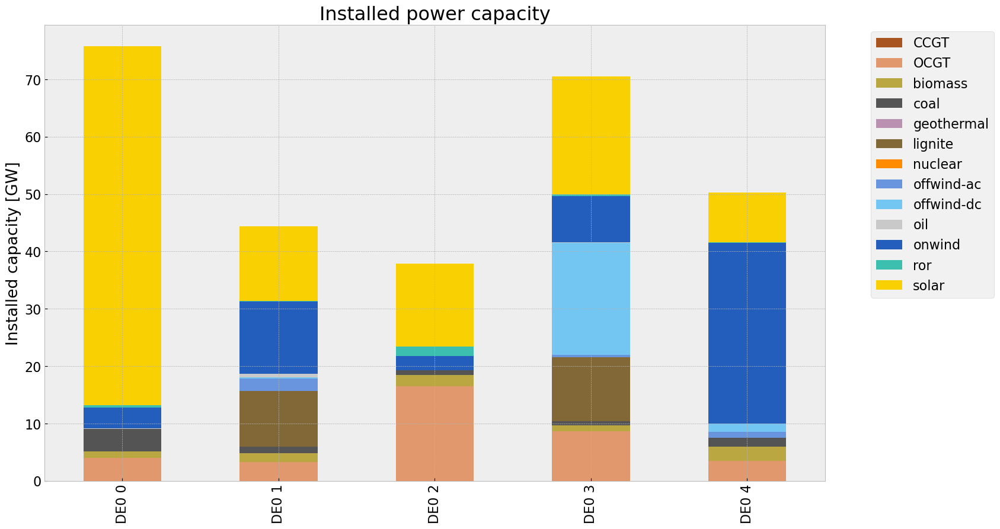

In [155]:
def inst_cap_table(n,colors):

    capacities = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
    capacities.fillna(0, inplace=True)
    gen = (capacities.unstack()/1000).drop(columns=['load'],inplace=False)
    gen.fillna(0, inplace=True)

    plt.figure()
    plt.rcParams.update({'font.size': 16})

    gen.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=colors,
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                title=f"Installed power capacity"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return capacities

# consolidated istalled cap without load_shedding

#capacities_base = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
#capacities_base.fillna(0, inplace=True)
#gen = (capacities_base.unstack()/1000).drop(columns=['load'],inplace=False)

capacities_base = inst_cap_table(n, color_cap)

## Generation

<Figure size 640x480 with 0 Axes>

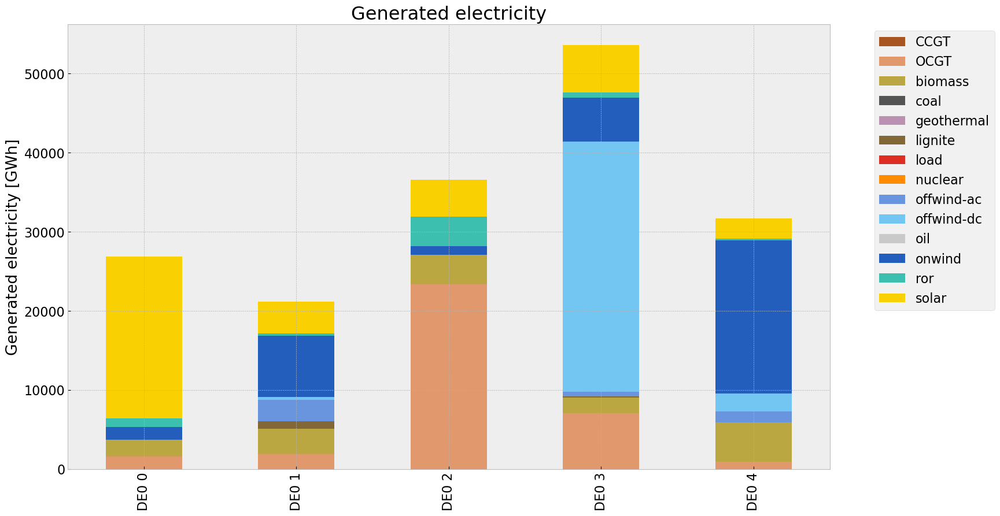

In [156]:
def gen_power_table(n, color):

    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack()/1000)#GWh
    #generations['load']/=1e3


    plt.figure()
    plt.rcParams.update({'font.size': 16})

    generations.plot.bar(figsize=(17,10),
                                stacked=True,
                                color=color,
                                grid=True,
                                xlabel="",
                                ylabel="Generated electricity [GWh]",
                                title=f"Generated electricity"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    return generations

gen_base = gen_power_table(n,colors_gen_table)

## Snapshot

In [157]:
sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()
#links = n.links_t.p0.groupby(n.links.carrier, axis =1).sum().drop(['DC','H2 electrolysis'], axis=1, inplace =False).head()
tech_list_gen = pd.concat([tech_list_gen, sto], axis=1).columns.tolist()

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\455130245.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\455130245.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  tech_list_gen = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum()


In [158]:
colors_gen = []

for i in range(len(tech_list_gen)):
    for j in range(len(n.carriers.index)):
        if tech_list_gen[i] == n.carriers.index[j]:
            colors_gen.append(n.carriers.color[j])
            break  # break the inner loop once a match is found  


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3660868222.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_gen.append(n.carriers.color[j])


In [159]:
def gen_curve(n, start, end, colors):

    plt.rcParams.update({'font.size': 16})


    p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
    #p_by_carrier['load'] /= 1e3

    #links fuel cell
    #links = n.links_t.p1.groupby(n.links.carrier, axis=1).sum().div(1e3)
    #links = links.drop(columns='DC', inplace=False)
    #links['H2 fuel cell']*=-1
       
    # join generator, links, and storage unit
    if not n.storage_units.empty:
        sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)     
        p_by_carrier = pd.concat([p_by_carrier, sto], axis=1)
        
    p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')

    start_date = start
    end_date = end
    
    # Create a date range for the specified time range
    time = pd.date_range(start=start_date, end=end_date, freq='3H')
    
    fig, ax = plt.subplots(figsize=(20, 10))
    
    #p_no_H = p_by_carrier.drop(columns = 'H2 electrolysis', inplace = False)
    p_by_carrier.where(p_by_carrier>0).loc[time].plot.area(
        ax=ax,
        linewidth=0,
        color=colors,
        grid=True,

    )
    
    charge = p_by_carrier.where(p_by_carrier<0).dropna(how='all', axis=1).loc[time]
    
    
    if not charge.empty:

        charge.plot.area(
            ax=ax,
            linewidth=0,
            color=["yellowgreen", "magenta", "purple", "grey"],
            grid=True,
        )
    
    loads = n.loads_t.p_set.sum(axis=1).div(1e3)
    loads.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
    
    loads.loc[time].plot(ax=ax, c='k',grid=True)


    plt.legend(loc=(1.05,0))
    
    ax.set_ylabel("Power [GW]")
    ax.set_title(f"Hourly electricity production")


    ax.set_ylim(-50,150)

In [160]:
#e_balance = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC",:].droplevel(2)
#e_balance.to_excel('energybalance.xlsx', index=True) 


In [161]:
#tes = n.statistics.energy_balance(aggregate_time=False, aggregate_bus=False).loc[:, :, "AC", :].droplevel(2)
#tes.to_csv('energybalance.csv', index=True)

In [162]:
#n.loads_t.p_set.sum(axis=1).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].div(1e3).plot(ax=ax, c='k',grid=True)


In [163]:
#p_by_carrier.where(p_by_carrier>0).loc[pd.date_range(start='2013-01-08', end='2013-01-14', freq='3H')].sum(axis=1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3550636783.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3550636783.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3550636783.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3550636783.py:25: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=en

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pandas\plotting\_matplotlib\core.py:1794: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(None, 0)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3550636783.py:51: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  loads.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


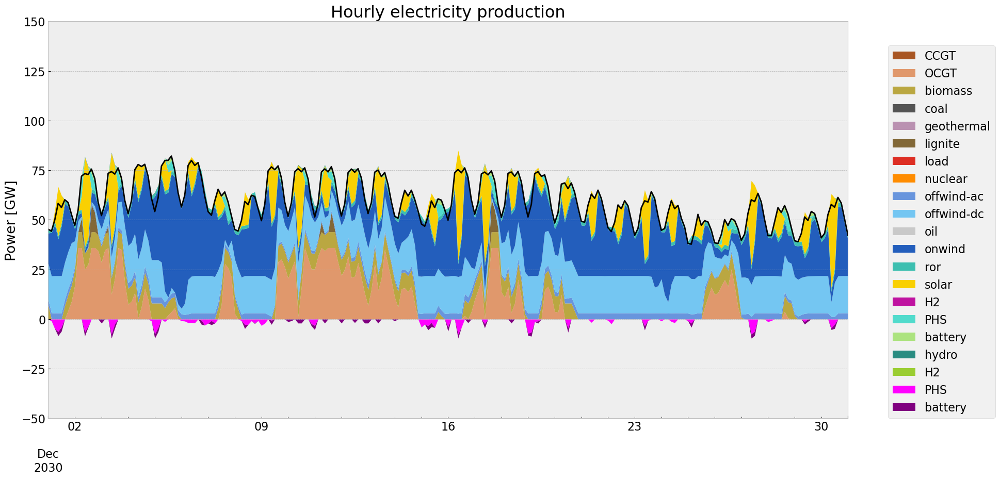

In [164]:
# winter
gen_curve(n, '2030-12-01', '2030-12-31', colors_gen)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3550636783.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3550636783.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3550636783.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3550636783.py:25: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=en

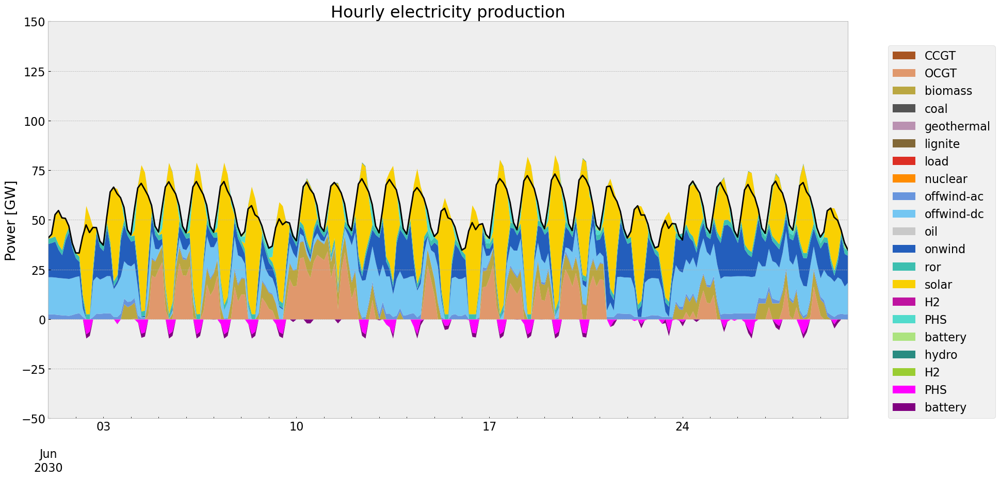

In [165]:
#summer
gen_curve(n, '2030-06-01', '2030-06-30', colors_gen)

## Storage

In [166]:
def inst_store_table(n):
    
    plt.rcParams.update({'font.size': 16})

    (n.storage_units.groupby(['bus','carrier']).p_nom_opt.sum().unstack()/1000).plot.bar(figsize=(17,10),
                                stacked=True,
                                color=["yellowgreen","magenta","red","blue"],
                                grid=True,
                                xlabel="",
                                ylabel="Installed capacity [GW]",
                                #title=f"Installed power capacities of storage systems in Italy in {year}",
                                ylim=[0,20]
    )

    return n.storage_units.groupby(['bus','carrier']).p_nom_opt.sum().unstack()/1000

carrier,H2,PHS,battery,hydro
bus,,,,
DE0 0,0.0,2.10300,0.000000,0.1200
DE0 1,0.0,0.99980,0.000000,NaN
DE0 2,0.0,1.85500,0.000000,0.1695
DE0 3,0.0,1.74142,2.054674,NaN
DE0 4,0.0,0.90000,0.000000,NaN


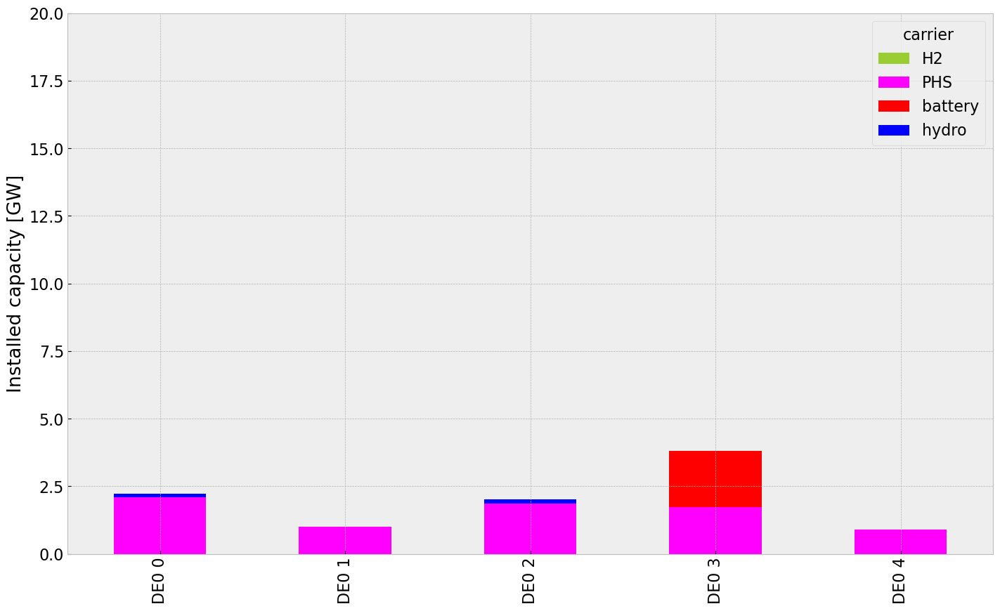

In [167]:
inst_store_table(n)

In [168]:
def state_of_charge_plot(n):
    
    soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)

    soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    soc.plot(ax=ax,
        grid=True,
        ylabel="State of charge [GWh]",
        xlabel="Time",
        #title=f"State of charge of aggregated storage systems in Italy in {year}",
        linewidth=1.5,
)

plt.show(n)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\440258284.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\440258284.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


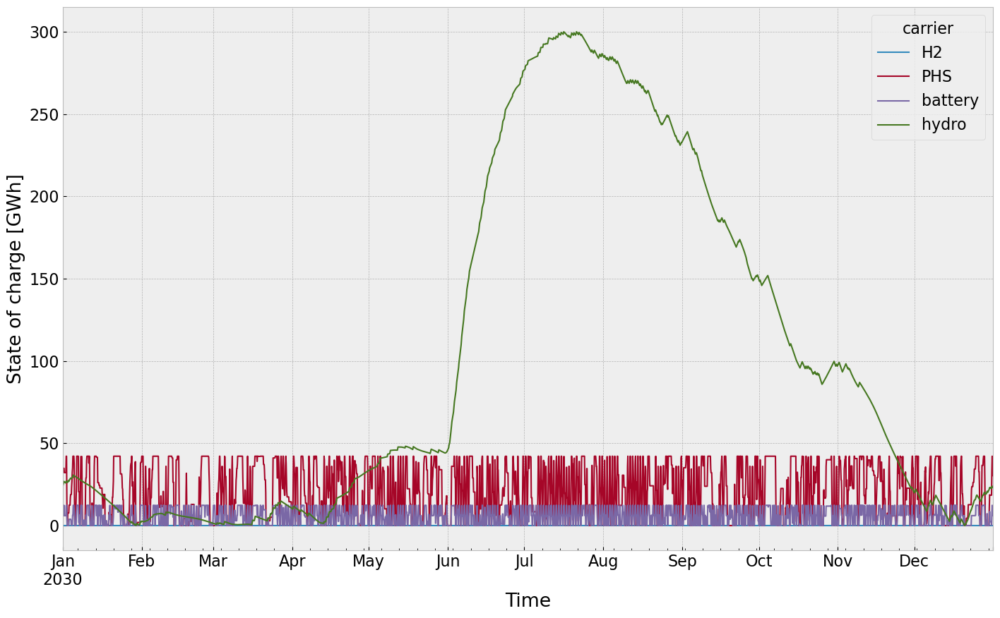

In [169]:
state_of_charge_plot(n)

## Electricity Price

In [170]:
def price_dur_curve_plot(n):

    #buses without store
    columns_to_keep =[]

    for i in n.buses_t.marginal_price.columns.tolist():
        if not i.endswith('H2'):
            columns_to_keep.append(i)
    
    price_dur_curve = pd.DataFrame()
    for region in columns_to_keep:
        price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    price_dur_curve.plot(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Time steps",
                    #title=f"Duration curves of the marginal price in the Italian regions in {year}",
                    linewidth=3,
)

plt.show()

In [171]:
columns_to_keep =[]

for i in n.buses_t.marginal_price.columns.tolist():
    if not i.endswith('H2'):
        columns_to_keep.append(i)
    

#buses without store
columns_to_keep =[]

price_dur_curve = pd.DataFrame()
for region in columns_to_keep:
    price_dur_curve[region] = n.buses_t.marginal_price[region].sort_values(ascending=False).reset_index(drop=True)


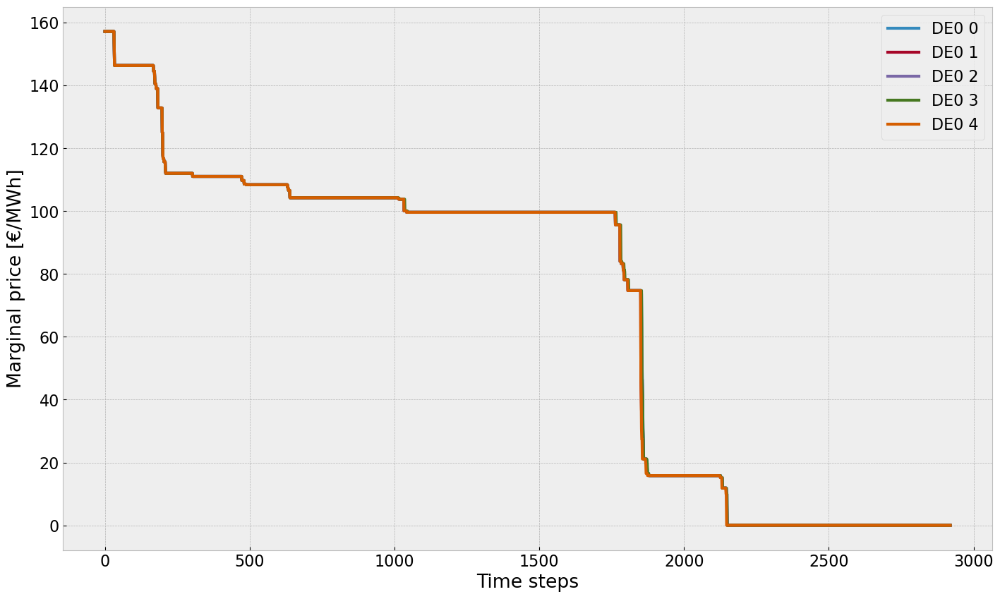

In [172]:
price_dur_curve_plot(n)

In [173]:
def price_regions_table(n):

    plt.rcParams.update({'font.size': 16})

    fig, ax = plt.subplots(figsize=(17,10))

    
    region = n.buses_t.marginal_price.mean()
    #for index, value in region.items():
    #    if index.endswith('H2'):
     #       region = region.drop(index)
    
    region.plot.bar(ax=ax,
                    grid=True,
                    ylabel="Marginal price [€/MWh]",
                    xlabel="Region",
                    title=f"Average marginal price",
                    linewidth=3,
    
    )

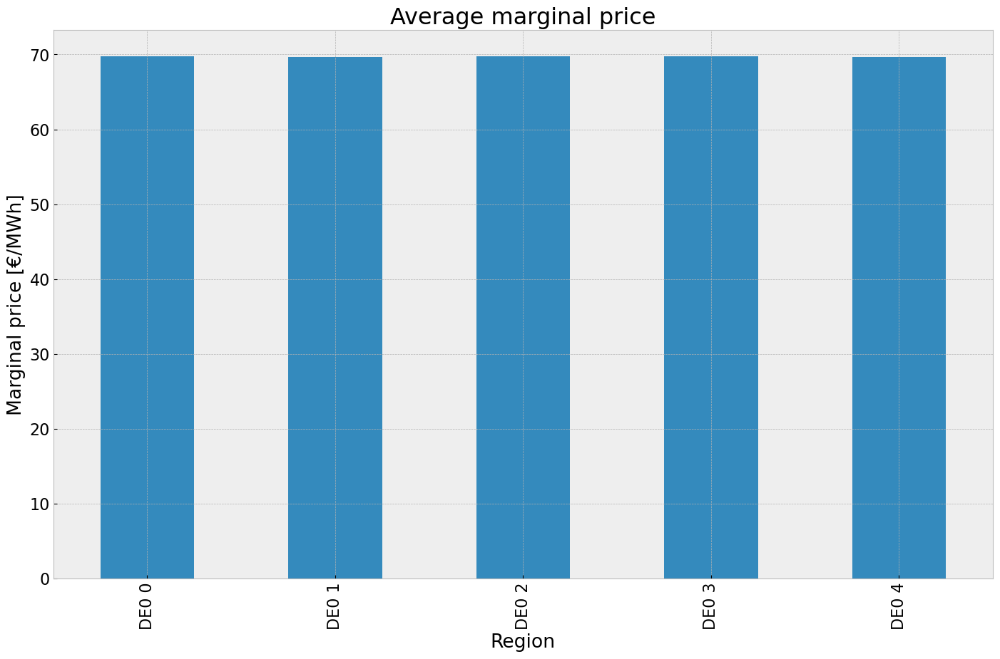

In [174]:
price_regions_table(n)

In [175]:
def price_regions(n):
    # Assuming 'n.buses_t.marginal_price' returns a DataFrame or similar structure with 'mean()' method
    mean_p = n.buses_t.marginal_price.mean()

    #hprice = mean_p.filter(like='H2')
    #eprice = mean_p.drop(hprice.index)

    # Setup figure and subplots with 1 row and 2 columns
    fig, ax = plt.subplots(subplot_kw={"projection": ccrs.PlateCarree()}, figsize=(8, 8))

    # Plot for eprice
    hb= plt.hexbin(
        n.buses.x,
        n.buses.y,
        gridsize=20,
        C=mean_p,
        cmap=plt.cm.jet,
        zorder=3,
    )

    n.plot(ax=ax, line_widths=pd.Series(0.5, n.lines.index), bus_sizes=0)  # Plot network on the second subplot
    
    cb = fig.colorbar(hb, ax=ax, location='bottom')
    cb.set_label("Mean Electricity Marginal Price (EUR/MWh)")
    fig.tight_layout()

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


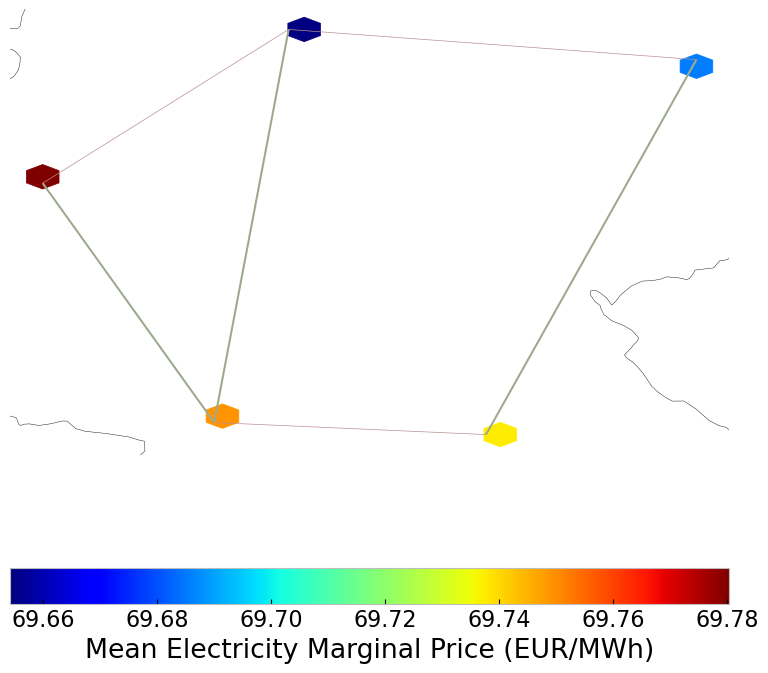

In [176]:
price_regions(n)

## Emission

In [177]:
def em_table(n):
    carrier = n.generators.carrier.unique()
    df_tot_generation = n.generators_t.p.sum()

    generations = pd.Series(index = n.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

    for r in region:
        for tech in carrier:
            key = f"{r} {tech}"
            if key in df_tot_generation.index:
                try:
                    generations.loc[r, tech] = df_tot_generation[key]
                    #print(generations.loc[r, tech])
                except KeyError:
                    print('error')
    generations.fillna(0, inplace=True)

    generations = (generations.unstack())#MWh

    #mean efficiency of each carrier
    eff = n.generators.groupby('carrier').efficiency.mean()

    e = generations.sum()
    emission = []

    for index in e.index:
        for index_c in n.carriers.index:
            for index_eff in eff.index:
                if index == index_c == index_eff:
                    em = n.carriers.loc[index_c,"co2_emissions"]
                    emission.append(em)

    df = e.to_frame()
    df.rename(columns={0: 'Generation in MWh'}, inplace=True)
    df['efficiency'] = eff
    df['emissions in Tonnes CO2/MWh'] = emission
    df['emissions in Tonnes CO2']= df['Generation in MWh']/df['efficiency']*df['emissions in Tonnes CO2/MWh']
    df['emissions in Tonnes CO2'].sum() 
    return df

em_base =em_table(n)
em_base

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,3.475453e+07,0.499437,0.1980,1.377831e+07
biomass,1.604494e+07,0.468000,0.0000,0.000000e+00
coal,0.000000e+00,0.329632,0.3361,0.000000e+00
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,1.067147e+06,0.358368,0.4069,1.211667e+06
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,0.000000e+00,0.328400,0.0000,0.000000e+00
offwind-ac,4.633844e+06,1.000000,0.0000,0.000000e+00


# Solar Cut Scenario
Cut start: 01.01.2013 
Cut end: 30.11.2013
reduction on capacity: 100%


In [178]:
#copy network
n1=n.copy()

#p_max_pu of pv generators across all regions are subtracted by 10% from 01.06.2013 to 31.12.13
cut_start=pd.to_datetime('2013-01-01 00:00:00')
cut_end = pd.to_datetime('2013-10-31 21:00:00')

for column in n1.generators_t.p_max_pu.columns:
        if column.endswith('solar'):
                for index,row in n1.generators_t.p_max_pu[column].items():
                        if index >= cut_start and index <= cut_end:
                                new_p_max_pu = n1.generators_t.p_max_pu.at[index, column] * 0.0 #0.9
                                n1.generators_t.p_max_pu.at[index, column] = new_p_max_pu
                                #if new_p_max_pu<0:
                                #    n1.generators_t.p_max_pu.at[index, column] = 0


#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n1.generators.p_nom_extendable.items():
    if value:  
        n1.generators.at[index, 'p_nom_min'] = n.generators.at[index, 'p_nom_opt']


#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n1.storage_units.p_nom_extendable.items():
    if value:  
        n1.storage_units.at[index, 'p_nom_min'] = n.storage_units.at[index, 'p_nom_opt']

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n1.lines.s_nom_extendable.items():
    if value:  
        n1.lines.at[index, 's_nom_min'] = n.lines.at[index, 's_nom_opt']

                        

## 1. Scenario: allow additional investment of extendable generators and storage

In [179]:
n1.optimize.create_model()


Index(['DE0 1 offwind-dc', 'DE0 3 offwind-ac', 'DE0 3 offwind-dc',
       'DE0 4 offwind-dc'],
      dtype='object', name='Generator')


Linopy LP model

Variables:
----------
 * Generator-p_nom (Generator-ext)
 * Line-s_nom (Line-ext)
 * Link-p_nom (Link-ext)
 * StorageUnit-p_nom (StorageUnit-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)
 * objective_constant

Constraints:
------------
 * Generator-ext-p_nom-lower (Generator-ext)
 * Generator-ext-p_nom-upper (Generator-ext)
 * Line-ext-s_nom-lower (Line-ext)
 * Line-ext-s_nom-upper (Line-ext)
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * StorageUnit-ext-p_nom-lower (StorageUnit-ext)
 * StorageUnit-ext-p_nom-upper (StorageUnit-ext)
 * Generator-fix-p-lower (snapshot, Generator-fix)
 * Generator-fix-p-upper (snapshot, Generator-fix)
 * Generator-ext-p-lower (snapshot, Generator-ext)
 * Generator-ext-p-

In [180]:
#solve network
n1.optimize(solver_name='gurobi')

Index(['DE0 1 offwind-dc', 'DE0 3 offwind-ac', 'DE0 3 offwind-dc',
       'DE0 4 offwind-dc'],
      dtype='object', name='Generator')
Index(['DE0 1 offwind-dc', 'DE0 3 offwind-ac', 'DE0 3 offwind-dc',
       'DE0 4 offwind-dc'],
      dtype='object', name='Generator')
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 12/12 [00:01<00:00,  8.10it/s]
INFO:linopy.io: Writing time: 10.31s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bn6ato_k.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bn6ato_k.lp


Reading time = 2.98 seconds


INFO:gurobipy:Reading time = 2.98 seconds


obj: 805986 rows, 373779 columns, 1485409 nonzeros


INFO:gurobipy:obj: 805986 rows, 373779 columns, 1485409 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 805986 rows, 373779 columns and 1485409 nonzeros


INFO:gurobipy:Optimize a model with 805986 rows, 373779 columns and 1485409 nonzeros


Model fingerprint: 0x4a3107fc


INFO:gurobipy:Model fingerprint: 0x4a3107fc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e-02, 5e+02]


INFO:gurobipy:  Matrix range     [1e-02, 5e+02]


  Objective range  [3e-02, 3e+05]


INFO:gurobipy:  Objective range  [3e-02, 3e+05]


  Bounds range     [1e+01, 9e+09]


INFO:gurobipy:  Bounds range     [1e+01, 9e+09]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 569935 rows and 79840 columns


INFO:gurobipy:Presolve removed 569935 rows and 79840 columns


Presolve time: 1.42s


INFO:gurobipy:Presolve time: 1.42s


Presolved: 236051 rows, 293939 columns, 853629 nonzeros


INFO:gurobipy:Presolved: 236051 rows, 293939 columns, 853629 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.40s


INFO:gurobipy:Ordering time: 0.40s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 35


INFO:gurobipy: Dense cols : 35


 AA' NZ     : 8.138e+05


INFO:gurobipy: AA' NZ     : 8.138e+05


 Factor NZ  : 4.289e+06 (roughly 250 MB of memory)


INFO:gurobipy: Factor NZ  : 4.289e+06 (roughly 250 MB of memory)


 Factor Ops : 3.062e+08 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 3.062e+08 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   1.31152137e+17 -2.46822272e+18  4.04e+09 8.58e+04  6.69e+13     5s


INFO:gurobipy:   0   1.31152137e+17 -2.46822272e+18  4.04e+09 8.58e+04  6.69e+13     5s


   1   1.21388576e+17 -7.06813843e+17  3.60e+09 2.50e+04  4.19e+13     6s


INFO:gurobipy:   1   1.21388576e+17 -7.06813843e+17  3.60e+09 2.50e+04  4.19e+13     6s


   2   9.31949001e+16 -3.04876346e+17  2.51e+09 8.69e+03  2.69e+13     6s


INFO:gurobipy:   2   9.31949001e+16 -3.04876346e+17  2.51e+09 8.69e+03  2.69e+13     6s


   3   5.48841635e+16 -1.36750781e+17  6.09e+08 2.90e+03  7.19e+12     7s


INFO:gurobipy:   3   5.48841635e+16 -1.36750781e+17  6.09e+08 2.90e+03  7.19e+12     7s


   4   4.54069975e+16 -3.07111877e+16  2.67e+08 5.44e+02  2.81e+12     7s


INFO:gurobipy:   4   4.54069975e+16 -3.07111877e+16  2.67e+08 5.44e+02  2.81e+12     7s


   5   2.68726226e+16 -4.16666892e+15  9.19e+07 8.83e+01  9.42e+11     8s


INFO:gurobipy:   5   2.68726226e+16 -4.16666892e+15  9.19e+07 8.83e+01  9.42e+11     8s


   6   3.96608498e+15 -6.70474499e+14  2.22e+06 6.99e+00  3.08e+10     8s


INFO:gurobipy:   6   3.96608498e+15 -6.70474499e+14  2.22e+06 6.99e+00  3.08e+10     8s


   7   6.30520807e+14 -1.57453113e+14  2.27e+05 3.91e-01  3.41e+09     8s


INFO:gurobipy:   7   6.30520807e+14 -1.57453113e+14  2.27e+05 3.91e-01  3.41e+09     8s


   8   1.23971420e+14 -1.13873818e+14  3.20e+04 1.49e-01  6.75e+08     9s


INFO:gurobipy:   8   1.23971420e+14 -1.13873818e+14  3.20e+04 1.49e-01  6.75e+08     9s


   9   8.49439740e+12 -3.29129566e+13  1.53e+02 1.59e-05  6.82e+07     9s


INFO:gurobipy:   9   8.49439740e+12 -3.29129566e+13  1.53e+02 1.59e-05  6.82e+07     9s


  10   9.26948879e+11 -8.18421269e+12  1.32e+01 3.90e-06  1.48e+07    10s


INFO:gurobipy:  10   9.26948879e+11 -8.18421269e+12  1.32e+01 3.90e-06  1.48e+07    10s


  11   5.34760510e+11 -3.90396468e+12  5.95e+00 1.76e-06  7.21e+06    10s


INFO:gurobipy:  11   5.34760510e+11 -3.90396468e+12  5.95e+00 1.76e-06  7.21e+06    10s


  12   3.73226494e+11 -2.05007461e+12  3.51e+00 9.17e-07  3.93e+06    10s


INFO:gurobipy:  12   3.73226494e+11 -2.05007461e+12  3.51e+00 9.17e-07  3.93e+06    10s


  13   2.18557321e+11 -9.45743480e+11  1.39e+00 4.33e-07  1.89e+06    11s


INFO:gurobipy:  13   2.18557321e+11 -9.45743480e+11  1.39e+00 4.33e-07  1.89e+06    11s


  14   1.78803228e+11 -5.61232819e+11  9.82e-01 2.62e-07  1.20e+06    11s


INFO:gurobipy:  14   1.78803228e+11 -5.61232819e+11  9.82e-01 2.62e-07  1.20e+06    11s


  15   1.26141569e+11 -4.04972844e+11  5.79e-01 1.89e-07  8.61e+05    12s


INFO:gurobipy:  15   1.26141569e+11 -4.04972844e+11  5.79e-01 1.89e-07  8.61e+05    12s


  16   9.25392249e+10 -1.25377288e+11  3.11e-01 6.44e-08  3.53e+05    12s


INFO:gurobipy:  16   9.25392249e+10 -1.25377288e+11  3.11e-01 6.44e-08  3.53e+05    12s


  17   6.59842944e+10 -6.57110269e+10  1.55e-01 4.01e-08  2.14e+05    13s


INFO:gurobipy:  17   6.59842944e+10 -6.57110269e+10  1.55e-01 4.01e-08  2.14e+05    13s


  18   5.90938769e+10 -4.00410302e+10  1.19e-01 2.95e-08  1.61e+05    13s


INFO:gurobipy:  18   5.90938769e+10 -4.00410302e+10  1.19e-01 2.95e-08  1.61e+05    13s


  19   5.51459187e+10 -2.23749058e+10  9.98e-02 2.22e-08  1.26e+05    13s


INFO:gurobipy:  19   5.51459187e+10 -2.23749058e+10  9.98e-02 2.22e-08  1.26e+05    13s


  20   5.05960569e+10 -1.19141777e+10  7.83e-02 1.78e-08  1.01e+05    13s


INFO:gurobipy:  20   5.05960569e+10 -1.19141777e+10  7.83e-02 1.78e-08  1.01e+05    13s


  21   4.39692017e+10 -4.20066441e+09  4.88e-02 1.46e-08  7.81e+04    14s


INFO:gurobipy:  21   4.39692017e+10 -4.20066441e+09  4.88e-02 1.46e-08  7.81e+04    14s


  22   4.24120451e+10  6.43118476e+09  4.24e-02 1.03e-08  5.84e+04    14s


INFO:gurobipy:  22   4.24120451e+10  6.43118476e+09  4.24e-02 1.03e-08  5.84e+04    14s


  23   3.88481679e+10  1.45492192e+10  2.84e-02 6.71e-09  3.94e+04    15s


INFO:gurobipy:  23   3.88481679e+10  1.45492192e+10  2.84e-02 6.71e-09  3.94e+04    15s


  24   3.59887298e+10  1.89153346e+10  1.80e-02 4.76e-09  2.77e+04    15s


INFO:gurobipy:  24   3.59887298e+10  1.89153346e+10  1.80e-02 4.76e-09  2.77e+04    15s


  25   3.42664291e+10  2.21989929e+10  1.21e-02 3.37e-09  1.96e+04    16s


INFO:gurobipy:  25   3.42664291e+10  2.21989929e+10  1.21e-02 3.37e-09  1.96e+04    16s


  26   3.36048962e+10  2.45341684e+10  1.00e-02 2.31e-09  1.47e+04    16s


INFO:gurobipy:  26   3.36048962e+10  2.45341684e+10  1.00e-02 2.31e-09  1.47e+04    16s


  27   3.24678619e+10  2.57568148e+10  6.65e-03 1.78e-09  1.09e+04    17s


INFO:gurobipy:  27   3.24678619e+10  2.57568148e+10  6.65e-03 1.78e-09  1.09e+04    17s


  28   3.16777825e+10  2.66864841e+10  4.43e-03 1.39e-09  8.09e+03    17s


INFO:gurobipy:  28   3.16777825e+10  2.66864841e+10  4.43e-03 1.39e-09  8.09e+03    17s


  29   3.11263250e+10  2.76898416e+10  2.92e-03 9.61e-10  5.57e+03    18s


INFO:gurobipy:  29   3.11263250e+10  2.76898416e+10  2.92e-03 9.61e-10  5.57e+03    18s


  30   3.05495169e+10  2.82738721e+10  1.44e-03 7.10e-10  3.69e+03    18s


INFO:gurobipy:  30   3.05495169e+10  2.82738721e+10  1.44e-03 7.10e-10  3.69e+03    18s


  31   3.03738016e+10  2.86482143e+10  9.94e-04 5.54e-10  2.80e+03    19s


INFO:gurobipy:  31   3.03738016e+10  2.86482143e+10  9.94e-04 5.54e-10  2.80e+03    19s


  32   3.02382374e+10  2.89690150e+10  6.78e-04 4.12e-10  2.06e+03    19s


INFO:gurobipy:  32   3.02382374e+10  2.89690150e+10  6.78e-04 4.12e-10  2.06e+03    19s


  33   3.01932991e+10  2.91020849e+10  5.76e-04 3.54e-10  1.77e+03    20s


INFO:gurobipy:  33   3.01932991e+10  2.91020849e+10  5.76e-04 3.54e-10  1.77e+03    20s


  34   3.01428195e+10  2.91254516e+10  4.62e-04 6.37e-10  1.65e+03    20s


INFO:gurobipy:  34   3.01428195e+10  2.91254516e+10  4.62e-04 6.37e-10  1.65e+03    20s


  35   3.00792452e+10  2.94742213e+10  3.14e-04 2.07e-10  9.81e+02    21s


INFO:gurobipy:  35   3.00792452e+10  2.94742213e+10  3.14e-04 2.07e-10  9.81e+02    21s


  36   3.00268619e+10  2.96024097e+10  2.04e-04 2.70e-10  6.88e+02    21s


INFO:gurobipy:  36   3.00268619e+10  2.96024097e+10  2.04e-04 2.70e-10  6.88e+02    21s


  37   2.99974532e+10  2.96802869e+10  1.43e-04 5.16e-10  5.14e+02    22s


INFO:gurobipy:  37   2.99974532e+10  2.96802869e+10  1.43e-04 5.16e-10  5.14e+02    22s


  38   2.99832778e+10  2.97366130e+10  1.15e-04 2.90e-10  4.00e+02    22s


INFO:gurobipy:  38   2.99832778e+10  2.97366130e+10  1.15e-04 2.90e-10  4.00e+02    22s


  39   2.99789661e+10  2.97927842e+10  1.05e-04 2.07e-10  3.02e+02    23s


INFO:gurobipy:  39   2.99789661e+10  2.97927842e+10  1.05e-04 2.07e-10  3.02e+02    23s


  40   2.99637747e+10  2.98057377e+10  7.50e-05 2.89e-10  2.56e+02    23s


INFO:gurobipy:  40   2.99637747e+10  2.98057377e+10  7.50e-05 2.89e-10  2.56e+02    23s


  41   2.99537955e+10  2.98362723e+10  5.42e-05 2.22e-10  1.91e+02    24s


INFO:gurobipy:  41   2.99537955e+10  2.98362723e+10  5.42e-05 2.22e-10  1.91e+02    24s


  42   2.99482949e+10  2.98539896e+10  4.28e-05 5.00e-10  1.53e+02    24s


INFO:gurobipy:  42   2.99482949e+10  2.98539896e+10  4.28e-05 5.00e-10  1.53e+02    24s


  43   2.99392726e+10  2.98640754e+10  2.55e-05 3.87e-10  1.22e+02    25s


INFO:gurobipy:  43   2.99392726e+10  2.98640754e+10  2.55e-05 3.87e-10  1.22e+02    25s


  44   2.99366586e+10  2.98825851e+10  2.02e-05 2.11e-10  8.77e+01    26s


INFO:gurobipy:  44   2.99366586e+10  2.98825851e+10  2.02e-05 2.11e-10  8.77e+01    26s


  45   2.99316877e+10  2.98911532e+10  1.02e-05 4.86e-10  6.57e+01    26s


INFO:gurobipy:  45   2.99316877e+10  2.98911532e+10  1.02e-05 4.86e-10  6.57e+01    26s


  46   2.99298873e+10  2.99060286e+10  1.02e-05 1.82e-10  3.87e+01    27s


INFO:gurobipy:  46   2.99298873e+10  2.99060286e+10  1.02e-05 1.82e-10  3.87e+01    27s


  47   2.99285846e+10  2.99135574e+10  6.03e-06 1.89e-10  2.44e+01    27s


INFO:gurobipy:  47   2.99285846e+10  2.99135574e+10  6.03e-06 1.89e-10  2.44e+01    27s


  48   2.99268385e+10  2.99191344e+10  2.09e-06 1.15e-09  1.25e+01    28s


INFO:gurobipy:  48   2.99268385e+10  2.99191344e+10  2.09e-06 1.15e-09  1.25e+01    28s


  49   2.99264808e+10  2.99227452e+10  2.54e-06 3.45e-10  6.06e+00    28s


INFO:gurobipy:  49   2.99264808e+10  2.99227452e+10  2.54e-06 3.45e-10  6.06e+00    28s


  50   2.99262399e+10  2.99231760e+10  1.74e-06 4.15e-10  4.97e+00    28s


INFO:gurobipy:  50   2.99262399e+10  2.99231760e+10  1.74e-06 4.15e-10  4.97e+00    28s


  51   2.99259067e+10  2.99243893e+10  7.09e-07 2.39e-10  2.46e+00    29s


INFO:gurobipy:  51   2.99259067e+10  2.99243893e+10  7.09e-07 2.39e-10  2.46e+00    29s


  52   2.99258383e+10  2.99250104e+10  5.19e-07 2.87e-10  1.34e+00    29s


INFO:gurobipy:  52   2.99258383e+10  2.99250104e+10  5.19e-07 2.87e-10  1.34e+00    29s


  53   2.99257627e+10  2.99253146e+10  3.36e-07 1.04e-10  7.27e-01    30s


INFO:gurobipy:  53   2.99257627e+10  2.99253146e+10  3.36e-07 1.04e-10  7.27e-01    30s


  54   2.99257061e+10  2.99253919e+10  2.02e-07 2.93e-10  5.10e-01    30s


INFO:gurobipy:  54   2.99257061e+10  2.99253919e+10  2.02e-07 2.93e-10  5.10e-01    30s


  55   2.99256786e+10  2.99254540e+10  1.37e-07 1.52e-10  3.64e-01    31s


INFO:gurobipy:  55   2.99256786e+10  2.99254540e+10  1.37e-07 1.52e-10  3.64e-01    31s


  56   2.99256623e+10  2.99254894e+10  9.96e-08 7.28e-11  2.80e-01    31s


INFO:gurobipy:  56   2.99256623e+10  2.99254894e+10  9.96e-08 7.28e-11  2.80e-01    31s


  57   2.99256565e+10  2.99255325e+10  8.63e-08 3.54e-10  2.01e-01    32s


INFO:gurobipy:  57   2.99256565e+10  2.99255325e+10  8.63e-08 3.54e-10  2.01e-01    32s


  58   2.99256347e+10  2.99255566e+10  3.72e-08 6.35e-10  1.27e-01    33s


INFO:gurobipy:  58   2.99256347e+10  2.99255566e+10  3.72e-08 6.35e-10  1.27e-01    33s


  59   2.99256271e+10  2.99255827e+10  1.93e-08 2.26e-10  7.20e-02    35s


INFO:gurobipy:  59   2.99256271e+10  2.99255827e+10  1.93e-08 2.26e-10  7.20e-02    35s


  60   2.99256205e+10  2.99256048e+10  5.02e-09 4.08e-10  2.54e-02    35s


INFO:gurobipy:  60   2.99256205e+10  2.99256048e+10  5.02e-09 4.08e-10  2.54e-02    35s


  61   2.99256194e+10  2.99256112e+10  2.95e-09 3.02e-10  1.33e-02    36s


INFO:gurobipy:  61   2.99256194e+10  2.99256112e+10  2.95e-09 3.02e-10  1.33e-02    36s


  62   2.99256184e+10  2.99256146e+10  1.18e-09 1.34e-09  6.09e-03    37s


INFO:gurobipy:  62   2.99256184e+10  2.99256146e+10  1.18e-09 1.34e-09  6.09e-03    37s


  63   2.99256180e+10  2.99256161e+10  7.46e-09 6.05e-10  3.16e-03    37s


INFO:gurobipy:  63   2.99256180e+10  2.99256161e+10  7.46e-09 6.05e-10  3.16e-03    37s


  64   2.99256178e+10  2.99256168e+10  4.00e-09 3.51e-10  1.55e-03    38s


INFO:gurobipy:  64   2.99256178e+10  2.99256168e+10  4.00e-09 3.51e-10  1.55e-03    38s


  65   2.99256177e+10  2.99256173e+10  8.84e-07 4.00e-10  6.24e-04    39s


INFO:gurobipy:  65   2.99256177e+10  2.99256173e+10  8.84e-07 4.00e-10  6.24e-04    39s


  66   2.99256176e+10  2.99256175e+10  1.08e-05 4.27e-10  2.01e-04    39s


INFO:gurobipy:  66   2.99256176e+10  2.99256175e+10  1.08e-05 4.27e-10  2.01e-04    39s


  67   2.99256175e+10  2.99256175e+10  2.05e-05 1.14e-09  5.43e-05    40s


INFO:gurobipy:  67   2.99256175e+10  2.99256175e+10  2.05e-05 1.14e-09  5.43e-05    40s


  68   2.99256175e+10  2.99256175e+10  1.11e-05 1.10e-09  1.09e-05    40s


INFO:gurobipy:  68   2.99256175e+10  2.99256175e+10  1.11e-05 1.10e-09  1.09e-05    40s


  69   2.99256175e+10  2.99256175e+10  3.17e-08 5.45e-10  2.85e-08    40s


INFO:gurobipy:  69   2.99256175e+10  2.99256175e+10  3.17e-08 5.45e-10  2.85e-08    40s


  70   2.99256175e+10  2.99256175e+10  4.00e-11 1.32e-09  2.97e-12    41s


INFO:gurobipy:  70   2.99256175e+10  2.99256175e+10  4.00e-11 1.32e-09  2.97e-12    41s


INFO:gurobipy:


Barrier solved model in 70 iterations and 41.06 seconds (11.22 work units)


INFO:gurobipy:Barrier solved model in 70 iterations and 41.06 seconds (11.22 work units)


Optimal objective 2.99256175e+10


INFO:gurobipy:Optimal objective 2.99256175e+10


INFO:gurobipy:


Crossover log...


INFO:gurobipy:Crossover log...


INFO:gurobipy:


  119206 DPushes remaining with DInf 6.5327315e-01                41s


INFO:gurobipy:  119206 DPushes remaining with DInf 6.5327315e-01                41s


       0 DPushes remaining with DInf 6.2877593e-01                42s


INFO:gurobipy:       0 DPushes remaining with DInf 6.2877593e-01                42s


INFO:gurobipy:


    8114 PPushes remaining with PInf 5.8217308e-05                42s


INFO:gurobipy:    8114 PPushes remaining with PInf 5.8217308e-05                42s


       0 PPushes remaining with PInf 0.0000000e+00                43s


INFO:gurobipy:       0 PPushes remaining with PInf 0.0000000e+00                43s


INFO:gurobipy:


  Push phase complete: Pinf 0.0000000e+00, Dinf 3.3527768e-02     43s


INFO:gurobipy:  Push phase complete: Pinf 0.0000000e+00, Dinf 3.3527768e-02     43s


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   71492    2.9925618e+10   0.000000e+00   3.352777e-02     43s


INFO:gurobipy:   71492    2.9925618e+10   0.000000e+00   3.352777e-02     43s


INFO:gurobipy:


Solved with barrier


INFO:gurobipy:Solved with barrier


   71595    2.9925618e+10   0.000000e+00   0.000000e+00     44s


INFO:gurobipy:   71595    2.9925618e+10   0.000000e+00   0.000000e+00     44s


INFO:gurobipy:


Solved in 71595 iterations and 44.10 seconds (12.44 work units)


INFO:gurobipy:Solved in 71595 iterations and 44.10 seconds (12.44 work units)


Optimal objective  2.992561751e+10


INFO:gurobipy:Optimal objective  2.992561751e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 373779 primals, 805986 duals
Objective: 2.99e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper,

('ok', 'optimal')

In [181]:
tot_cos_inv=n1.objective/1e9 # billion €
system_cost_inv = system_cost(n1) #million€/a
marg_price_region_inv = n1.buses_t.marginal_price.mean()
stat_inv = n1.statistics()

## Installed Capacity

<Figure size 640x480 with 0 Axes>

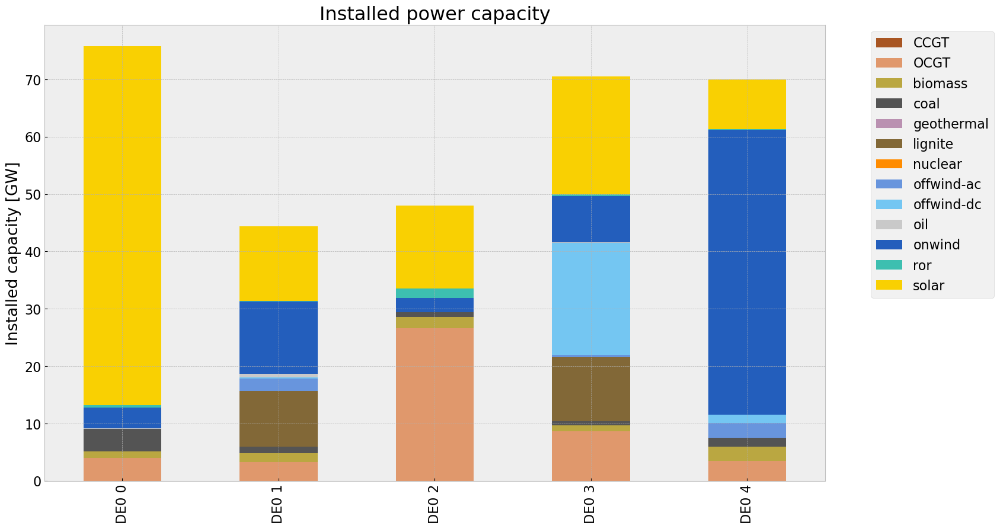

In [182]:
# consolidated istalled cap without load_shedding

capacities_inv = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_inv.fillna(0, inplace=True)
gen_1 = (capacities_inv.unstack()/1000).drop(columns=['load'],inplace=False)


cap_inv = inst_cap_table(n1, color_cap)


## Generation

<Figure size 640x480 with 0 Axes>

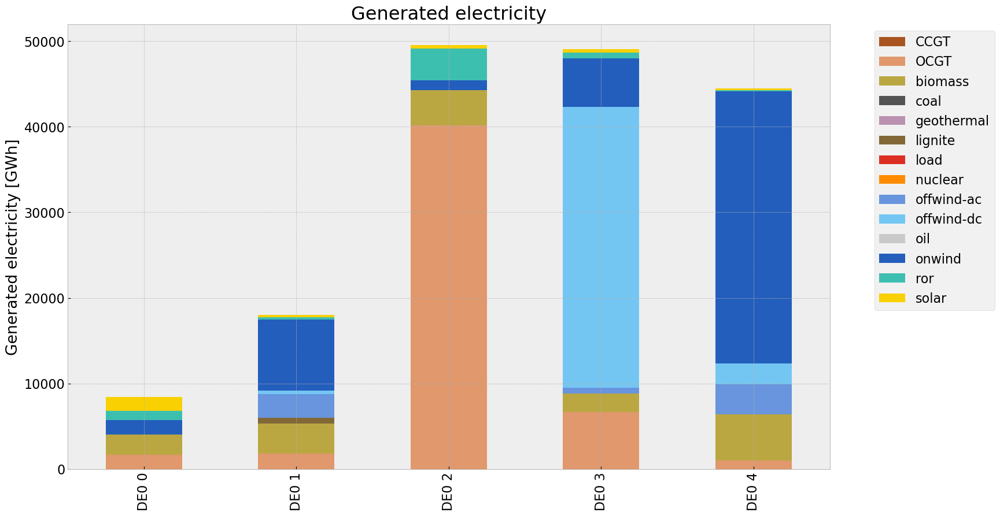

In [183]:
# consolidated generation table
carrier = n1.generators.carrier.unique()
df_tot_generation = n1.generators_t.p.sum()

generations = pd.Series(index = n1.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')
                
generations.fillna(0, inplace=True)
gen_inv = generations.unstack()/1000#Gwh


gen_inv = gen_power_table(n1,colors_gen_table)



## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3550636783.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3550636783.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3550636783.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3550636783.py:25: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=en

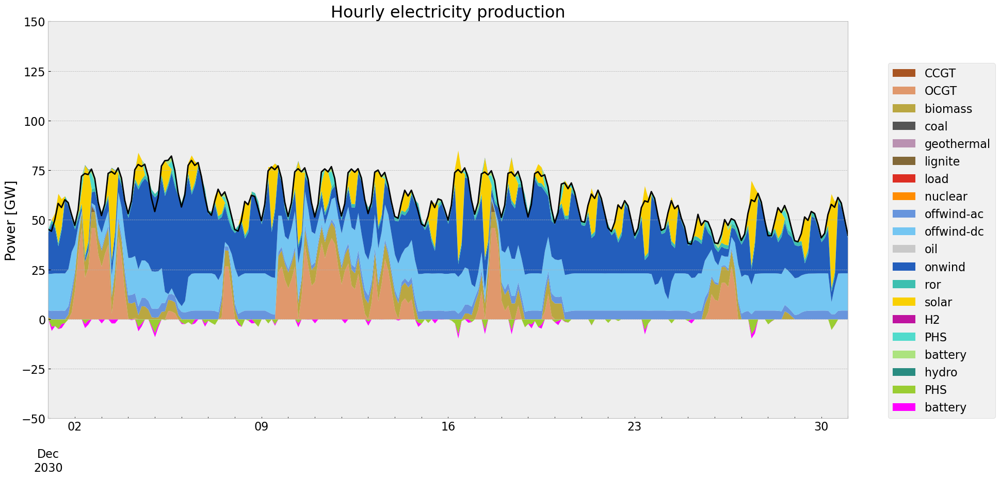

In [184]:
gen_curve(n1, '2030-12-01', '2030-12-31', colors_gen)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3550636783.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3550636783.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3550636783.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  p_by_carrier.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3550636783.py:25: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time = pd.date_range(start=start_date, end=en

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pandas\plotting\_matplotlib\core.py:1794: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(None, 0)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3550636783.py:51: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  loads.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


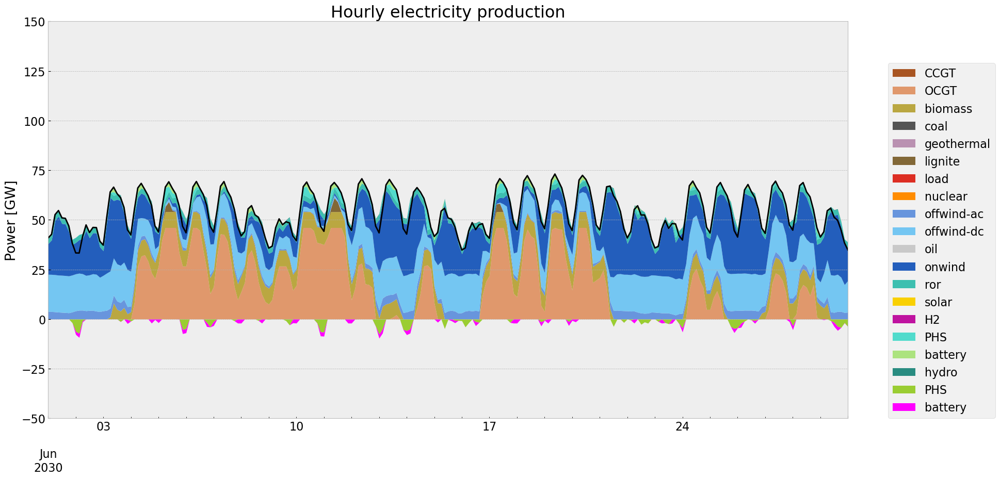

In [185]:
gen_curve(n1, '2030-06-1', '2030-06-30', colors_gen)

## Storage

carrier,H2,PHS,battery,hydro
bus,,,,
DE0 0,0.0,2.10300,0.000000,0.1200
DE0 1,0.0,0.99980,0.000000,NaN
DE0 2,0.0,1.85500,0.000000,0.1695
DE0 3,0.0,1.74142,2.054674,NaN
DE0 4,0.0,0.90000,0.000000,NaN


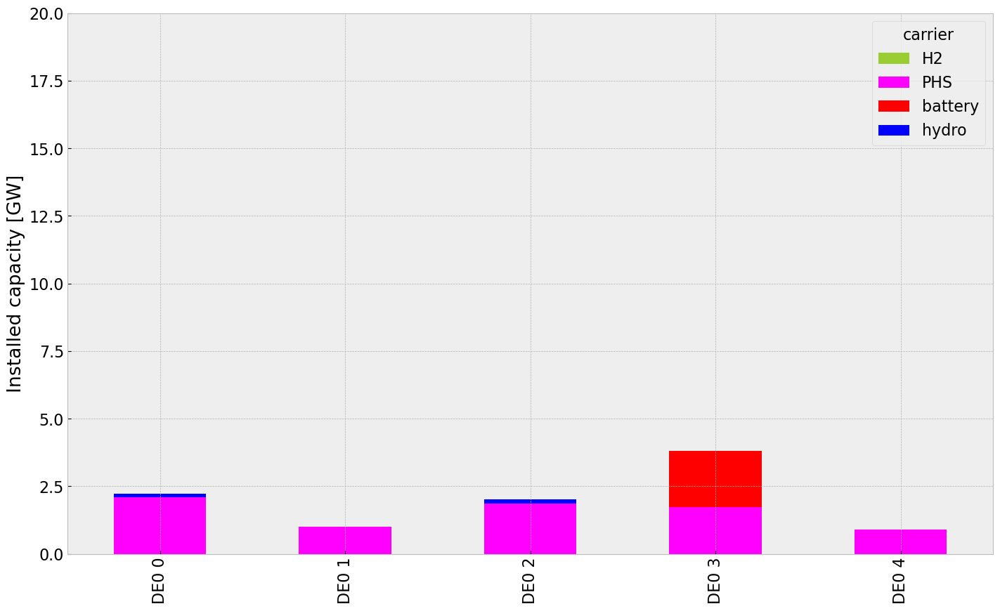

In [186]:
inst_store_table(n1)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\440258284.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\440258284.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')


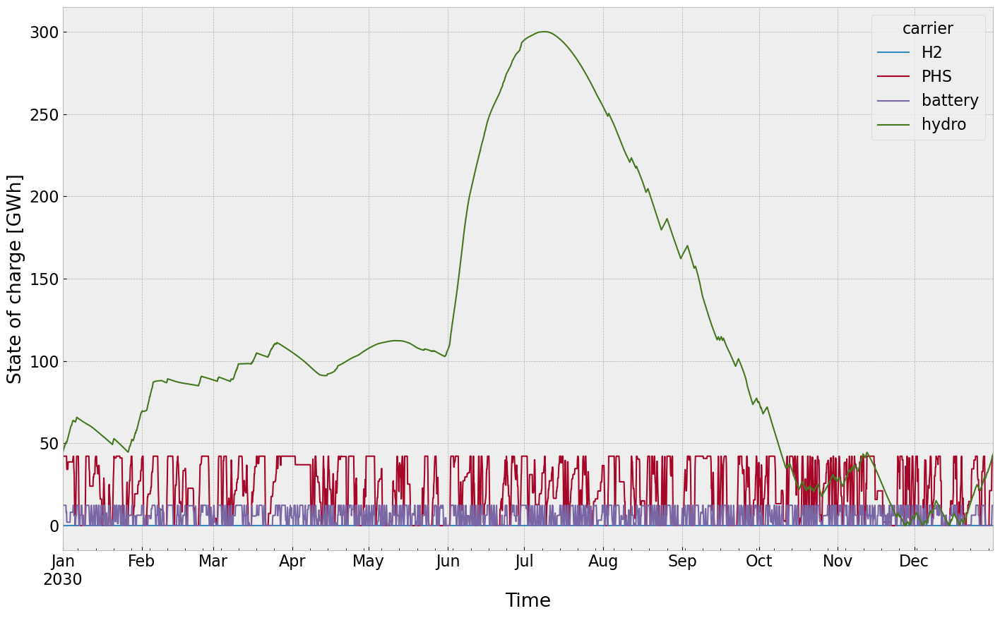

In [187]:
state_of_charge_plot(n1)


## Electricity Price


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


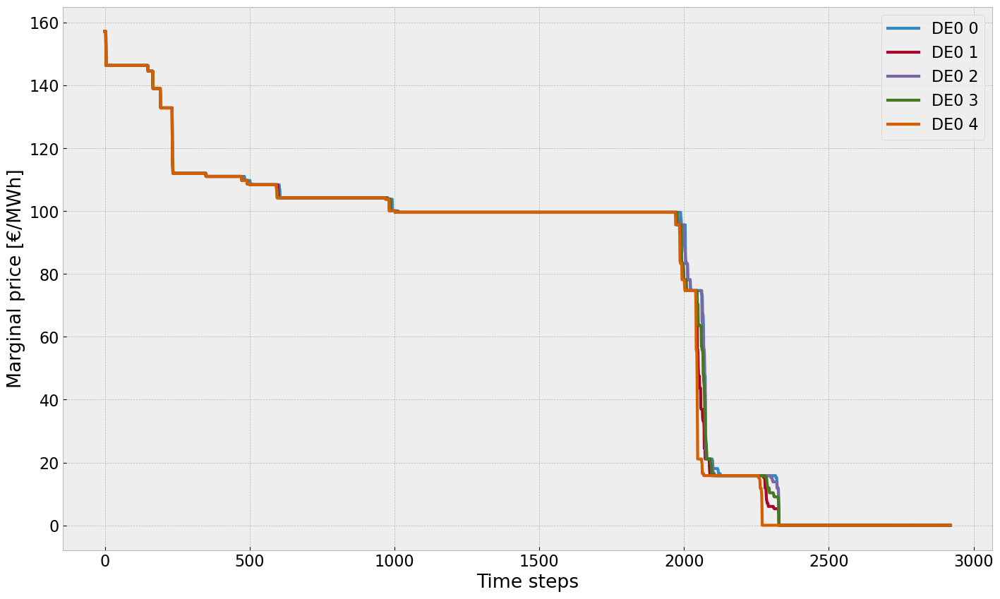

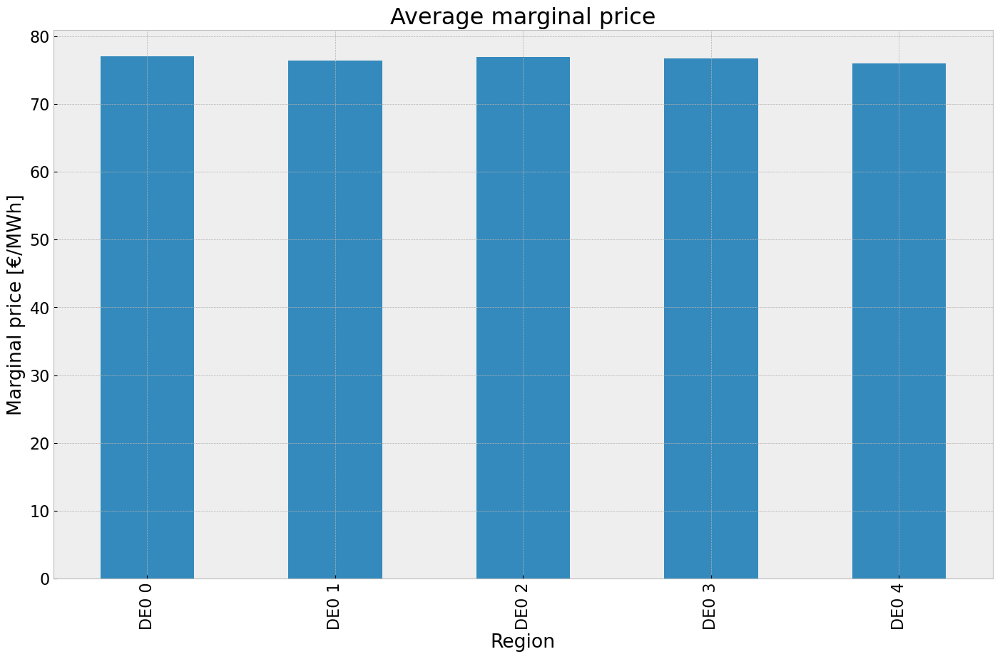

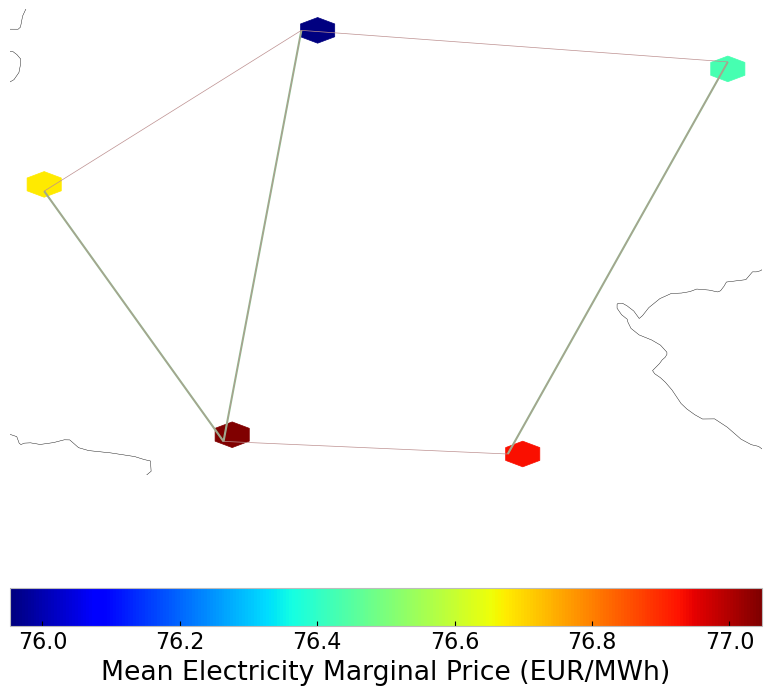

In [188]:
price_dur_curve_plot(n1)
price_regions_table(n1)
price_regions(n1)


## Emission

In [189]:
em_inv =em_table(n1)
em_inv

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,5.128102e+07,0.499437,0.1980,2.033018e+07
biomass,1.761582e+07,0.468000,0.0000,0.000000e+00
coal,0.000000e+00,0.329632,0.3361,0.000000e+00
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,6.451481e+05,0.358368,0.4069,7.325183e+05
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,0.000000e+00,0.328400,0.0000,0.000000e+00
offwind-ac,6.965397e+06,1.000000,0.0000,0.000000e+00


## 2. Scenario: perfect foresight with no additional investment

In [190]:
#copy network
n2=n.copy()

#pv cut
for column in n2.generators_t.p_max_pu.columns:
        if column.endswith('solar'):
                for index,row in n2.generators_t.p_max_pu[column].items():
                        if index >= cut_start and index <= cut_end:
                                new_p_max_pu = n2.generators_t.p_max_pu.at[index, column] * 0.0 #0.9
                                n2.generators_t.p_max_pu.at[index, column] = new_p_max_pu
                                #if new_p_max_pu<0:
                                #    n1.generators_t.p_max_pu.at[index, column] = 0

#set the optimal capacity of generators from the base scenario as the new minimum capacity 
for index, value in n2.generators.p_nom_extendable.items():
    if value:  
        n2.generators.at[index, 'p_nom'] = n.generators.at[index, 'p_nom_opt']
        #n2.generators.at[index, 'p_nom_max'] = n.generators.at[index, 'p_nom_opt']
        n2.generators.at[index,'p_nom_extendable'] = False

#set the optimal capacity of storage units from the base scenario as the new minimum capacity 
for index, value in n2.storage_units.p_nom_extendable.items():
    if value:  
        n2.storage_units.at[index, 'p_nom'] = n.storage_units.at[index, 'p_nom_opt']
        #n2.storage_units.at[index, 'p_nom_max'] = n.storage_units.at[index, 'p_nom_opt']
        n2.storage_units.at[index,'p_nom_extendable'] = False

#set the optimal capacity of stores from the base scenario as the new minimum capacity 
for index, value in n2.stores.e_nom_extendable.items():
    if value:  
        n2.stores.at[index, 'e_nom'] = n.stores.at[index, 'e_nom_opt']
        #n2.stores.at[index, 'e_nom_max'] = n.stores.at[index, 'e_nom_opt']
        n2.stores.at[index, 'e_nom_extendable'] =False

#set the optimal capacity of lines from the base scenario as the new minimum capacity 
for index, value in n2.lines.s_nom_extendable.items():
    if value:  
        n2.lines.at[index, 's_nom'] = n.lines.at[index, 's_nom_opt']
        #n2.lines.at[index, 's_nom_max'] = n.lines.at[index, 's_nom_opt']
        n2.lines.at[index, 's_nom_extendable'] =False

In [191]:
n2.optimize.create_model()

Linopy LP model

Variables:
----------
 * Link-p_nom (Link-ext)
 * Generator-p (snapshot, Generator)
 * Line-s (snapshot, Line)
 * Link-p (snapshot, Link)
 * StorageUnit-p_dispatch (snapshot, StorageUnit)
 * StorageUnit-p_store (snapshot, StorageUnit)
 * StorageUnit-state_of_charge (snapshot, StorageUnit)
 * StorageUnit-spill (snapshot, StorageUnit)

Constraints:
------------
 * Link-ext-p_nom-lower (Link-ext)
 * Link-ext-p_nom-upper (Link-ext)
 * Generator-fix-p-lower (snapshot, Generator-fix)
 * Generator-fix-p-upper (snapshot, Generator-fix)
 * Line-fix-s-lower (snapshot, Line-fix)
 * Line-fix-s-upper (snapshot, Line-fix)
 * Link-ext-p-lower (snapshot, Link-ext)
 * Link-ext-p-upper (snapshot, Link-ext)
 * StorageUnit-fix-p_dispatch-lower (snapshot, StorageUnit-fix)
 * StorageUnit-fix-p_dispatch-upper (snapshot, StorageUnit-fix)
 * StorageUnit-fix-p_store-lower (snapshot, StorageUnit-fix)
 * StorageUnit-fix-p_store-upper (snapshot, StorageUnit-fix)
 * StorageUnit-fix-state_of_charge-

In [192]:
n2.optimize(solver_name ='gurobi')
#optimize.optimize_with_rolling_horizon(n2, horizon=24, overlap=0, solver_name='gurobi')

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 8/8 [00:01<00:00,  5.45it/s]
INFO:linopy.io: Writing time: 9.7s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-man9pcxu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-man9pcxu.lp


Reading time = 2.85 seconds


INFO:gurobipy:Reading time = 2.85 seconds


obj: 805927 rows, 373741 columns, 1316907 nonzeros


INFO:gurobipy:obj: 805927 rows, 373741 columns, 1316907 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 805927 rows, 373741 columns and 1316907 nonzeros


INFO:gurobipy:Optimize a model with 805927 rows, 373741 columns and 1316907 nonzeros


Model fingerprint: 0xe66dd33e


INFO:gurobipy:Model fingerprint: 0xe66dd33e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+01, 5e+02]


INFO:gurobipy:  Bounds range     [1e+01, 5e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 744623 rows and 152834 columns


INFO:gurobipy:Presolve removed 744623 rows and 152834 columns


Presolve time: 0.84s


INFO:gurobipy:Presolve time: 0.84s


Presolved: 61304 rows, 220907 columns, 366888 nonzeros


INFO:gurobipy:Presolved: 61304 rows, 220907 columns, 366888 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: dual simplex and barrier


INFO:gurobipy:Concurrent LP optimizer: dual simplex and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Ordering time: 0.06s


INFO:gurobipy:Ordering time: 0.06s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 3


INFO:gurobipy: Dense cols : 3


 AA' NZ     : 1.489e+05


INFO:gurobipy: AA' NZ     : 1.489e+05


 Factor NZ  : 1.008e+06 (roughly 120 MB of memory)


INFO:gurobipy: Factor NZ  : 1.008e+06 (roughly 120 MB of memory)


 Factor Ops : 1.984e+07 (less than 1 second per iteration)


INFO:gurobipy: Factor Ops : 1.984e+07 (less than 1 second per iteration)


 Threads    : 3


INFO:gurobipy: Threads    : 3


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   7.24800751e+12 -4.40865623e+13  3.03e+05 1.35e+04  8.56e+08     1s


INFO:gurobipy:   0   7.24800751e+12 -4.40865623e+13  3.03e+05 1.35e+04  8.56e+08     1s


   1   2.83049766e+12 -2.06425319e+13  4.28e+04 2.20e+03  1.44e+08     2s


INFO:gurobipy:   1   2.83049766e+12 -2.06425319e+13  4.28e+04 2.20e+03  1.44e+08     2s


   2   2.31915749e+12 -7.81645746e+12  3.40e+04 6.44e+01  7.47e+07     2s


INFO:gurobipy:   2   2.31915749e+12 -7.81645746e+12  3.40e+04 6.44e+01  7.47e+07     2s


   3   3.42259206e+11 -3.01829187e+12  6.46e+02 6.44e+00  8.32e+06     2s


INFO:gurobipy:   3   3.42259206e+11 -3.01829187e+12  6.46e+02 6.44e+00  8.32e+06     2s


   4   6.04302228e+10 -3.79735623e+11  3.61e+01 6.25e-01  1.01e+06     2s


INFO:gurobipy:   4   6.04302228e+10 -3.79735623e+11  3.61e+01 6.25e-01  1.01e+06     2s


   5   4.44560303e+10 -2.35820110e+11  1.20e+01 3.97e-01  6.37e+05     2s


INFO:gurobipy:   5   4.44560303e+10 -2.35820110e+11  1.20e+01 3.97e-01  6.37e+05     2s


   6   3.88920000e+10 -1.81496095e+11  6.21e+00 3.17e-01  5.00e+05     2s


INFO:gurobipy:   6   3.88920000e+10 -1.81496095e+11  6.21e+00 3.17e-01  5.00e+05     2s


   7   3.62663909e+10 -2.93056029e+10  4.76e+00 7.38e-02  1.49e+05     2s


INFO:gurobipy:   7   3.62663909e+10 -2.93056029e+10  4.76e+00 7.38e-02  1.49e+05     2s


   8   2.88086081e+10  4.11591914e+09  1.46e+00 2.41e-02  5.59e+04     2s


INFO:gurobipy:   8   2.88086081e+10  4.11591914e+09  1.46e+00 2.41e-02  5.59e+04     2s


   9   2.42537538e+10  1.51531747e+10  4.62e-01 6.75e-03  2.06e+04     3s


INFO:gurobipy:   9   2.42537538e+10  1.51531747e+10  4.62e-01 6.75e-03  2.06e+04     3s


  10   2.26709893e+10  1.72497849e+10  2.66e-01 3.70e-03  1.23e+04     3s


INFO:gurobipy:  10   2.26709893e+10  1.72497849e+10  2.66e-01 3.70e-03  1.23e+04     3s


  11   2.14326775e+10  1.89248966e+10  1.24e-01 1.55e-03  5.68e+03     3s


INFO:gurobipy:  11   2.14326775e+10  1.89248966e+10  1.24e-01 1.55e-03  5.68e+03     3s


  12   2.09877024e+10  1.95699519e+10  7.76e-02 7.46e-04  3.21e+03     3s


INFO:gurobipy:  12   2.09877024e+10  1.95699519e+10  7.76e-02 7.46e-04  3.21e+03     3s


  13   2.06265704e+10  1.98365771e+10  4.17e-02 4.12e-04  1.79e+03     3s


INFO:gurobipy:  13   2.06265704e+10  1.98365771e+10  4.17e-02 4.12e-04  1.79e+03     3s


  14   2.04211283e+10  2.00233815e+10  2.16e-02 1.83e-04  9.00e+02     4s


INFO:gurobipy:  14   2.04211283e+10  2.00233815e+10  2.16e-02 1.83e-04  9.00e+02     4s


  15   2.03235221e+10  2.01066288e+10  1.25e-02 8.15e-05  4.91e+02     4s


INFO:gurobipy:  15   2.03235221e+10  2.01066288e+10  1.25e-02 8.15e-05  4.91e+02     4s


  16   2.02668979e+10  2.01395635e+10  7.16e-03 4.69e-05  2.88e+02     4s


INFO:gurobipy:  16   2.02668979e+10  2.01395635e+10  7.16e-03 4.69e-05  2.88e+02     4s


  17   2.02360430e+10  2.01614234e+10  4.31e-03 2.42e-05  1.69e+02     4s


INFO:gurobipy:  17   2.02360430e+10  2.01614234e+10  4.31e-03 2.42e-05  1.69e+02     4s


  18   2.02237773e+10  2.01720439e+10  3.21e-03 1.34e-05  1.17e+02     4s


INFO:gurobipy:  18   2.02237773e+10  2.01720439e+10  3.21e-03 1.34e-05  1.17e+02     4s


  19   2.02158582e+10  2.01758041e+10  2.50e-03 9.95e-06  9.07e+01     4s


INFO:gurobipy:  19   2.02158582e+10  2.01758041e+10  2.50e-03 9.95e-06  9.07e+01     4s


  20   2.02065536e+10  2.01789392e+10  1.70e-03 7.14e-06  6.25e+01     4s


INFO:gurobipy:  20   2.02065536e+10  2.01789392e+10  1.70e-03 7.14e-06  6.25e+01     4s


  21   2.02044319e+10  2.01806651e+10  1.51e-03 5.63e-06  5.38e+01     4s


INFO:gurobipy:  21   2.02044319e+10  2.01806651e+10  1.51e-03 5.63e-06  5.38e+01     4s


  22   2.01963400e+10  2.01821803e+10  8.01e-04 4.35e-06  3.21e+01     5s


INFO:gurobipy:  22   2.01963400e+10  2.01821803e+10  8.01e-04 4.35e-06  3.21e+01     5s


  23   2.01944646e+10  2.01831688e+10  6.32e-04 3.55e-06  2.56e+01     5s


INFO:gurobipy:  23   2.01944646e+10  2.01831688e+10  6.32e-04 3.55e-06  2.56e+01     5s


  24   2.01938093e+10  2.01853496e+10  5.71e-04 1.82e-06  1.91e+01     5s


INFO:gurobipy:  24   2.01938093e+10  2.01853496e+10  5.71e-04 1.82e-06  1.91e+01     5s


  25   2.01901734e+10  2.01870344e+10  2.18e-04 5.29e-07  7.10e+00     5s


INFO:gurobipy:  25   2.01901734e+10  2.01870344e+10  2.18e-04 5.29e-07  7.10e+00     5s


  26   2.01882698e+10  2.01875926e+10  3.72e-05 1.21e-07  1.53e+00     5s


INFO:gurobipy:  26   2.01882698e+10  2.01875926e+10  3.72e-05 1.21e-07  1.53e+00     5s


  27   2.01879798e+10  2.01877501e+10  1.23e-05 3.91e-08  5.20e-01     5s


INFO:gurobipy:  27   2.01879798e+10  2.01877501e+10  1.23e-05 3.91e-08  5.20e-01     5s


  28   2.01879251e+10  2.01877937e+10  7.98e-06 1.80e-08  2.97e-01     6s


INFO:gurobipy:  28   2.01879251e+10  2.01877937e+10  7.98e-06 1.80e-08  2.97e-01     6s


  29   2.01878971e+10  2.01878066e+10  5.68e-06 1.26e-08  2.05e-01     6s


INFO:gurobipy:  29   2.01878971e+10  2.01878066e+10  5.68e-06 1.26e-08  2.05e-01     6s


  30   2.01878785e+10  2.01878224e+10  4.01e-06 5.83e-09  1.27e-01     6s


INFO:gurobipy:  30   2.01878785e+10  2.01878224e+10  4.01e-06 5.83e-09  1.27e-01     6s


  31   2.01878598e+10  2.01878292e+10  5.65e-06 3.18e-09  6.94e-02     6s


INFO:gurobipy:  31   2.01878598e+10  2.01878292e+10  5.65e-06 3.18e-09  6.94e-02     6s


  32   2.01878564e+10  2.01878294e+10  5.14e-06 3.11e-09  6.11e-02     6s


INFO:gurobipy:  32   2.01878564e+10  2.01878294e+10  5.14e-06 3.11e-09  6.11e-02     6s


  33   2.01878540e+10  2.01878330e+10  4.46e-06 1.68e-09  4.75e-02     6s


INFO:gurobipy:  33   2.01878540e+10  2.01878330e+10  4.46e-06 1.68e-09  4.75e-02     6s


  34   2.01878456e+10  2.01878349e+10  2.42e-06 1.01e-09  2.42e-02     6s


INFO:gurobipy:  34   2.01878456e+10  2.01878349e+10  2.42e-06 1.01e-09  2.42e-02     6s


  35   2.01878432e+10  2.01878369e+10  1.58e-06 4.22e-10  1.44e-02     7s


INFO:gurobipy:  35   2.01878432e+10  2.01878369e+10  1.58e-06 4.22e-10  1.44e-02     7s


  36   2.01878413e+10  2.01878377e+10  9.23e-06 2.01e-10  8.18e-03     7s


INFO:gurobipy:  36   2.01878413e+10  2.01878377e+10  9.23e-06 2.01e-10  8.18e-03     7s


  37   2.01878410e+10  2.01878378e+10  8.14e-06 1.74e-10  7.20e-03     7s


INFO:gurobipy:  37   2.01878410e+10  2.01878378e+10  8.14e-06 1.74e-10  7.20e-03     7s


INFO:gurobipy:


Barrier performed 37 iterations in 7.00 seconds (2.64 work units)


INFO:gurobipy:Barrier performed 37 iterations in 7.00 seconds (2.64 work units)


Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:Barrier solve interrupted - model solved by another algorithm


INFO:gurobipy:


INFO:gurobipy:


Solved with dual simplex


INFO:gurobipy:Solved with dual simplex


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


   56310    2.0187839e+10   0.000000e+00   0.000000e+00      7s


INFO:gurobipy:   56310    2.0187839e+10   0.000000e+00   0.000000e+00      7s


INFO:gurobipy:


Solved in 56310 iterations and 7.46 seconds (4.00 work units)


INFO:gurobipy:Solved in 56310 iterations and 7.46 seconds (4.00 work units)


Optimal objective  2.018783857e+10


INFO:gurobipy:Optimal objective  2.018783857e+10
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 373741 primals, 805927 duals
Objective: 2.02e+10
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper,

('ok', 'optimal')

In [193]:
tot_cos_noinv=n2.objective/1e9 #billion €
system_cost_noinv = system_cost(n2) #million €/a
marg_price_region_noinv = n2.buses_t.marginal_price.mean()
stat_noinv = n2.statistics()

## Installed Capacity

Since expansion is not allowed in this scenario, the installed capacity will equal to that of the base scenario.

<Figure size 640x480 with 0 Axes>

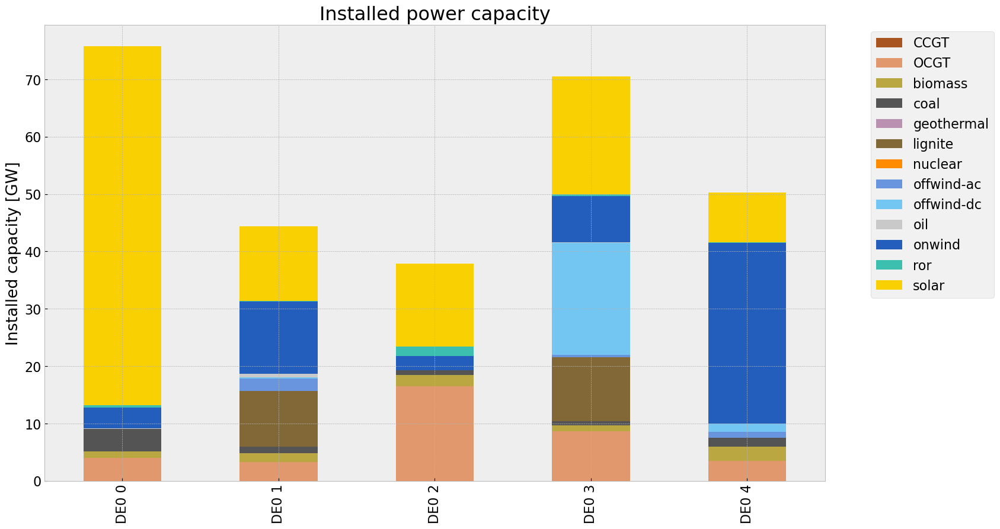

In [194]:
# consolidated istalled cap without load_shedding

capacities_noinv = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_noinv.fillna(0, inplace=True)
gen = (capacities_noinv.unstack()/1000).drop(columns=['load'],inplace=False)


cap_noinv = inst_cap_table(n2, color_cap)



## Generation

<Figure size 640x480 with 0 Axes>

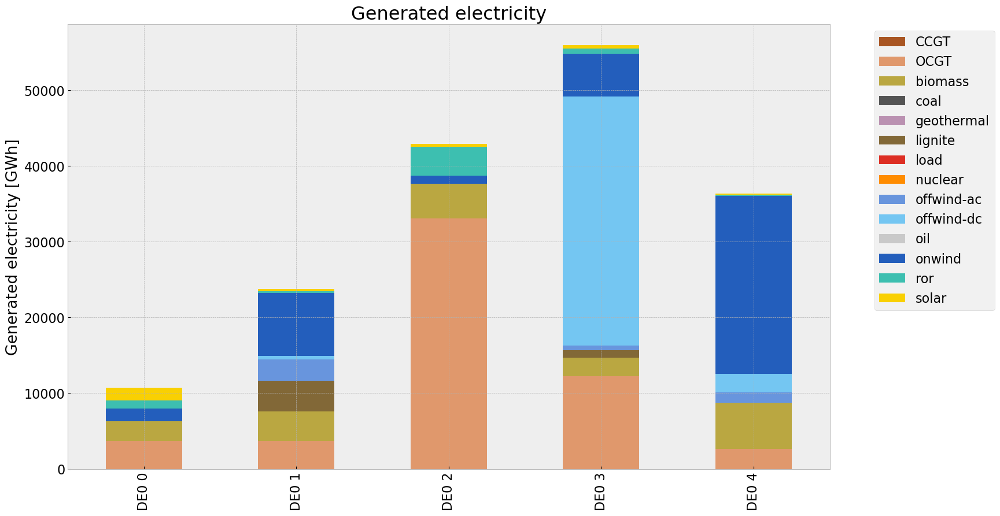

In [195]:
# consolidated generation table
carrier = n2.generators.carrier.unique()
df_tot_generation = n2.generators_t.p.sum()

generations = pd.Series(index = n2.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')

generations.fillna(0, inplace=True)
gen_noinv = generations.unstack()/1000#GWh

gen_noinv= gen_power_table(n2,colors_gen_table)




## Snapshot

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\2615338355.py:1: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\2615338355.py:2: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3550636783.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3550636783.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storage_

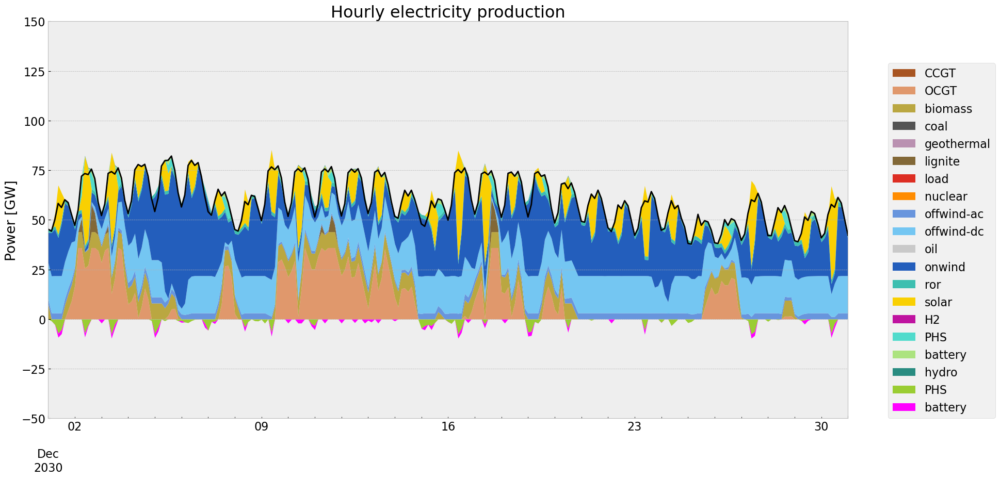

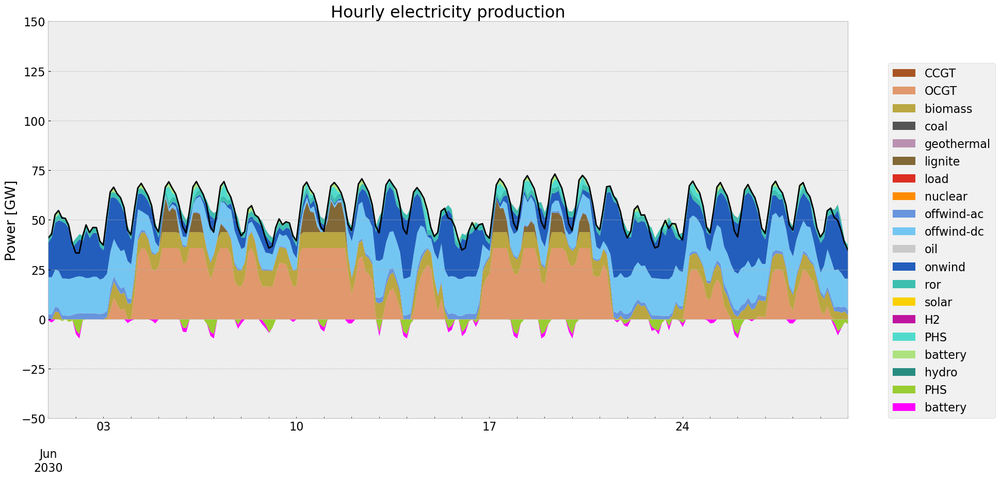

In [196]:
p = n2.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
sto = n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n2, '2030-12-01', '2030-12-31', colors_gen)
gen_curve(n2, '2030-06-01', '2030-06-30', colors_gen)


C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\440258284.py:3: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  soc = n.storage_units_t.state_of_charge.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\440258284.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  soc.index = pd.date_range(start='2030-01-01', end='2030-12-31 21:00:00', freq='3H')
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\1075419132.py:4: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\1075419132.py:4: FutureWarning: 'H' is deprecated and will be removed in a future

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,5.532214e+07,0.499437,0.1980,2.193227e+07
biomass,1.970616e+07,0.468000,0.0000,0.000000e+00
coal,3.749390e+02,0.329632,0.3361,3.822958e+02
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,4.988935e+06,0.358368,0.4069,5.664569e+06
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,0.000000e+00,0.328400,0.0000,0.000000e+00
offwind-ac,4.833799e+06,1.000000,0.0000,0.000000e+00


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


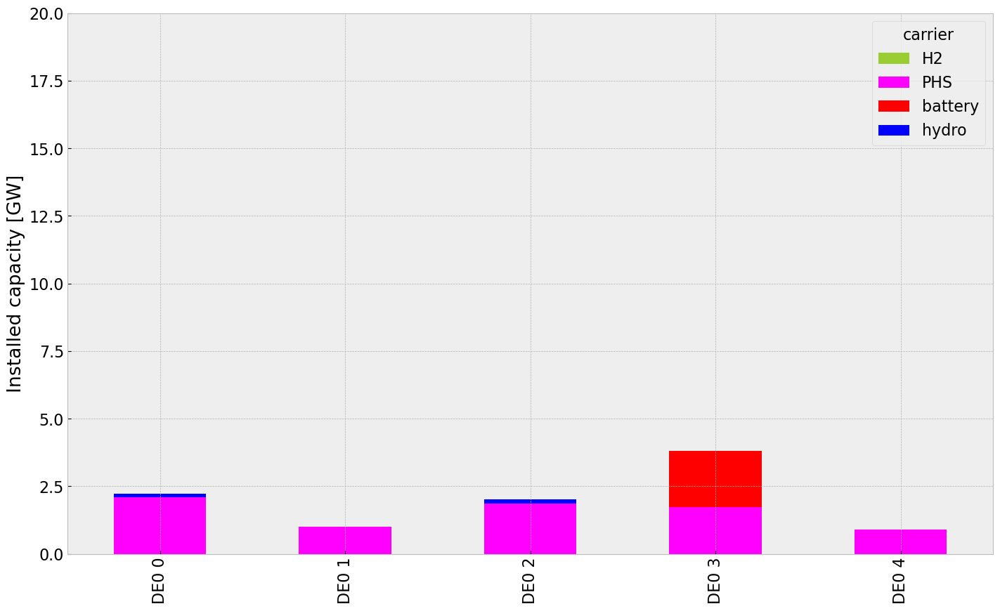

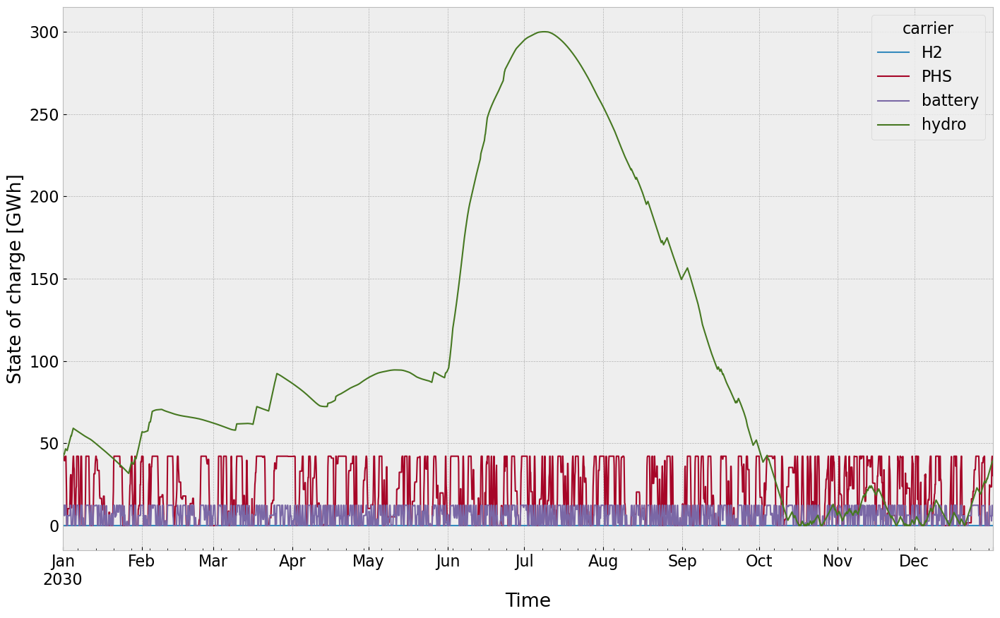

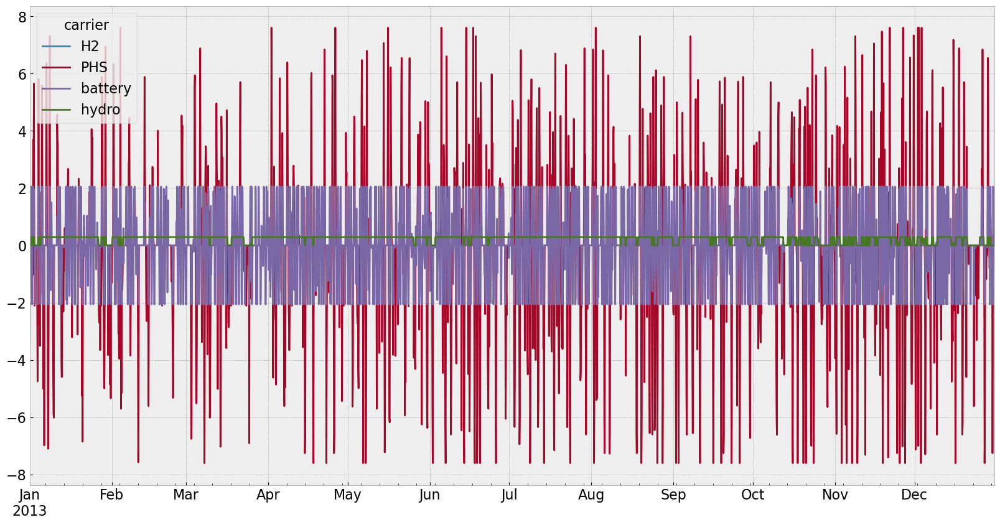

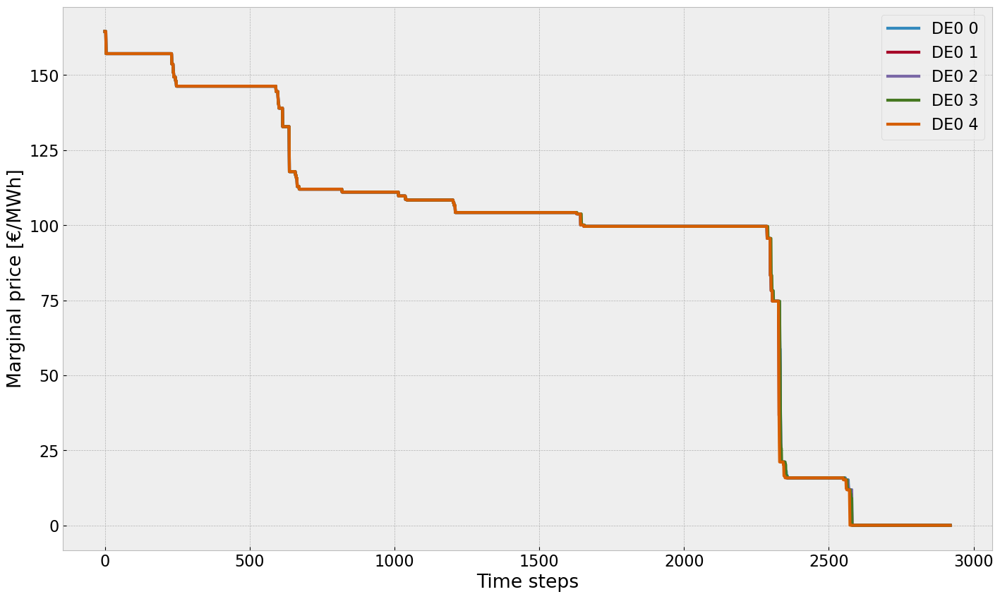

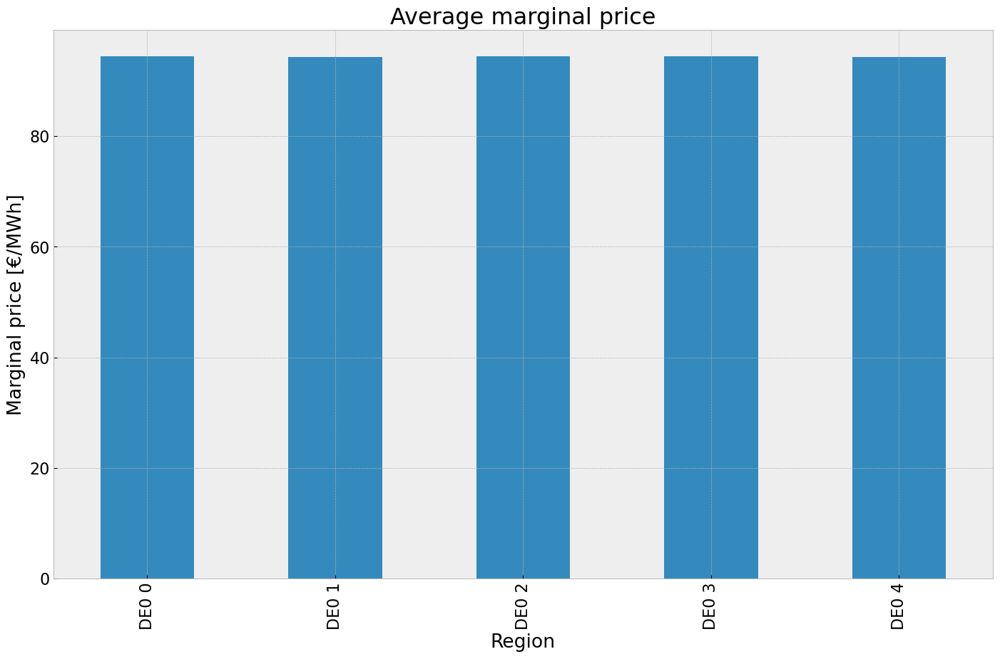

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


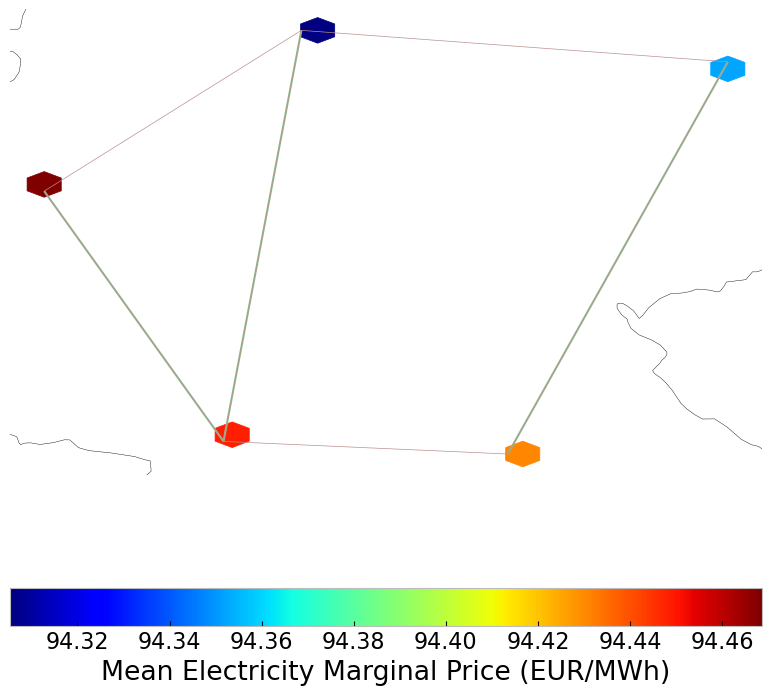

In [197]:
#storage unit & stores
inst_store_table(n2)
state_of_charge_plot(n2)
n2.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))
#price
price_dur_curve_plot(n2)
price_regions_table(n2)
price_regions(n2)
#emission
em_noinv =em_table(n2)
em_noinv

## 3. Scenario: rolling horizon foresight with no additional investment

In [198]:
n3= n2.copy()
horizon = 24
#n3.global_constraints.loc['CO2Limit','constant']= n.global_constraints.loc['CO2Limit','constant']/(len(n3.snapshots)/horizon)
n3.optimize.create_model()
optimize.optimize_with_rolling_horizon(n3, horizon=horizon, overlap=0, solver_name='gurobi')

INFO:pypsa.optimization.abstract:Optimizing network for snapshot horizon [2013-01-01 00:00:00:2013-01-03 21:00:00] (1/122).
INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xkxe7l3l.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xkxe7l3l.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x176a3fc2


INFO:gurobipy:Model fingerprint: 0x176a3fc2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1248 columns


INFO:gurobipy:Presolve removed 6127 rows and 1248 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1827 columns, 3024 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1827 columns, 3024 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     414    1.4228377e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     414    1.4228377e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 414 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 414 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.422837654e+06


INFO:gurobipy:Optimal objective  1.422837654e+06
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.42e+06
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ke7b2ht4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ke7b2ht4.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xb7afe09d


INFO:gurobipy:Model fingerprint: 0xb7afe09d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6127 rows and 1249 columns


INFO:gurobipy:Presolve removed 6127 rows and 1249 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1826 columns, 3023 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1826 columns, 3023 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     433    4.7793261e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     433    4.7793261e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 433 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 433 iterations and 0.05 seconds (0.01 work units)


Optimal objective  4.779326122e+07


INFO:gurobipy:Optimal objective  4.779326122e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 4.78e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v3r66vg_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v3r66vg_.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xdb221b33


INFO:gurobipy:Model fingerprint: 0xdb221b33


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6127 rows and 1257 columns


INFO:gurobipy:Presolve removed 6127 rows and 1257 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1818 columns, 3015 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1818 columns, 3015 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     477    2.5041268e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     477    2.5041268e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 477 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 477 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.504126811e+08


INFO:gurobipy:Optimal objective  2.504126811e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.50e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9451q86i.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9451q86i.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x48b5069c


INFO:gurobipy:Model fingerprint: 0x48b5069c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6127 rows and 1266 columns


INFO:gurobipy:Presolve removed 6127 rows and 1266 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1809 columns, 3006 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1809 columns, 3006 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     462    2.4509394e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     462    2.4509394e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 462 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 462 iterations and 0.06 seconds (0.01 work units)


Optimal objective  2.450939369e+08


INFO:gurobipy:Optimal objective  2.450939369e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.45e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w_un7gp5.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w_un7gp5.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xf09fca1b


INFO:gurobipy:Model fingerprint: 0xf09fca1b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6127 rows and 1263 columns


INFO:gurobipy:Presolve removed 6127 rows and 1263 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1812 columns, 3009 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1812 columns, 3009 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     449    3.4654930e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     449    3.4654930e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 449 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 449 iterations and 0.06 seconds (0.01 work units)


Optimal objective  3.465492953e+08


INFO:gurobipy:Optimal objective  3.465492953e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 3.47e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bajp_x_u.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bajp_x_u.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x771cd45a


INFO:gurobipy:Model fingerprint: 0x771cd45a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6127 rows and 1257 columns


INFO:gurobipy:Presolve removed 6127 rows and 1257 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 504 rows, 1818 columns, 3015 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1818 columns, 3015 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     455    3.2783114e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     455    3.2783114e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 455 iterations and 0.08 seconds (0.01 work units)


INFO:gurobipy:Solved in 455 iterations and 0.08 seconds (0.01 work units)


Optimal objective  3.278311426e+08


INFO:gurobipy:Optimal objective  3.278311426e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 3.28e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vrmyx1m_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vrmyx1m_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x418d44a4


INFO:gurobipy:Model fingerprint: 0x418d44a4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1255 columns


INFO:gurobipy:Presolve removed 6127 rows and 1255 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1820 columns, 3017 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1820 columns, 3017 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     513    4.9552259e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     513    4.9552259e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 513 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 513 iterations and 0.05 seconds (0.01 work units)


Optimal objective  4.955225874e+07


INFO:gurobipy:Optimal objective  4.955225874e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 4.96e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-eycuimgx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-eycuimgx.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x726dc664


INFO:gurobipy:Model fingerprint: 0x726dc664


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6127 rows and 1282 columns


INFO:gurobipy:Presolve removed 6127 rows and 1282 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1793 columns, 2990 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1793 columns, 2990 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     443    3.5175748e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     443    3.5175748e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 443 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 443 iterations and 0.05 seconds (0.01 work units)


Optimal objective  3.517574794e+08


INFO:gurobipy:Optimal objective  3.517574794e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 3.52e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ymr82p53.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ymr82p53.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x29dacc16


INFO:gurobipy:Model fingerprint: 0x29dacc16


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6127 rows and 1264 columns


INFO:gurobipy:Presolve removed 6127 rows and 1264 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1811 columns, 3008 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1811 columns, 3008 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     449    1.1743034e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     449    1.1743034e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 449 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 449 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.174303428e+08


INFO:gurobipy:Optimal objective  1.174303428e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.17e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.37s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xqf3vqlq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xqf3vqlq.lp


Reading time = 0.05 seconds


INFO:gurobipy:Reading time = 0.05 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x2cffb129


INFO:gurobipy:Model fingerprint: 0x2cffb129


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1248 columns


INFO:gurobipy:Presolve removed 6127 rows and 1248 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1827 columns, 3024 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1827 columns, 3024 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     459    1.4069229e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     459    1.4069229e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 459 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 459 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.406922881e+07


INFO:gurobipy:Optimal objective  1.406922881e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.41e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-irwos96t.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-irwos96t.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x31295efc


INFO:gurobipy:Model fingerprint: 0x31295efc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6127 rows and 1248 columns


INFO:gurobipy:Presolve removed 6127 rows and 1248 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1827 columns, 3024 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1827 columns, 3024 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     454    5.2814472e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     454    5.2814472e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 454 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 454 iterations and 0.04 seconds (0.01 work units)


Optimal objective  5.281447210e+07


INFO:gurobipy:Optimal objective  5.281447210e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 5.28e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y_b447re.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y_b447re.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x391547f3


INFO:gurobipy:Model fingerprint: 0x391547f3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1248 columns


INFO:gurobipy:Presolve removed 6127 rows and 1248 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1827 columns, 3024 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1827 columns, 3024 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     421    8.0826087e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     421    8.0826087e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 421 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 421 iterations and 0.05 seconds (0.01 work units)


Optimal objective  8.082608658e+06


INFO:gurobipy:Optimal objective  8.082608658e+06
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 8.08e+06
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b56ini9o.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-b56ini9o.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x4439f356


INFO:gurobipy:Model fingerprint: 0x4439f356


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6127 rows and 1251 columns


INFO:gurobipy:Presolve removed 6127 rows and 1251 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1824 columns, 3021 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1824 columns, 3021 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     388    2.8330273e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     388    2.8330273e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 388 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 388 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.833027340e+08


INFO:gurobipy:Optimal objective  2.833027340e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.83e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j2sjxzet.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j2sjxzet.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x68bab04b


INFO:gurobipy:Model fingerprint: 0x68bab04b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6127 rows and 1278 columns


INFO:gurobipy:Presolve removed 6127 rows and 1278 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 504 rows, 1797 columns, 2994 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1797 columns, 2994 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     460    1.6038828e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     460    1.6038828e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 460 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 460 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.603882793e+08


INFO:gurobipy:Optimal objective  1.603882793e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.60e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_l0uv1v6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_l0uv1v6.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x9ead473f


INFO:gurobipy:Model fingerprint: 0x9ead473f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6127 rows and 1274 columns


INFO:gurobipy:Presolve removed 6127 rows and 1274 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1801 columns, 2998 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1801 columns, 2998 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     465    2.7928547e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     465    2.7928547e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 465 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 465 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.792854710e+08


INFO:gurobipy:Optimal objective  2.792854710e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.79e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-21c7l60e.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-21c7l60e.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xee814b9a


INFO:gurobipy:Model fingerprint: 0xee814b9a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6127 rows and 1348 columns


INFO:gurobipy:Presolve removed 6127 rows and 1348 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1727 columns, 2924 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1727 columns, 2924 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     491    3.6066710e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     491    3.6066710e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 491 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 491 iterations and 0.05 seconds (0.01 work units)


Optimal objective  3.606670970e+08


INFO:gurobipy:Optimal objective  3.606670970e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 3.61e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tfkjepeo.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tfkjepeo.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xc0feba6f


INFO:gurobipy:Model fingerprint: 0xc0feba6f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6127 rows and 1280 columns


INFO:gurobipy:Presolve removed 6127 rows and 1280 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1795 columns, 2992 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1795 columns, 2992 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     442    2.2812178e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     442    2.2812178e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 442 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 442 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.281217818e+08


INFO:gurobipy:Optimal objective  2.281217818e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.28e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ujj3ag3b.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ujj3ag3b.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x0a8289d6


INFO:gurobipy:Model fingerprint: 0x0a8289d6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1248 columns


INFO:gurobipy:Presolve removed 6127 rows and 1248 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1827 columns, 3024 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1827 columns, 3024 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     542    1.4958727e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     542    1.4958727e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 542 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 542 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.495872692e+08


INFO:gurobipy:Optimal objective  1.495872692e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.50e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7g1y2wnu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7g1y2wnu.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x51363c59


INFO:gurobipy:Model fingerprint: 0x51363c59


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6127 rows and 1254 columns


INFO:gurobipy:Presolve removed 6127 rows and 1254 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1821 columns, 3018 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1821 columns, 3018 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     477    1.4738535e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     477    1.4738535e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 477 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 477 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.473853481e+08


INFO:gurobipy:Optimal objective  1.473853481e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.47e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qyehoqer.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qyehoqer.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x70838a82


INFO:gurobipy:Model fingerprint: 0x70838a82


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6127 rows and 1276 columns


INFO:gurobipy:Presolve removed 6127 rows and 1276 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1799 columns, 2996 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1799 columns, 2996 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     475    3.1574749e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     475    3.1574749e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 475 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 475 iterations and 0.05 seconds (0.01 work units)


Optimal objective  3.157474864e+08


INFO:gurobipy:Optimal objective  3.157474864e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 3.16e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xj3og42r.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xj3og42r.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x9ce5245b


INFO:gurobipy:Model fingerprint: 0x9ce5245b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6127 rows and 1271 columns


INFO:gurobipy:Presolve removed 6127 rows and 1271 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1804 columns, 3001 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1804 columns, 3001 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     448    1.8394795e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     448    1.8394795e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 448 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 448 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.839479545e+08


INFO:gurobipy:Optimal objective  1.839479545e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.84e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-q4zpnhzm.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-q4zpnhzm.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x66c4d900


INFO:gurobipy:Model fingerprint: 0x66c4d900


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6127 rows and 1266 columns


INFO:gurobipy:Presolve removed 6127 rows and 1266 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1809 columns, 3006 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1809 columns, 3006 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     504    1.9233948e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     504    1.9233948e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 504 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 504 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.923394821e+08


INFO:gurobipy:Optimal objective  1.923394821e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.92e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dijx9xrr.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dijx9xrr.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x33920107


INFO:gurobipy:Model fingerprint: 0x33920107


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1249 columns


INFO:gurobipy:Presolve removed 6127 rows and 1249 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1826 columns, 3023 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1826 columns, 3023 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     480    5.3479175e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     480    5.3479175e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 480 iterations and 0.11 seconds (0.01 work units)


INFO:gurobipy:Solved in 480 iterations and 0.11 seconds (0.01 work units)


Optimal objective  5.347917499e+06


INFO:gurobipy:Optimal objective  5.347917499e+06
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 5.35e+06
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-49sn_plc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-49sn_plc.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xe842ae20


INFO:gurobipy:Model fingerprint: 0xe842ae20


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6127 rows and 1257 columns


INFO:gurobipy:Presolve removed 6127 rows and 1257 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1818 columns, 3015 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1818 columns, 3015 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     468    2.5953340e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     468    2.5953340e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 468 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 468 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.595333982e+08


INFO:gurobipy:Optimal objective  2.595333982e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.60e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nm8rb8xj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nm8rb8xj.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x6760a392


INFO:gurobipy:Model fingerprint: 0x6760a392


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6127 rows and 1268 columns


INFO:gurobipy:Presolve removed 6127 rows and 1268 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1807 columns, 3004 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1807 columns, 3004 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     480    1.9570139e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     480    1.9570139e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 480 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 480 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.957013872e+08


INFO:gurobipy:Optimal objective  1.957013872e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.96e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-l9g3htvv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-l9g3htvv.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xeee73b7c


INFO:gurobipy:Model fingerprint: 0xeee73b7c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1252 columns


INFO:gurobipy:Presolve removed 6127 rows and 1252 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1823 columns, 3020 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1823 columns, 3020 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     427    7.1949456e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     427    7.1949456e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 427 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 427 iterations and 0.05 seconds (0.01 work units)


Optimal objective  7.194945639e+07


INFO:gurobipy:Optimal objective  7.194945639e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 7.19e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.27s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tvn1oqky.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tvn1oqky.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xc0a18624


INFO:gurobipy:Model fingerprint: 0xc0a18624


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1252 columns


INFO:gurobipy:Presolve removed 6127 rows and 1252 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1823 columns, 3020 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1823 columns, 3020 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     464    2.0280900e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     464    2.0280900e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 464 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 464 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.028089997e+08


INFO:gurobipy:Optimal objective  2.028089997e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.03e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-th6xs4v6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-th6xs4v6.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x93f6c86c


INFO:gurobipy:Model fingerprint: 0x93f6c86c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1248 columns


INFO:gurobipy:Presolve removed 6127 rows and 1248 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1827 columns, 3024 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1827 columns, 3024 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     453    9.8024403e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     453    9.8024403e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 453 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 453 iterations and 0.06 seconds (0.01 work units)


Optimal objective  9.802440271e+04


INFO:gurobipy:Optimal objective  9.802440271e+04
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 9.80e+04
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-05d4m9q6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-05d4m9q6.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x10dd3376


INFO:gurobipy:Model fingerprint: 0x10dd3376


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1250 columns


INFO:gurobipy:Presolve removed 6127 rows and 1250 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1825 columns, 3022 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1825 columns, 3022 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     472    9.6286075e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     472    9.6286075e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 472 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 472 iterations and 0.04 seconds (0.01 work units)


Optimal objective  9.628607538e+07


INFO:gurobipy:Optimal objective  9.628607538e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 9.63e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-52phm_j6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-52phm_j6.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x7e48ae2c


INFO:gurobipy:Model fingerprint: 0x7e48ae2c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6127 rows and 1259 columns


INFO:gurobipy:Presolve removed 6127 rows and 1259 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1816 columns, 3013 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1816 columns, 3013 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     451    2.0274175e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     451    2.0274175e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 451 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 451 iterations and 0.06 seconds (0.01 work units)


Optimal objective  2.027417468e+08


INFO:gurobipy:Optimal objective  2.027417468e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.03e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8kbzixr8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8kbzixr8.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xe5cf1954


INFO:gurobipy:Model fingerprint: 0xe5cf1954


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6127 rows and 1256 columns


INFO:gurobipy:Presolve removed 6127 rows and 1256 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1819 columns, 3016 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1819 columns, 3016 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     485    1.9632662e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     485    1.9632662e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 485 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 485 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.963266161e+08


INFO:gurobipy:Optimal objective  1.963266161e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.96e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bfygp30v.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-bfygp30v.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xc35899b0


INFO:gurobipy:Model fingerprint: 0xc35899b0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6127 rows and 1249 columns


INFO:gurobipy:Presolve removed 6127 rows and 1249 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1826 columns, 3023 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1826 columns, 3023 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     465    2.1565531e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     465    2.1565531e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 465 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 465 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.156553065e+08


INFO:gurobipy:Optimal objective  2.156553065e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.16e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s7gzmex2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-s7gzmex2.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x0401908d


INFO:gurobipy:Model fingerprint: 0x0401908d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6127 rows and 1261 columns


INFO:gurobipy:Presolve removed 6127 rows and 1261 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1814 columns, 3011 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1814 columns, 3011 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     476    1.7868752e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     476    1.7868752e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 476 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 476 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.786875185e+08


INFO:gurobipy:Optimal objective  1.786875185e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.79e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2t662zgx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2t662zgx.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x10bde89e


INFO:gurobipy:Model fingerprint: 0x10bde89e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6127 rows and 1249 columns


INFO:gurobipy:Presolve removed 6127 rows and 1249 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1826 columns, 3023 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1826 columns, 3023 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     489    2.3594349e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     489    2.3594349e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 489 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 489 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.359434912e+08


INFO:gurobipy:Optimal objective  2.359434912e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.36e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-z14suahp.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-z14suahp.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xf1fa78e1


INFO:gurobipy:Model fingerprint: 0xf1fa78e1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6127 rows and 1252 columns


INFO:gurobipy:Presolve removed 6127 rows and 1252 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1823 columns, 3020 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1823 columns, 3020 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     433    9.1843317e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     433    9.1843317e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 433 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 433 iterations and 0.04 seconds (0.01 work units)


Optimal objective  9.184331656e+07


INFO:gurobipy:Optimal objective  9.184331656e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 9.18e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8bi9cuyk.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8bi9cuyk.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x7a4f21e5


INFO:gurobipy:Model fingerprint: 0x7a4f21e5


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6127 rows and 1259 columns


INFO:gurobipy:Presolve removed 6127 rows and 1259 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1816 columns, 3013 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1816 columns, 3013 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     415    1.1359557e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     415    1.1359557e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 415 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 415 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.135955712e+08


INFO:gurobipy:Optimal objective  1.135955712e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.14e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6o_j0eiv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6o_j0eiv.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x706397e6


INFO:gurobipy:Model fingerprint: 0x706397e6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6127 rows and 1260 columns


INFO:gurobipy:Presolve removed 6127 rows and 1260 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1815 columns, 3012 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1815 columns, 3012 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     422    1.4616941e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     422    1.4616941e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 422 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 422 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.461694113e+08


INFO:gurobipy:Optimal objective  1.461694113e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.46e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2wqmv_kh.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-2wqmv_kh.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x002a2908


INFO:gurobipy:Model fingerprint: 0x002a2908


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1267 columns


INFO:gurobipy:Presolve removed 6127 rows and 1267 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1808 columns, 3005 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1808 columns, 3005 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     400    1.5271067e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     400    1.5271067e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 400 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 400 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.527106692e+08


INFO:gurobipy:Optimal objective  1.527106692e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.53e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4pl1b0z2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4pl1b0z2.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x4ff023b8


INFO:gurobipy:Model fingerprint: 0x4ff023b8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6127 rows and 1270 columns


INFO:gurobipy:Presolve removed 6127 rows and 1270 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1805 columns, 3002 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1805 columns, 3002 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     387    2.5984289e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     387    2.5984289e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 387 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 387 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.598428921e+08


INFO:gurobipy:Optimal objective  2.598428921e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.60e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.35s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hxl9t_v7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hxl9t_v7.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xcf88ad28


INFO:gurobipy:Model fingerprint: 0xcf88ad28


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6127 rows and 1265 columns


INFO:gurobipy:Presolve removed 6127 rows and 1265 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1810 columns, 3007 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1810 columns, 3007 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     407    1.5277656e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     407    1.5277656e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 407 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 407 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.527765639e+08


INFO:gurobipy:Optimal objective  1.527765639e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.53e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7kbv_ie0.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7kbv_ie0.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x9b8c693f


INFO:gurobipy:Model fingerprint: 0x9b8c693f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6127 rows and 1272 columns


INFO:gurobipy:Presolve removed 6127 rows and 1272 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1803 columns, 3000 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1803 columns, 3000 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     404    2.4061612e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     404    2.4061612e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 404 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 404 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.406161171e+08


INFO:gurobipy:Optimal objective  2.406161171e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.41e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c8344fvb.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-c8344fvb.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xb381e67e


INFO:gurobipy:Model fingerprint: 0xb381e67e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6127 rows and 1270 columns


INFO:gurobipy:Presolve removed 6127 rows and 1270 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1805 columns, 3002 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1805 columns, 3002 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     394    2.0456295e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     394    2.0456295e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 394 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 394 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.045629508e+08


INFO:gurobipy:Optimal objective  2.045629508e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.05e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hhluj30f.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hhluj30f.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xdf32e4ad


INFO:gurobipy:Model fingerprint: 0xdf32e4ad


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6127 rows and 1266 columns


INFO:gurobipy:Presolve removed 6127 rows and 1266 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1809 columns, 3006 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1809 columns, 3006 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     386    1.9558785e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     386    1.9558785e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 386 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 386 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.955878461e+08


INFO:gurobipy:Optimal objective  1.955878461e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.96e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-n9bghusx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-n9bghusx.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x0789656e


INFO:gurobipy:Model fingerprint: 0x0789656e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6127 rows and 1255 columns


INFO:gurobipy:Presolve removed 6127 rows and 1255 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1820 columns, 3017 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1820 columns, 3017 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     423    8.0483287e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     423    8.0483287e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 423 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 423 iterations and 0.05 seconds (0.01 work units)


Optimal objective  8.048328734e+07


INFO:gurobipy:Optimal objective  8.048328734e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 8.05e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0f1dakmf.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-0f1dakmf.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xc8ffc4f6


INFO:gurobipy:Model fingerprint: 0xc8ffc4f6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6127 rows and 1250 columns


INFO:gurobipy:Presolve removed 6127 rows and 1250 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1825 columns, 3022 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1825 columns, 3022 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     479    1.3213386e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     479    1.3213386e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 479 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 479 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.321338633e+08


INFO:gurobipy:Optimal objective  1.321338633e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.32e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-aohi31ar.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-aohi31ar.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x1af2e026


INFO:gurobipy:Model fingerprint: 0x1af2e026


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6127 rows and 1253 columns


INFO:gurobipy:Presolve removed 6127 rows and 1253 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1822 columns, 3019 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1822 columns, 3019 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     458    2.2701226e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     458    2.2701226e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 458 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 458 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.270122620e+08


INFO:gurobipy:Optimal objective  2.270122620e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.27e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hw086n71.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hw086n71.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xfb0bf2f2


INFO:gurobipy:Model fingerprint: 0xfb0bf2f2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6127 rows and 1270 columns


INFO:gurobipy:Presolve removed 6127 rows and 1270 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1805 columns, 3002 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1805 columns, 3002 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     463    2.0232730e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     463    2.0232730e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 463 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 463 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.023272952e+08


INFO:gurobipy:Optimal objective  2.023272952e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.02e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-02rv75gl.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-02rv75gl.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xad0d7bfd


INFO:gurobipy:Model fingerprint: 0xad0d7bfd


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6127 rows and 1272 columns


INFO:gurobipy:Presolve removed 6127 rows and 1272 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1803 columns, 3000 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1803 columns, 3000 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     471    1.9627940e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     471    1.9627940e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 471 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 471 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.962794038e+08


INFO:gurobipy:Optimal objective  1.962794038e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.96e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-udoa9rpc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-udoa9rpc.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xeca3e038


INFO:gurobipy:Model fingerprint: 0xeca3e038


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6127 rows and 1266 columns


INFO:gurobipy:Presolve removed 6127 rows and 1266 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1809 columns, 3006 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1809 columns, 3006 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     459    1.1634475e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     459    1.1634475e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 459 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 459 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.163447533e+08


INFO:gurobipy:Optimal objective  1.163447533e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.16e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y2m716u1.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-y2m716u1.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xf3a367aa


INFO:gurobipy:Model fingerprint: 0xf3a367aa


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6127 rows and 1277 columns


INFO:gurobipy:Presolve removed 6127 rows and 1277 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1798 columns, 2995 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1798 columns, 2995 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     467    2.3751000e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     467    2.3751000e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 467 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 467 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.375100024e+08


INFO:gurobipy:Optimal objective  2.375100024e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.38e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yl0tukfw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-yl0tukfw.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xe09b1b3b


INFO:gurobipy:Model fingerprint: 0xe09b1b3b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 4e+02]


INFO:gurobipy:  Bounds range     [1e+02, 4e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1248 columns


INFO:gurobipy:Presolve removed 6127 rows and 1248 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1827 columns, 3024 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1827 columns, 3024 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     447    1.5123473e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     447    1.5123473e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 447 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 447 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.512347309e+06


INFO:gurobipy:Optimal objective  1.512347309e+06
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.51e+06
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.32s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-63v050te.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-63v050te.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x1a592c15


INFO:gurobipy:Model fingerprint: 0x1a592c15


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [3e+02, 5e+02]


INFO:gurobipy:  Bounds range     [3e+02, 5e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6127 rows and 1259 columns


INFO:gurobipy:Presolve removed 6127 rows and 1259 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1816 columns, 3013 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1816 columns, 3013 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     406    1.8721321e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     406    1.8721321e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 406 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 406 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.872132116e+08


INFO:gurobipy:Optimal objective  1.872132116e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.87e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-52bvhpiu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-52bvhpiu.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xf33f2567


INFO:gurobipy:Model fingerprint: 0xf33f2567


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [3e+02, 5e+02]


INFO:gurobipy:  Bounds range     [3e+02, 5e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6127 rows and 1282 columns


INFO:gurobipy:Presolve removed 6127 rows and 1282 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1793 columns, 2990 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1793 columns, 2990 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     390    2.3346475e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     390    2.3346475e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 390 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 390 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.334647538e+08


INFO:gurobipy:Optimal objective  2.334647538e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.33e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xd53pik1.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xd53pik1.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xa75a0eea


INFO:gurobipy:Model fingerprint: 0xa75a0eea


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [2e+02, 4e+02]


INFO:gurobipy:  Bounds range     [2e+02, 4e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6127 rows and 1275 columns


INFO:gurobipy:Presolve removed 6127 rows and 1275 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1800 columns, 2997 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1800 columns, 2997 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     415    2.8615866e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     415    2.8615866e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 415 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 415 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.861586625e+08


INFO:gurobipy:Optimal objective  2.861586625e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.86e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-f_dnpfbs.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-f_dnpfbs.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x0b210865


INFO:gurobipy:Model fingerprint: 0x0b210865


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [9e+00, 1e+09]


INFO:gurobipy:  RHS range        [9e+00, 1e+09]


Presolve removed 6127 rows and 1266 columns


INFO:gurobipy:Presolve removed 6127 rows and 1266 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1809 columns, 3006 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1809 columns, 3006 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     421    1.1040574e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     421    1.1040574e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 421 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 421 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.104057420e+08


INFO:gurobipy:Optimal objective  1.104057420e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.10e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hxcobal3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hxcobal3.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xc5eb8a69


INFO:gurobipy:Model fingerprint: 0xc5eb8a69


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6127 rows and 1262 columns


INFO:gurobipy:Presolve removed 6127 rows and 1262 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1813 columns, 3010 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1813 columns, 3010 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     379    1.2267715e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     379    1.2267715e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 379 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 379 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.226771479e+08


INFO:gurobipy:Optimal objective  1.226771479e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.23e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-58hnc6_1.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-58hnc6_1.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xe621484e


INFO:gurobipy:Model fingerprint: 0xe621484e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6127 rows and 1273 columns


INFO:gurobipy:Presolve removed 6127 rows and 1273 columns


Presolve time: 0.04s


INFO:gurobipy:Presolve time: 0.04s


Presolved: 504 rows, 1802 columns, 2999 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1802 columns, 2999 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     406    2.7372093e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     406    2.7372093e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 406 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 406 iterations and 0.06 seconds (0.01 work units)


Optimal objective  2.737209312e+08


INFO:gurobipy:Optimal objective  2.737209312e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.74e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-l5cv7obq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-l5cv7obq.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x44d3d657


INFO:gurobipy:Model fingerprint: 0x44d3d657


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6127 rows and 1248 columns


INFO:gurobipy:Presolve removed 6127 rows and 1248 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1827 columns, 3024 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1827 columns, 3024 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     466    2.4672914e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     466    2.4672914e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 466 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 466 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.467291361e+07


INFO:gurobipy:Optimal objective  2.467291361e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.47e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7pg1u2ea.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-7pg1u2ea.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x8ca69696


INFO:gurobipy:Model fingerprint: 0x8ca69696


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [8e+00, 1e+09]


INFO:gurobipy:  RHS range        [8e+00, 1e+09]


Presolve removed 6127 rows and 1248 columns


INFO:gurobipy:Presolve removed 6127 rows and 1248 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1827 columns, 3024 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1827 columns, 3024 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     494    7.0539883e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     494    7.0539883e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 494 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 494 iterations and 0.04 seconds (0.01 work units)


Optimal objective  7.053988283e+07


INFO:gurobipy:Optimal objective  7.053988283e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 7.05e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-a6lrhke8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-a6lrhke8.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xa62c1404


INFO:gurobipy:Model fingerprint: 0xa62c1404


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [2e+02, 3e+02]


INFO:gurobipy:  Bounds range     [2e+02, 3e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6127 rows and 1257 columns


INFO:gurobipy:Presolve removed 6127 rows and 1257 columns


Presolve time: 0.05s


INFO:gurobipy:Presolve time: 0.05s


Presolved: 504 rows, 1818 columns, 3015 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1818 columns, 3015 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     402    9.5484772e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     402    9.5484772e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 402 iterations and 0.07 seconds (0.01 work units)


INFO:gurobipy:Solved in 402 iterations and 0.07 seconds (0.01 work units)


Optimal objective  9.548477166e+07


INFO:gurobipy:Optimal objective  9.548477166e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 9.55e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xioh6zif.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xioh6zif.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xafceb7a2


INFO:gurobipy:Model fingerprint: 0xafceb7a2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [8e+00, 1e+09]


INFO:gurobipy:  RHS range        [8e+00, 1e+09]


Presolve removed 6127 rows and 1263 columns


INFO:gurobipy:Presolve removed 6127 rows and 1263 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1812 columns, 3009 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1812 columns, 3009 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     394    1.9602307e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     394    1.9602307e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 394 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 394 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.960230670e+08


INFO:gurobipy:Optimal objective  1.960230670e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.96e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1je23lcx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1je23lcx.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xd5f2ef67


INFO:gurobipy:Model fingerprint: 0xd5f2ef67


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6127 rows and 1268 columns


INFO:gurobipy:Presolve removed 6127 rows and 1268 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1807 columns, 3004 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1807 columns, 3004 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     456    2.9087603e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     456    2.9087603e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 456 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 456 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.908760254e+08


INFO:gurobipy:Optimal objective  2.908760254e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.91e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3pi_fodj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-3pi_fodj.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xc44bea61


INFO:gurobipy:Model fingerprint: 0xc44bea61


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6127 rows and 1278 columns


INFO:gurobipy:Presolve removed 6127 rows and 1278 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1797 columns, 2994 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1797 columns, 2994 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     402    2.4770422e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     402    2.4770422e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 402 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 402 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.477042186e+08


INFO:gurobipy:Optimal objective  2.477042186e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.48e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v8p9iyyv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-v8p9iyyv.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xad2ffd97


INFO:gurobipy:Model fingerprint: 0xad2ffd97


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6127 rows and 1255 columns


INFO:gurobipy:Presolve removed 6127 rows and 1255 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1820 columns, 3017 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1820 columns, 3017 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     478    2.0958054e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     478    2.0958054e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 478 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 478 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.095805392e+08


INFO:gurobipy:Optimal objective  2.095805392e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.10e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-86hujwyb.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-86hujwyb.lp


Reading time = 0.06 seconds


INFO:gurobipy:Reading time = 0.06 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x67aa6c52


INFO:gurobipy:Model fingerprint: 0x67aa6c52


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6127 rows and 1271 columns


INFO:gurobipy:Presolve removed 6127 rows and 1271 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1804 columns, 3001 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1804 columns, 3001 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     486    2.1977684e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     486    2.1977684e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 486 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 486 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.197768402e+08


INFO:gurobipy:Optimal objective  2.197768402e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.20e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ygfxtg2i.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ygfxtg2i.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xb679d566


INFO:gurobipy:Model fingerprint: 0xb679d566


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 2e+02]


INFO:gurobipy:  Bounds range     [1e+02, 2e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6127 rows and 1283 columns


INFO:gurobipy:Presolve removed 6127 rows and 1283 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1792 columns, 2989 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1792 columns, 2989 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     435    3.4649734e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     435    3.4649734e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 435 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 435 iterations and 0.04 seconds (0.01 work units)


Optimal objective  3.464973350e+08


INFO:gurobipy:Optimal objective  3.464973350e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 3.46e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nxzzhq2r.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-nxzzhq2r.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x144d478d


INFO:gurobipy:Model fingerprint: 0x144d478d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 1e+02]


INFO:gurobipy:  Bounds range     [1e+02, 1e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6127 rows and 1254 columns


INFO:gurobipy:Presolve removed 6127 rows and 1254 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1821 columns, 3018 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1821 columns, 3018 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     480    2.2218320e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     480    2.2218320e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 480 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 480 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.221831988e+08


INFO:gurobipy:Optimal objective  2.221831988e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.22e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ng4922bh.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ng4922bh.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xe779a8a2


INFO:gurobipy:Model fingerprint: 0xe779a8a2


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [9e+01, 1e+02]


INFO:gurobipy:  Bounds range     [9e+01, 1e+02]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6127 rows and 1292 columns


INFO:gurobipy:Presolve removed 6127 rows and 1292 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1783 columns, 2980 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1783 columns, 2980 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     451    2.7634888e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     451    2.7634888e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 451 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 451 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.763488809e+08


INFO:gurobipy:Optimal objective  2.763488809e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.76e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sdobme9_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-sdobme9_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x493a57d0


INFO:gurobipy:Model fingerprint: 0x493a57d0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6127 rows and 1327 columns


INFO:gurobipy:Presolve removed 6127 rows and 1327 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1748 columns, 2945 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1748 columns, 2945 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     493    3.6669766e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     493    3.6669766e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 493 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 493 iterations and 0.05 seconds (0.01 work units)


Optimal objective  3.666976600e+08


INFO:gurobipy:Optimal objective  3.666976600e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 3.67e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1245xxdw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1245xxdw.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xc4f2f271


INFO:gurobipy:Model fingerprint: 0xc4f2f271


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6127 rows and 1274 columns


INFO:gurobipy:Presolve removed 6127 rows and 1274 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1801 columns, 2998 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1801 columns, 2998 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     432    1.9702192e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     432    1.9702192e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 432 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 432 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.970219242e+08


INFO:gurobipy:Optimal objective  1.970219242e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.97e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wxhbu1r9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wxhbu1r9.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xff5dd276


INFO:gurobipy:Model fingerprint: 0xff5dd276


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6127 rows and 1266 columns


INFO:gurobipy:Presolve removed 6127 rows and 1266 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1809 columns, 3006 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1809 columns, 3006 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     457    2.0563112e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     457    2.0563112e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 457 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 457 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.056311176e+08


INFO:gurobipy:Optimal objective  2.056311176e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.06e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.34s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zp2ydcn_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-zp2ydcn_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xd5c891b6


INFO:gurobipy:Model fingerprint: 0xd5c891b6


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6127 rows and 1277 columns


INFO:gurobipy:Presolve removed 6127 rows and 1277 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1798 columns, 2995 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1798 columns, 2995 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     434    1.8044313e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     434    1.8044313e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 434 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 434 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.804431337e+08


INFO:gurobipy:Optimal objective  1.804431337e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.80e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mhzeyd3b.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mhzeyd3b.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x1463afd4


INFO:gurobipy:Model fingerprint: 0x1463afd4


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [6e+01, 1e+02]


INFO:gurobipy:  Bounds range     [6e+01, 1e+02]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6127 rows and 1274 columns


INFO:gurobipy:Presolve removed 6127 rows and 1274 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1801 columns, 2998 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1801 columns, 2998 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     464    2.3950344e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     464    2.3950344e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 464 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 464 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.395034372e+08


INFO:gurobipy:Optimal objective  2.395034372e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.40e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wdnenu2l.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-wdnenu2l.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xcba95048


INFO:gurobipy:Model fingerprint: 0xcba95048


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6127 rows and 1275 columns


INFO:gurobipy:Presolve removed 6127 rows and 1275 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1800 columns, 2997 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1800 columns, 2997 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     451    2.1172560e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     451    2.1172560e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 451 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 451 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.117255951e+08


INFO:gurobipy:Optimal objective  2.117255951e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.12e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.2s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jnw3q5uq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jnw3q5uq.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x1f4b82b3


INFO:gurobipy:Model fingerprint: 0x1f4b82b3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1255 columns


INFO:gurobipy:Presolve removed 6127 rows and 1255 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1820 columns, 3017 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1820 columns, 3017 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     478    8.9434916e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     478    8.9434916e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 478 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 478 iterations and 0.05 seconds (0.01 work units)


Optimal objective  8.943491565e+07


INFO:gurobipy:Optimal objective  8.943491565e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 8.94e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kx76l0mk.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-kx76l0mk.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xb7148ec1


INFO:gurobipy:Model fingerprint: 0xb7148ec1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 1e+02]


INFO:gurobipy:  Bounds range     [5e+01, 1e+02]


  RHS range        [8e+00, 1e+09]


INFO:gurobipy:  RHS range        [8e+00, 1e+09]


Presolve removed 6127 rows and 1283 columns


INFO:gurobipy:Presolve removed 6127 rows and 1283 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1792 columns, 2989 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1792 columns, 2989 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     453    1.9350574e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     453    1.9350574e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 453 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 453 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.935057377e+08


INFO:gurobipy:Optimal objective  1.935057377e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.94e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vkzcgow2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-vkzcgow2.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x7cb96630


INFO:gurobipy:Model fingerprint: 0x7cb96630


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6127 rows and 1265 columns


INFO:gurobipy:Presolve removed 6127 rows and 1265 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1810 columns, 3007 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1810 columns, 3007 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     432    1.7744675e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     432    1.7744675e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 432 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 432 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.774467463e+08


INFO:gurobipy:Optimal objective  1.774467463e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.77e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-q5wi4c8z.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-q5wi4c8z.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x72a6ebeb


INFO:gurobipy:Model fingerprint: 0x72a6ebeb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6127 rows and 1310 columns


INFO:gurobipy:Presolve removed 6127 rows and 1310 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1765 columns, 2962 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1765 columns, 2962 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     450    3.5569007e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     450    3.5569007e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 450 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 450 iterations and 0.05 seconds (0.01 work units)


Optimal objective  3.556900655e+08


INFO:gurobipy:Optimal objective  3.556900655e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 3.56e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tp_0tfxq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-tp_0tfxq.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xc97ec0ed


INFO:gurobipy:Model fingerprint: 0xc97ec0ed


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6127 rows and 1249 columns


INFO:gurobipy:Presolve removed 6127 rows and 1249 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1826 columns, 3023 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1826 columns, 3023 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     495    7.4510868e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     495    7.4510868e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 495 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 495 iterations and 0.05 seconds (0.01 work units)


Optimal objective  7.451086809e+07


INFO:gurobipy:Optimal objective  7.451086809e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 7.45e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.26s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cedmjelq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-cedmjelq.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xec6744c3


INFO:gurobipy:Model fingerprint: 0xec6744c3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6127 rows and 1259 columns


INFO:gurobipy:Presolve removed 6127 rows and 1259 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1816 columns, 3013 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1816 columns, 3013 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     505    2.7495392e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     505    2.7495392e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 505 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 505 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.749539241e+08


INFO:gurobipy:Optimal objective  2.749539241e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.75e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w04bht0d.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-w04bht0d.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x3f0d8f2b


INFO:gurobipy:Model fingerprint: 0x3f0d8f2b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [9e+00, 1e+09]


INFO:gurobipy:  RHS range        [9e+00, 1e+09]


Presolve removed 6127 rows and 1286 columns


INFO:gurobipy:Presolve removed 6127 rows and 1286 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1789 columns, 2986 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1789 columns, 2986 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     478    2.2038153e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     478    2.2038153e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 478 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 478 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.203815337e+08


INFO:gurobipy:Optimal objective  2.203815337e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.20e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-32fyv4m6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-32fyv4m6.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x61ec0f37


INFO:gurobipy:Model fingerprint: 0x61ec0f37


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6127 rows and 1258 columns


INFO:gurobipy:Presolve removed 6127 rows and 1258 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1817 columns, 3014 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1817 columns, 3014 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     526    9.7243445e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     526    9.7243445e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 526 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 526 iterations and 0.04 seconds (0.01 work units)


Optimal objective  9.724344507e+07


INFO:gurobipy:Optimal objective  9.724344507e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 9.72e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-otncc_92.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-otncc_92.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x783f1f85


INFO:gurobipy:Model fingerprint: 0x783f1f85


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [4e+01, 6e+01]


INFO:gurobipy:  Bounds range     [4e+01, 6e+01]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6127 rows and 1291 columns


INFO:gurobipy:Presolve removed 6127 rows and 1291 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1784 columns, 2981 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1784 columns, 2981 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     487    2.4904320e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     487    2.4904320e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 487 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 487 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.490432017e+08


INFO:gurobipy:Optimal objective  2.490432017e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.49e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.24s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qgwga5pv.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qgwga5pv.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3059 columns, 10817 nonzeros


INFO:gurobipy:obj: 6631 rows, 3059 columns, 10817 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3059 columns and 10817 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3059 columns and 10817 nonzeros


Model fingerprint: 0xd0587dda


INFO:gurobipy:Model fingerprint: 0xd0587dda


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+01, 7e+01]


INFO:gurobipy:  Bounds range     [1e+01, 7e+01]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6139 rows and 1330 columns


INFO:gurobipy:Presolve removed 6139 rows and 1330 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 492 rows, 1729 columns, 2914 nonzeros


INFO:gurobipy:Presolved: 492 rows, 1729 columns, 2914 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     427    2.3995213e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     427    2.3995213e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 427 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 427 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.399521331e+08


INFO:gurobipy:Optimal objective  2.399521331e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3059 primals, 6631 duals
Objective: 2.40e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qm6i2ro9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-qm6i2ro9.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x7b3b86ad


INFO:gurobipy:Model fingerprint: 0x7b3b86ad


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6127 rows and 1265 columns


INFO:gurobipy:Presolve removed 6127 rows and 1265 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1810 columns, 3007 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1810 columns, 3007 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     448    2.9757028e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     448    2.9757028e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 448 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 448 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.975702756e+08


INFO:gurobipy:Optimal objective  2.975702756e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.98e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-t_za_jjc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-t_za_jjc.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x891182c3


INFO:gurobipy:Model fingerprint: 0x891182c3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [6e+01, 9e+01]


INFO:gurobipy:  Bounds range     [6e+01, 9e+01]


  RHS range        [8e+00, 1e+09]


INFO:gurobipy:  RHS range        [8e+00, 1e+09]


Presolve removed 6127 rows and 1259 columns


INFO:gurobipy:Presolve removed 6127 rows and 1259 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1816 columns, 3013 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1816 columns, 3013 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     467    1.7119923e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     467    1.7119923e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 467 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 467 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.711992267e+08


INFO:gurobipy:Optimal objective  1.711992267e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.71e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9klh7c5a.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-9klh7c5a.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x61b5b705


INFO:gurobipy:Model fingerprint: 0x61b5b705


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [6e+01, 1e+02]


INFO:gurobipy:  Bounds range     [6e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6127 rows and 1249 columns


INFO:gurobipy:Presolve removed 6127 rows and 1249 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1826 columns, 3023 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1826 columns, 3023 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     450    1.5490473e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     450    1.5490473e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 450 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 450 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.549047253e+08


INFO:gurobipy:Optimal objective  1.549047253e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.55e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-03nzge12.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-03nzge12.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xdf35fe41


INFO:gurobipy:Model fingerprint: 0xdf35fe41


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6127 rows and 1268 columns


INFO:gurobipy:Presolve removed 6127 rows and 1268 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1807 columns, 3004 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1807 columns, 3004 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     460    2.3748325e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     460    2.3748325e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 460 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 460 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.374832513e+08


INFO:gurobipy:Optimal objective  2.374832513e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.37e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jeha9xm9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-jeha9xm9.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x49056040


INFO:gurobipy:Model fingerprint: 0x49056040


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [6e+01, 1e+02]


INFO:gurobipy:  Bounds range     [6e+01, 1e+02]


  RHS range        [9e+00, 1e+09]


INFO:gurobipy:  RHS range        [9e+00, 1e+09]


Presolve removed 6127 rows and 1277 columns


INFO:gurobipy:Presolve removed 6127 rows and 1277 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1798 columns, 2995 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1798 columns, 2995 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     472    1.6084743e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     472    1.6084743e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 472 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 472 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.608474346e+08


INFO:gurobipy:Optimal objective  1.608474346e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.61e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6oq9nqms.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6oq9nqms.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3069 columns, 10827 nonzeros


INFO:gurobipy:obj: 6631 rows, 3069 columns, 10827 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3069 columns and 10827 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3069 columns and 10827 nonzeros


Model fingerprint: 0xf1115e97


INFO:gurobipy:Model fingerprint: 0xf1115e97


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+01, 8e+01]


INFO:gurobipy:  Bounds range     [1e+01, 8e+01]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6131 rows and 1291 columns


INFO:gurobipy:Presolve removed 6131 rows and 1291 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 500 rows, 1778 columns, 2971 nonzeros


INFO:gurobipy:Presolved: 500 rows, 1778 columns, 2971 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     452    3.4085605e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     452    3.4085605e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 452 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 452 iterations and 0.04 seconds (0.01 work units)


Optimal objective  3.408560459e+08


INFO:gurobipy:Optimal objective  3.408560459e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3069 primals, 6631 duals
Objective: 3.41e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hornubym.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-hornubym.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x1e08b16b


INFO:gurobipy:Model fingerprint: 0x1e08b16b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [4e+01, 6e+01]


INFO:gurobipy:  Bounds range     [4e+01, 6e+01]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6127 rows and 1255 columns


INFO:gurobipy:Presolve removed 6127 rows and 1255 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1820 columns, 3017 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1820 columns, 3017 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     474    9.4658992e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     474    9.4658992e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 474 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 474 iterations and 0.05 seconds (0.01 work units)


Optimal objective  9.465899187e+07


INFO:gurobipy:Optimal objective  9.465899187e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 9.47e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ww9r9kb2.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ww9r9kb2.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x0cf8cefa


INFO:gurobipy:Model fingerprint: 0x0cf8cefa


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [4e+01, 6e+01]


INFO:gurobipy:  Bounds range     [4e+01, 6e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6127 rows and 1248 columns


INFO:gurobipy:Presolve removed 6127 rows and 1248 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1827 columns, 3024 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1827 columns, 3024 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     424    6.8793797e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     424    6.8793797e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 424 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 424 iterations and 0.04 seconds (0.01 work units)


Optimal objective  6.879379650e+07


INFO:gurobipy:Optimal objective  6.879379650e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 6.88e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mygfp1nu.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mygfp1nu.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x3536a95e


INFO:gurobipy:Model fingerprint: 0x3536a95e


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [4e+01, 7e+01]


INFO:gurobipy:  Bounds range     [4e+01, 7e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6127 rows and 1262 columns


INFO:gurobipy:Presolve removed 6127 rows and 1262 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1813 columns, 3010 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1813 columns, 3010 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     485    1.5901319e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     485    1.5901319e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 485 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 485 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.590131911e+08


INFO:gurobipy:Optimal objective  1.590131911e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.59e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-exsa6hoq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-exsa6hoq.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xf1dc7872


INFO:gurobipy:Model fingerprint: 0xf1dc7872


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [4e+01, 7e+01]


INFO:gurobipy:  Bounds range     [4e+01, 7e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1271 columns


INFO:gurobipy:Presolve removed 6127 rows and 1271 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1804 columns, 3001 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1804 columns, 3001 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     459    2.5247519e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     459    2.5247519e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 459 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 459 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.524751854e+08


INFO:gurobipy:Optimal objective  2.524751854e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.52e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-llwrobaw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-llwrobaw.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x34a82298


INFO:gurobipy:Model fingerprint: 0x34a82298


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6127 rows and 1264 columns


INFO:gurobipy:Presolve removed 6127 rows and 1264 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1811 columns, 3008 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1811 columns, 3008 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     492    1.2831856e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     492    1.2831856e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 492 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 492 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.283185592e+08


INFO:gurobipy:Optimal objective  1.283185592e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.28e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8iysco79.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8iysco79.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x71fa3f6d


INFO:gurobipy:Model fingerprint: 0x71fa3f6d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 1e+02]


INFO:gurobipy:  Bounds range     [5e+01, 1e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6127 rows and 1251 columns


INFO:gurobipy:Presolve removed 6127 rows and 1251 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1824 columns, 3021 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1824 columns, 3021 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     450    1.7462889e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     450    1.7462889e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 450 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 450 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.746288895e+08


INFO:gurobipy:Optimal objective  1.746288895e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.75e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dhdo4oma.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-dhdo4oma.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x4058d5b8


INFO:gurobipy:Model fingerprint: 0x4058d5b8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [3e+00, 1e+09]


INFO:gurobipy:  RHS range        [3e+00, 1e+09]


Presolve removed 6127 rows and 1267 columns


INFO:gurobipy:Presolve removed 6127 rows and 1267 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1808 columns, 3005 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1808 columns, 3005 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     455    1.9850560e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     455    1.9850560e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 455 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 455 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.985055968e+08


INFO:gurobipy:Optimal objective  1.985055968e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.99e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_7_d8l13.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_7_d8l13.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xf3563980


INFO:gurobipy:Model fingerprint: 0xf3563980


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1248 columns


INFO:gurobipy:Presolve removed 6127 rows and 1248 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1827 columns, 3024 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1827 columns, 3024 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     471    6.0615070e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     471    6.0615070e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 471 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 471 iterations and 0.04 seconds (0.01 work units)


Optimal objective  6.061507013e+07


INFO:gurobipy:Optimal objective  6.061507013e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 6.06e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6olstfnx.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6olstfnx.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x4a5f9d09


INFO:gurobipy:Model fingerprint: 0x4a5f9d09


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [4e+01, 9e+01]


INFO:gurobipy:  Bounds range     [4e+01, 9e+01]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6127 rows and 1250 columns


INFO:gurobipy:Presolve removed 6127 rows and 1250 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1825 columns, 3022 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1825 columns, 3022 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     497    7.9320341e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     497    7.9320341e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 497 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 497 iterations and 0.04 seconds (0.01 work units)


Optimal objective  7.932034150e+07


INFO:gurobipy:Optimal objective  7.932034150e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 7.93e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-43hybzsy.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-43hybzsy.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x1c4fc279


INFO:gurobipy:Model fingerprint: 0x1c4fc279


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 7e+01]


INFO:gurobipy:  Bounds range     [5e+01, 7e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1248 columns


INFO:gurobipy:Presolve removed 6127 rows and 1248 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1827 columns, 3024 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1827 columns, 3024 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     474    3.8579180e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     474    3.8579180e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 474 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 474 iterations and 0.04 seconds (0.01 work units)


Optimal objective  3.857917952e+07


INFO:gurobipy:Optimal objective  3.857917952e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 3.86e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1xsho6gn.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-1xsho6gn.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xb739bdbc


INFO:gurobipy:Model fingerprint: 0xb739bdbc


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1250 columns


INFO:gurobipy:Presolve removed 6127 rows and 1250 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1825 columns, 3022 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1825 columns, 3022 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     509    2.3180092e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     509    2.3180092e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 509 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 509 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.318009208e+07


INFO:gurobipy:Optimal objective  2.318009208e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.32e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-eu43exg9.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-eu43exg9.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x7de1c581


INFO:gurobipy:Model fingerprint: 0x7de1c581


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [5e+01, 8e+01]


INFO:gurobipy:  Bounds range     [5e+01, 8e+01]


  RHS range        [8e+00, 1e+09]


INFO:gurobipy:  RHS range        [8e+00, 1e+09]


Presolve removed 6127 rows and 1223 columns


INFO:gurobipy:Presolve removed 6127 rows and 1223 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1852 columns, 3049 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1852 columns, 3049 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     500    5.8658756e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     500    5.8658756e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 500 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 500 iterations and 0.05 seconds (0.01 work units)


Optimal objective  5.865875599e+07


INFO:gurobipy:Optimal objective  5.865875599e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 5.87e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6_y33qy_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-6_y33qy_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x35fbdb31


INFO:gurobipy:Model fingerprint: 0x35fbdb31


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [6e+01, 1e+02]


INFO:gurobipy:  Bounds range     [6e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1201 columns


INFO:gurobipy:Presolve removed 6127 rows and 1201 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1874 columns, 3071 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1874 columns, 3071 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     526    1.7903133e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     526    1.7903133e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 526 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 526 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.790313340e+07


INFO:gurobipy:Optimal objective  1.790313340e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.79e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4ym_3xh6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4ym_3xh6.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xc22a21b1


INFO:gurobipy:Model fingerprint: 0xc22a21b1


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6127 rows and 1203 columns


INFO:gurobipy:Presolve removed 6127 rows and 1203 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1872 columns, 3069 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1872 columns, 3069 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     519    1.0574208e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     519    1.0574208e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 519 iterations and 0.06 seconds (0.01 work units)


INFO:gurobipy:Solved in 519 iterations and 0.06 seconds (0.01 work units)


Optimal objective  1.057420827e+08


INFO:gurobipy:Optimal objective  1.057420827e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.06e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.23s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pneibxv6.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-pneibxv6.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x828ee52f


INFO:gurobipy:Model fingerprint: 0x828ee52f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [9e+01, 1e+02]


INFO:gurobipy:  Bounds range     [9e+01, 1e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6127 rows and 1204 columns


INFO:gurobipy:Presolve removed 6127 rows and 1204 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1871 columns, 3068 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1871 columns, 3068 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     473    5.9887210e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     473    5.9887210e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 473 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 473 iterations and 0.04 seconds (0.01 work units)


Optimal objective  5.988720984e+07


INFO:gurobipy:Optimal objective  5.988720984e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 5.99e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j9ffqrf8.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-j9ffqrf8.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x1266966c


INFO:gurobipy:Model fingerprint: 0x1266966c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1226 columns


INFO:gurobipy:Presolve removed 6127 rows and 1226 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1849 columns, 3046 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1849 columns, 3046 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     466    1.5285974e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     466    1.5285974e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 466 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 466 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.528597448e+08


INFO:gurobipy:Optimal objective  1.528597448e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.53e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4tr3j2vk.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-4tr3j2vk.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x7249d6a0


INFO:gurobipy:Model fingerprint: 0x7249d6a0


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6127 rows and 1219 columns


INFO:gurobipy:Presolve removed 6127 rows and 1219 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1856 columns, 3053 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1856 columns, 3053 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     435    2.0019240e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     435    2.0019240e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 435 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 435 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.001924031e+08


INFO:gurobipy:Optimal objective  2.001924031e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.00e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-64508z85.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-64508z85.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xd56b8d2d


INFO:gurobipy:Model fingerprint: 0xd56b8d2d


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6127 rows and 1215 columns


INFO:gurobipy:Presolve removed 6127 rows and 1215 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1860 columns, 3057 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1860 columns, 3057 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     492    2.5646212e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     492    2.5646212e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 492 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 492 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.564621150e+08


INFO:gurobipy:Optimal objective  2.564621150e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.56e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rspkytwc.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-rspkytwc.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x09dc76ce


INFO:gurobipy:Model fingerprint: 0x09dc76ce


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [7e+01, 1e+02]


INFO:gurobipy:  Bounds range     [7e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6127 rows and 1205 columns


INFO:gurobipy:Presolve removed 6127 rows and 1205 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1870 columns, 3067 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1870 columns, 3067 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     513    2.1825394e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     513    2.1825394e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 513 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 513 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.182539431e+08


INFO:gurobipy:Optimal objective  2.182539431e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.18e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xx53e_g_.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xx53e_g_.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x400535af


INFO:gurobipy:Model fingerprint: 0x400535af


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [9e+00, 1e+09]


INFO:gurobipy:  RHS range        [9e+00, 1e+09]


Presolve removed 6127 rows and 1212 columns


INFO:gurobipy:Presolve removed 6127 rows and 1212 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1863 columns, 3060 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1863 columns, 3060 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     461    1.4766349e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     461    1.4766349e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 461 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 461 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.476634917e+08


INFO:gurobipy:Optimal objective  1.476634917e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.48e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_lfyqpj4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-_lfyqpj4.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xe5842293


INFO:gurobipy:Model fingerprint: 0xe5842293


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1221 columns


INFO:gurobipy:Presolve removed 6127 rows and 1221 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1854 columns, 3051 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1854 columns, 3051 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     493    6.1934950e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     493    6.1934950e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 493 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 493 iterations and 0.04 seconds (0.01 work units)


Optimal objective  6.193495040e+07


INFO:gurobipy:Optimal objective  6.193495040e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 6.19e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xb97surj.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-xb97surj.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x541334e8


INFO:gurobipy:Model fingerprint: 0x541334e8


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6127 rows and 1221 columns


INFO:gurobipy:Presolve removed 6127 rows and 1221 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1854 columns, 3051 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1854 columns, 3051 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     429    1.1794613e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     429    1.1794613e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 429 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 429 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.179461344e+08


INFO:gurobipy:Optimal objective  1.179461344e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.18e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x6x5lb9a.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-x6x5lb9a.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xd995352c


INFO:gurobipy:Model fingerprint: 0xd995352c


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [4e+00, 1e+09]


INFO:gurobipy:  RHS range        [4e+00, 1e+09]


Presolve removed 6127 rows and 1217 columns


INFO:gurobipy:Presolve removed 6127 rows and 1217 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1858 columns, 3055 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1858 columns, 3055 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     531    9.8546675e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     531    9.8546675e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 531 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 531 iterations and 0.04 seconds (0.01 work units)


Optimal objective  9.854667451e+07


INFO:gurobipy:Optimal objective  9.854667451e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 9.85e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.3s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mybfh8u4.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mybfh8u4.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x1d933753


INFO:gurobipy:Model fingerprint: 0x1d933753


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [6e+00, 1e+09]


INFO:gurobipy:  RHS range        [6e+00, 1e+09]


Presolve removed 6127 rows and 1208 columns


INFO:gurobipy:Presolve removed 6127 rows and 1208 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1867 columns, 3064 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1867 columns, 3064 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     462    2.8313219e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     462    2.8313219e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 462 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 462 iterations and 0.04 seconds (0.01 work units)


Optimal objective  2.831321943e+07


INFO:gurobipy:Optimal objective  2.831321943e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.83e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-grmyszks.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-grmyszks.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x7908a2d3


INFO:gurobipy:Model fingerprint: 0x7908a2d3


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [1e+01, 1e+09]


INFO:gurobipy:  RHS range        [1e+01, 1e+09]


Presolve removed 6127 rows and 1228 columns


INFO:gurobipy:Presolve removed 6127 rows and 1228 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1847 columns, 3044 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1847 columns, 3044 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     475    1.7898884e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     475    1.7898884e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 475 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 475 iterations and 0.04 seconds (0.01 work units)


Optimal objective  1.789888386e+08


INFO:gurobipy:Optimal objective  1.789888386e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.79e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-spczhxwd.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-spczhxwd.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x44234155


INFO:gurobipy:Model fingerprint: 0x44234155


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6127 rows and 1218 columns


INFO:gurobipy:Presolve removed 6127 rows and 1218 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1857 columns, 3054 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1857 columns, 3054 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     453    1.4012696e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     453    1.4012696e+08   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 453 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 453 iterations and 0.05 seconds (0.01 work units)


Optimal objective  1.401269626e+08


INFO:gurobipy:Optimal objective  1.401269626e+08
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 1.40e+08
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mw3uaxal.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-mw3uaxal.lp


Reading time = 0.04 seconds


INFO:gurobipy:Reading time = 0.04 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x997f9b0a


INFO:gurobipy:Model fingerprint: 0x997f9b0a


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [7e+00, 1e+09]


INFO:gurobipy:  RHS range        [7e+00, 1e+09]


Presolve removed 6127 rows and 1204 columns


INFO:gurobipy:Presolve removed 6127 rows and 1204 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1871 columns, 3068 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1871 columns, 3068 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     460    7.1963479e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     460    7.1963479e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 460 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 460 iterations and 0.04 seconds (0.01 work units)


Optimal objective  7.196347862e+07


INFO:gurobipy:Optimal objective  7.196347862e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 7.20e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.21s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-iob9tgz3.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-iob9tgz3.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0x548e5966


INFO:gurobipy:Model fingerprint: 0x548e5966


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [3e+01, 1e+09]


INFO:gurobipy:  RHS range        [3e+01, 1e+09]


Presolve removed 6127 rows and 1205 columns


INFO:gurobipy:Presolve removed 6127 rows and 1205 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1870 columns, 3067 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1870 columns, 3067 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     497    4.7451682e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     497    4.7451682e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 497 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 497 iterations and 0.04 seconds (0.01 work units)


Optimal objective  4.745168245e+07


INFO:gurobipy:Optimal objective  4.745168245e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 4.75e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5rzdf0mw.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5rzdf0mw.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xd9ad3a83


INFO:gurobipy:Model fingerprint: 0xd9ad3a83


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 6127 rows and 1204 columns


INFO:gurobipy:Presolve removed 6127 rows and 1204 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1871 columns, 3068 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1871 columns, 3068 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     415    9.4768211e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     415    9.4768211e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 415 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 415 iterations and 0.04 seconds (0.01 work units)


Optimal objective  9.476821122e+04


INFO:gurobipy:Optimal objective  9.476821122e+04
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 9.48e+04
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ia7mu3e7.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-ia7mu3e7.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xdda6390f


INFO:gurobipy:Model fingerprint: 0xdda6390f


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [8e+01, 1e+02]


INFO:gurobipy:  Bounds range     [8e+01, 1e+02]


  RHS range        [5e+00, 1e+09]


INFO:gurobipy:  RHS range        [5e+00, 1e+09]


Presolve removed 6127 rows and 1205 columns


INFO:gurobipy:Presolve removed 6127 rows and 1205 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 504 rows, 1870 columns, 3067 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1870 columns, 3067 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     407    5.2060822e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     407    5.2060822e+07   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 407 iterations and 0.04 seconds (0.01 work units)


INFO:gurobipy:Solved in 407 iterations and 0.04 seconds (0.01 work units)


Optimal objective  5.206082209e+07


INFO:gurobipy:Optimal objective  5.206082209e+07
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 5.21e+07
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.22s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8i2q3wrf.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-8i2q3wrf.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 6631 rows, 3075 columns, 10833 nonzeros


INFO:gurobipy:obj: 6631 rows, 3075 columns, 10833 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


INFO:gurobipy:Optimize a model with 6631 rows, 3075 columns and 10833 nonzeros


Model fingerprint: 0xd00f01fb


INFO:gurobipy:Model fingerprint: 0xd00f01fb


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [9e+01, 1e+02]


INFO:gurobipy:  Bounds range     [9e+01, 1e+02]


  RHS range        [2e+01, 1e+09]


INFO:gurobipy:  RHS range        [2e+01, 1e+09]


Presolve removed 6127 rows and 1204 columns


INFO:gurobipy:Presolve removed 6127 rows and 1204 columns


Presolve time: 0.03s


INFO:gurobipy:Presolve time: 0.03s


Presolved: 504 rows, 1871 columns, 3068 nonzeros


INFO:gurobipy:Presolved: 504 rows, 1871 columns, 3068 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     414    2.6215453e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     414    2.6215453e+06   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 414 iterations and 0.05 seconds (0.01 work units)


INFO:gurobipy:Solved in 414 iterations and 0.05 seconds (0.01 work units)


Optimal objective  2.621545322e+06


INFO:gurobipy:Optimal objective  2.621545322e+06
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 3075 primals, 6631 duals
Objective: 2.62e+06
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-03-09


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-03-09
INFO:linopy.io: Writing time: 0.19s


Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5hbhj7fq.lp


INFO:gurobipy:Read LP format model from file C:\Users\Jeremy\AppData\Local\Temp\linopy-problem-5hbhj7fq.lp


Reading time = 0.03 seconds


INFO:gurobipy:Reading time = 0.03 seconds


obj: 4423 rows, 2051 columns, 7225 nonzeros


INFO:gurobipy:obj: 4423 rows, 2051 columns, 7225 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 3 3200G with Radeon Vega Graphics, instruction set [SSE2|AVX|AVX2]


Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:Thread count: 4 physical cores, 4 logical processors, using up to 4 threads


INFO:gurobipy:


Optimize a model with 4423 rows, 2051 columns and 7225 nonzeros


INFO:gurobipy:Optimize a model with 4423 rows, 2051 columns and 7225 nonzeros


Model fingerprint: 0x76d7991b


INFO:gurobipy:Model fingerprint: 0x76d7991b


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [1e+00, 5e+02]


INFO:gurobipy:  Matrix range     [1e+00, 5e+02]


  Objective range  [3e-02, 4e+04]


INFO:gurobipy:  Objective range  [3e-02, 4e+04]


  Bounds range     [1e+02, 1e+02]


INFO:gurobipy:  Bounds range     [1e+02, 1e+02]


  RHS range        [4e+01, 1e+09]


INFO:gurobipy:  RHS range        [4e+01, 1e+09]


Presolve removed 4087 rows and 802 columns


INFO:gurobipy:Presolve removed 4087 rows and 802 columns


Presolve time: 0.02s


INFO:gurobipy:Presolve time: 0.02s


Presolved: 336 rows, 1249 columns, 2046 nonzeros


INFO:gurobipy:Presolved: 336 rows, 1249 columns, 2046 nonzeros


INFO:gurobipy:


Iteration    Objective       Primal Inf.    Dual Inf.      Time


INFO:gurobipy:Iteration    Objective       Primal Inf.    Dual Inf.      Time


       0      handle free variables                          0s


INFO:gurobipy:       0      handle free variables                          0s


     286    5.7068629e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:     286    5.7068629e+04   0.000000e+00   0.000000e+00      0s


INFO:gurobipy:


Solved in 286 iterations and 0.04 seconds (0.00 work units)


INFO:gurobipy:Solved in 286 iterations and 0.04 seconds (0.00 work units)


Optimal objective  5.706862910e+04


INFO:gurobipy:Optimal objective  5.706862910e+04
INFO:linopy.constants: Optimization successful: 
Status: ok
Termination condition: optimal
Solution: 2051 primals, 4423 duals
Objective: 5.71e+04
Solver model: available
Solver message: 2

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\pypsa\optimization\optimize.py:357: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  n.df(c)[attr + "_opt"].update(df)
INFO:pypsa.optimization.optimize:The shadow-prices of the constraints Generator-fix-p-lower, Generator-fix-p-upper, Lin

PyPSA Network
Components:
 - Bus: 5
 - Carrier: 21
 - Generator: 66
 - GlobalConstraint: 1
 - Line: 6
 - Link: 3
 - Load: 5
 - StorageUnit: 17
 - SubNetwork: 1
Snapshots: 2920

In [199]:
tot_cos_noinv_roll=n3.objective/1e9 #billion €
system_cost_noinv_roll = system_cost(n3) #million €/a
marg_price_region_noinv_roll = n3.buses_t.marginal_price.mean()
stat_noinv_roll = n3.statistics()

<Figure size 640x480 with 0 Axes>

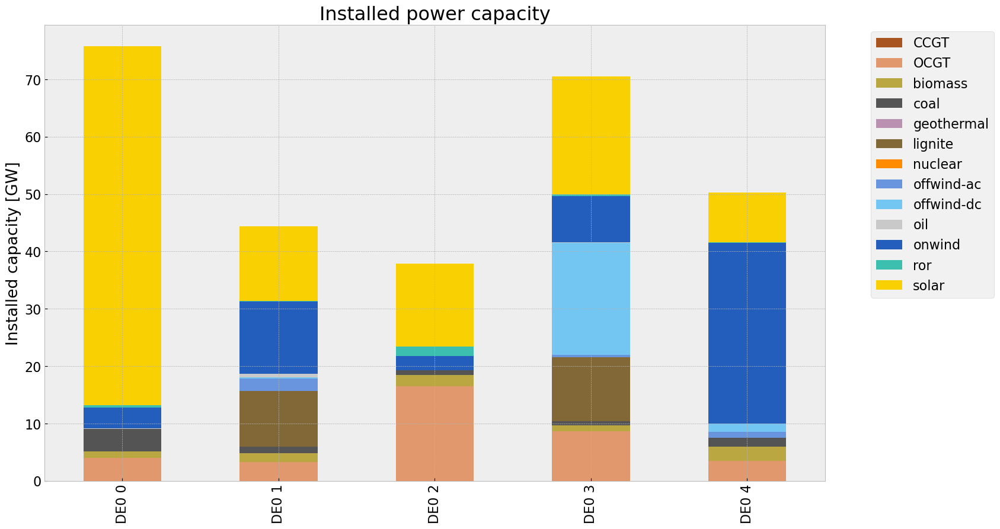

<Figure size 640x480 with 0 Axes>

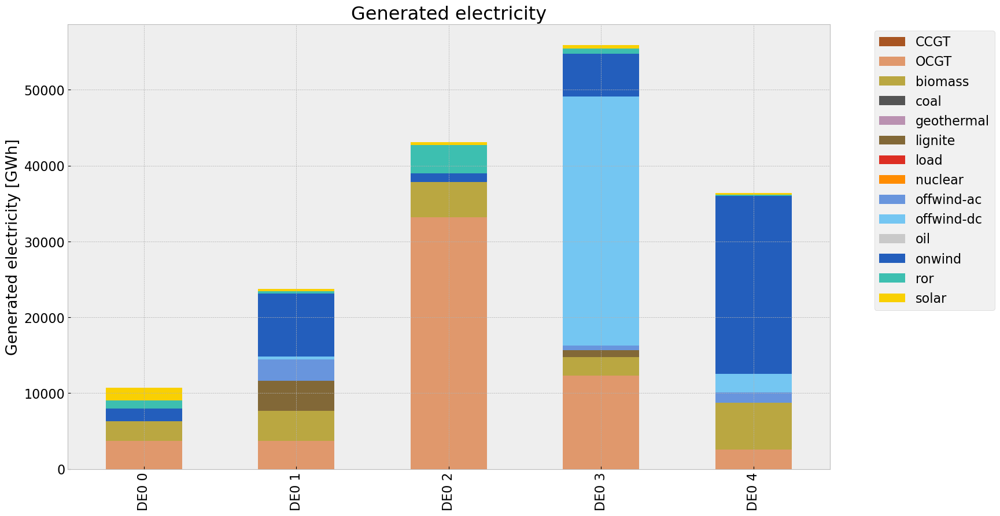

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\2820679995.py:33: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p = n3.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\2820679995.py:34: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3550636783.py:6: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  p_by_carrier = n.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3550636783.py:16: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sto = n.storage_units_t.p.groupby(n.storag

,Generation in MWh,efficiency,emissions in Tonnes CO2/MWh,emissions in Tonnes CO2
carrier,,,,
CCGT,0.000000e+00,0.580000,0.1980,0.000000e+00
OCGT,5.548628e+07,0.499437,0.1980,2.199734e+07
biomass,1.983637e+07,0.468000,0.0000,0.000000e+00
coal,3.749390e+02,0.329632,0.3361,3.822958e+02
geothermal,0.000000e+00,1.000000,0.1200,0.000000e+00
lignite,4.834709e+06,0.358368,0.4069,5.489456e+06
load,0.000000e+00,1.000000,0.0000,0.000000e+00
nuclear,0.000000e+00,0.328400,0.0000,0.000000e+00
offwind-ac,4.831968e+06,1.000000,0.0000,0.000000e+00


c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


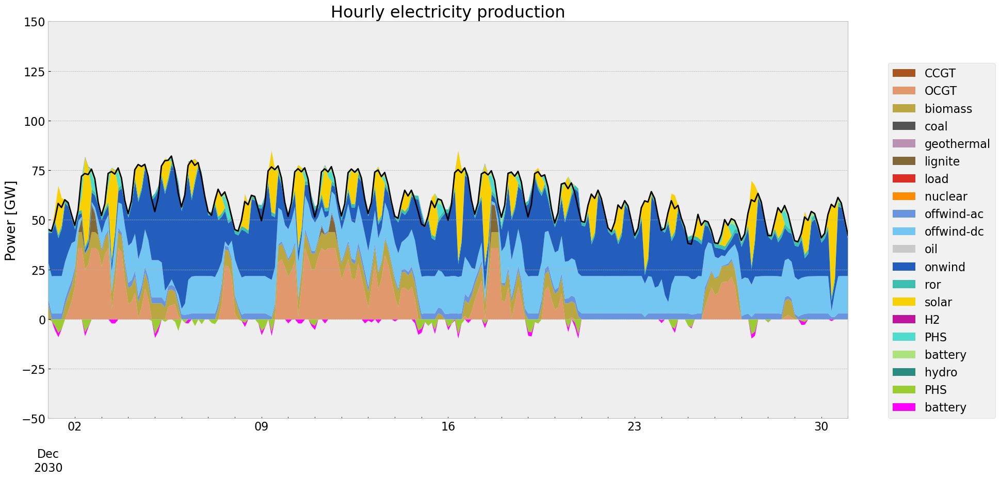

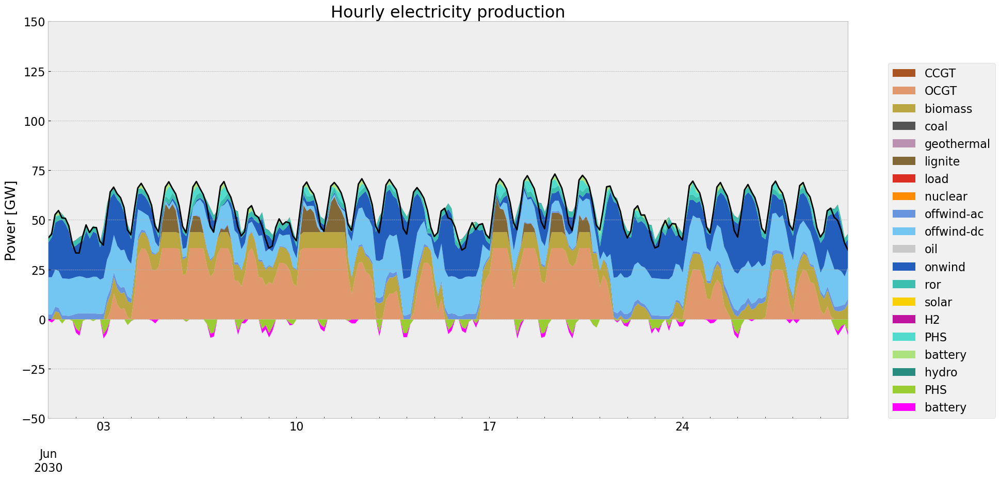

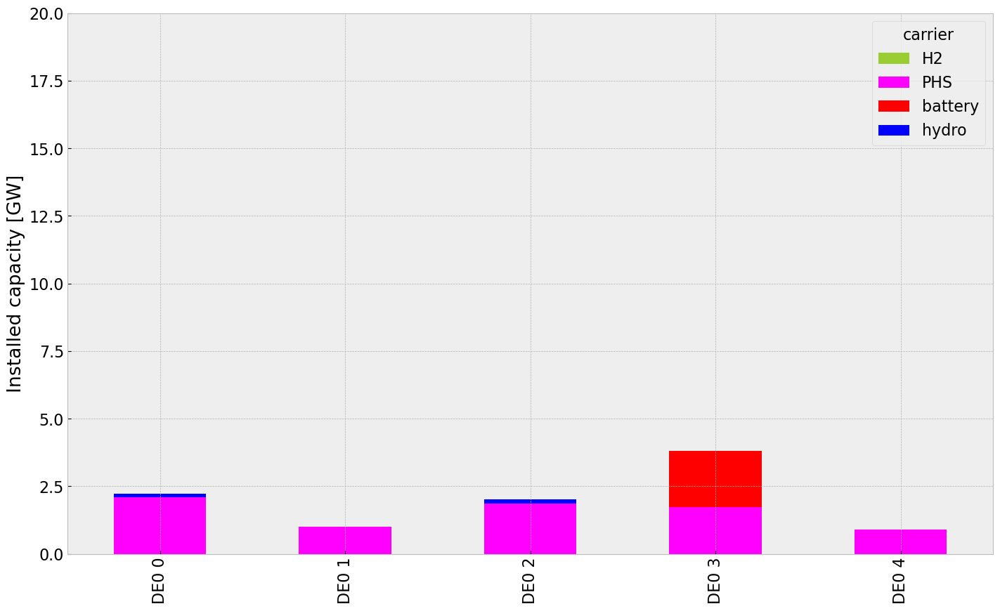

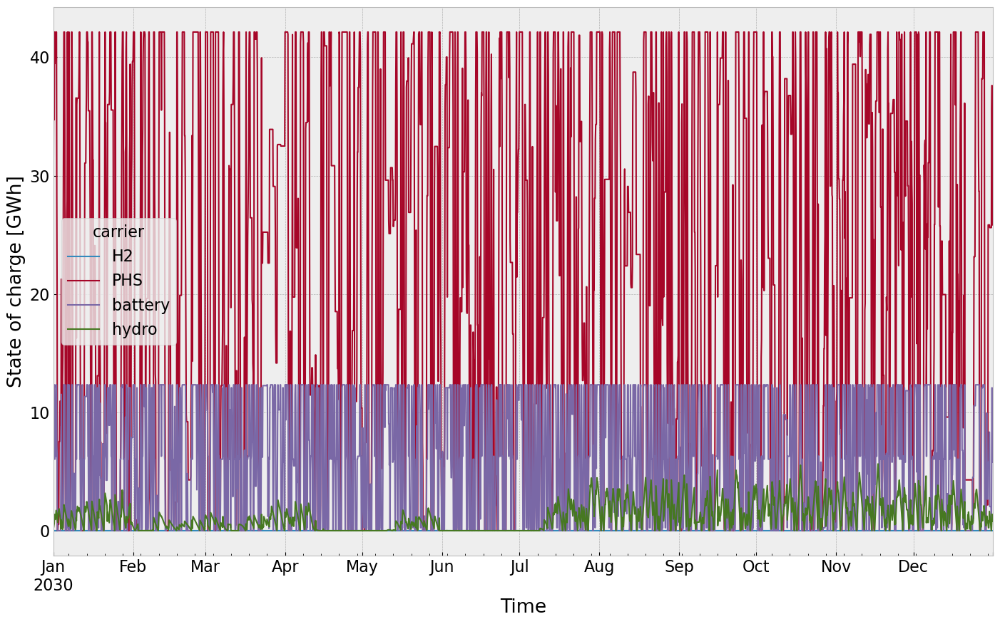

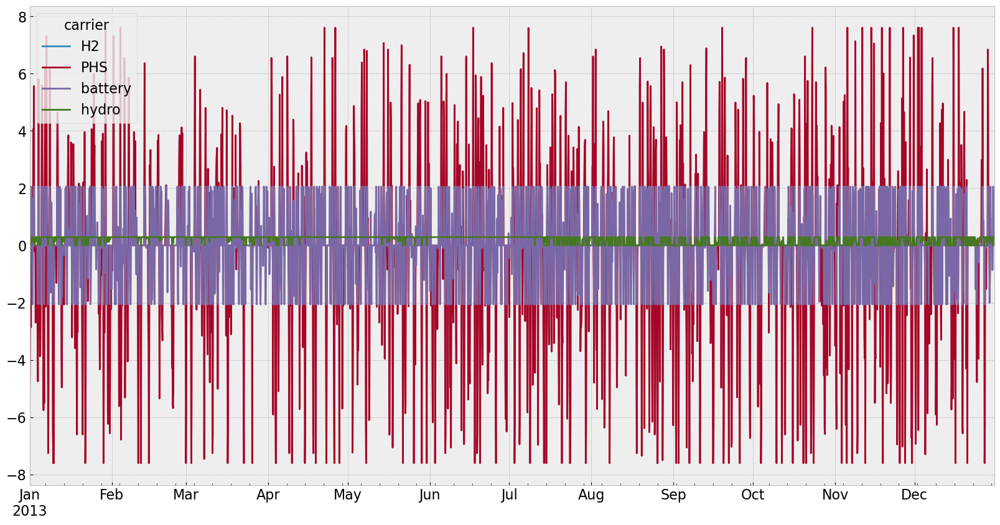

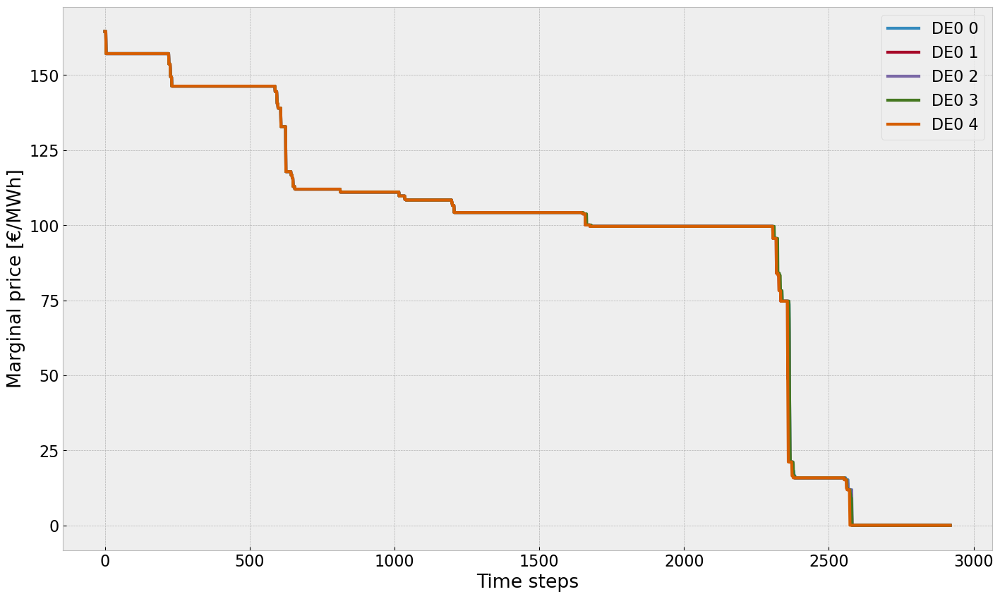

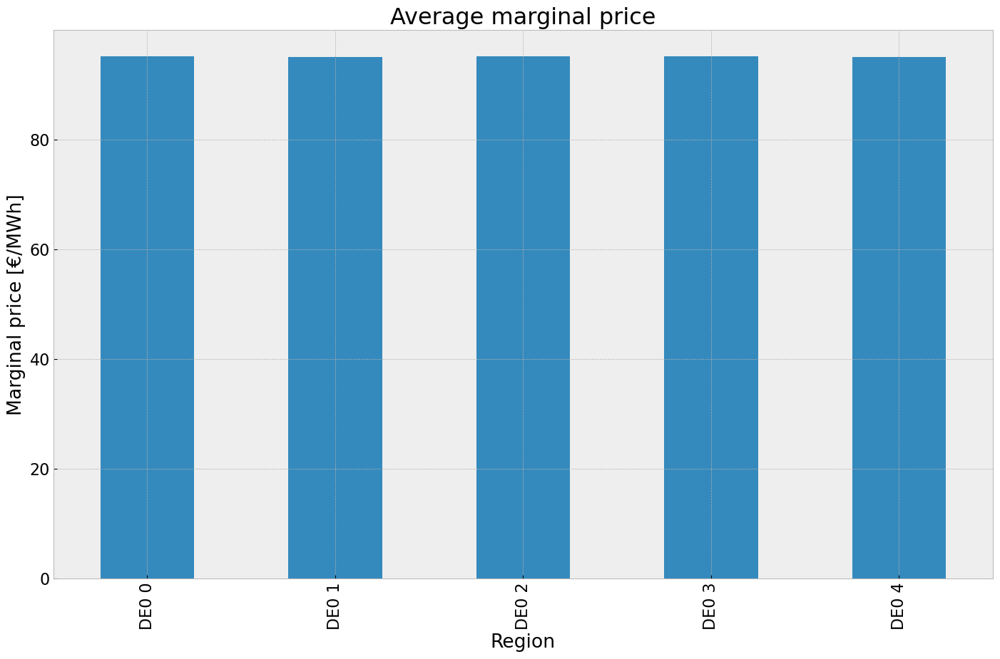

c:\Users\Jeremy\anaconda3\envs\pypsa-eur\Lib\site-packages\cartopy\mpl\style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


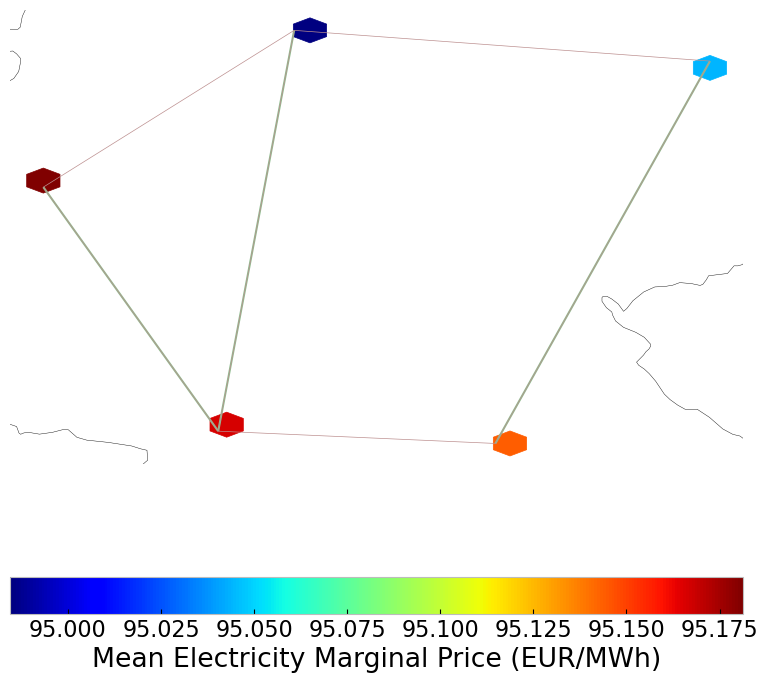

In [200]:
# Plotting
#installed cap
capacities_noinv_roll = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum()
capacities_noinv_roll.fillna(0, inplace=True)
gen = (capacities_noinv_roll.unstack()/1000).drop(columns=['load'],inplace=False)


cap_noinv_roll = inst_cap_table(n3, color_cap)

#Generation table
# consolidated generation table
carrier = n3.generators.carrier.unique()
df_tot_generation = n3.generators_t.p.sum()

generations = pd.Series(index = n3.generators.groupby(['bus', 'carrier']).p_nom_opt.sum().index)

for r in region:
    for tech in carrier:
        key = f"{r} {tech}"
        if key in df_tot_generation.index:
            try:
                generations.loc[r, tech] = df_tot_generation[key]
                #print(generations.loc[r, tech])
            except KeyError:
                print('error')
generations.fillna(0, inplace=True)

gen_noinv_roll =(generations.unstack()/1000)#GWh

gen_noinv_roll  = gen_power_table(n3,colors_gen_table)

#Snapshot Summer and Winter
p = n3.generators_t.p.groupby(n.generators.carrier, axis=1).sum().div(1e3)
sto = n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3)    

gen_curve(n3, '2030-12-01', '2030-12-31', colors_gen)
gen_curve(n3, '2030-06-01', '2030-06-30', colors_gen)

#installed storage unit & stores
inst_store_table(n3)

#State of Charge Storage unit
state_of_charge_plot(n3)
n3.storage_units_t.p.groupby(n.storage_units.carrier, axis=1).sum().div(1e3).loc[pd.date_range(start="2013-01-01", end="2013-12-31",freq='3H')].plot(figsize=(20,10))


#Electricitty Price duration curve
price_dur_curve_plot(n3)

#avg electricity price
price_regions_table(n3)
price_regions(n3)

#Emission
em_noinv_roll =em_table(n3)
em_noinv_roll

# Scenario Analysis

## Installed Capacity

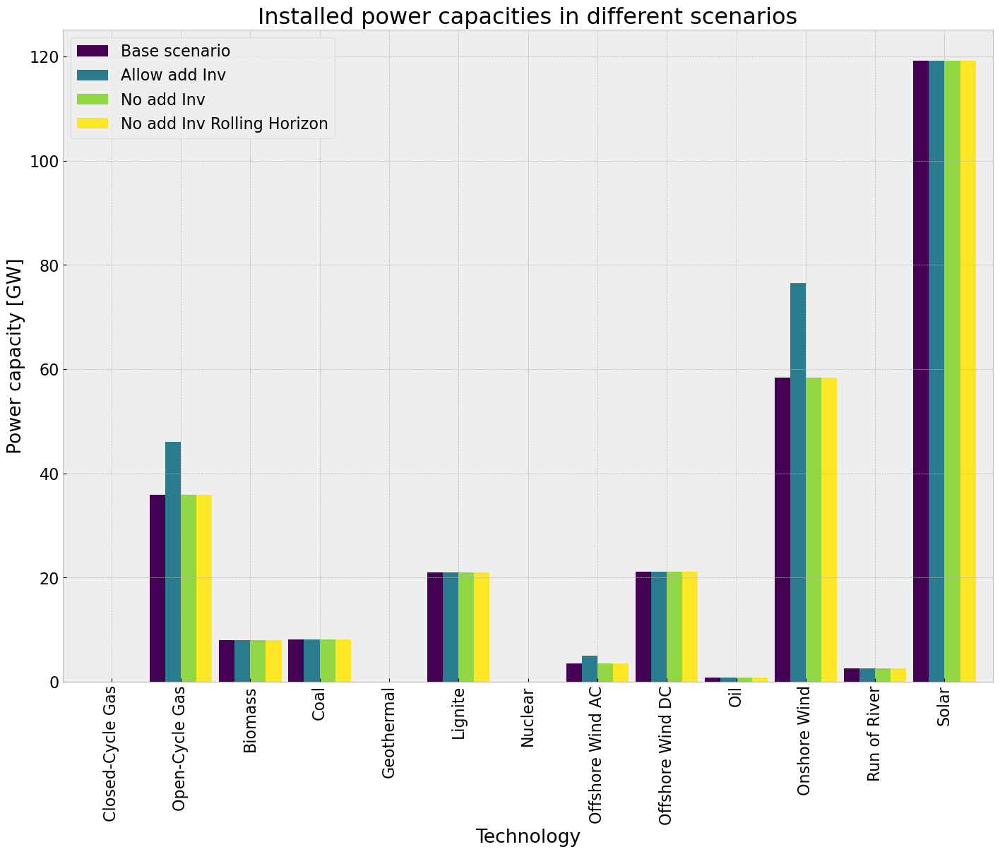

In [201]:
comp_inst_cap = pd.DataFrame(index=capacities_base.unstack().drop(columns=['load'],inplace=False).columns)

comp_inst_cap["Base scenario"] = capacities_base.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["Allow add Inv"] = capacities_inv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv"] = capacities_noinv.groupby("carrier").sum().div(1e3).drop(index="load")
comp_inst_cap["No add Inv Rolling Horizon"] = capacities_noinv_roll.groupby("carrier").sum().div(1e3).drop(index="load")

comp_inst_cap.rename(index = {"coal": "Coal"}, inplace=True)
comp_inst_cap.rename(index = {"OCGT": "Open-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"CCGT": "Closed-Cycle Gas"}, inplace=True)
comp_inst_cap.rename(index = {"ror": "Run of River"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-ac": "Offshore Wind AC"}, inplace=True)
comp_inst_cap.rename(index = {"offwind-dc": "Offshore Wind DC"}, inplace=True)
comp_inst_cap.rename(index = {"onwind": "Onshore Wind"}, inplace=True)
comp_inst_cap.rename(index = {"solar": "Solar"}, inplace=True)
comp_inst_cap.rename(index = {"oil": "Oil"}, inplace=True)
comp_inst_cap.rename(index = {"geothermal": "Geothermal"}, inplace=True)
comp_inst_cap.rename(index = {"nuclear": "Nuclear"}, inplace=True)
comp_inst_cap.rename(index = {"biomass": "Biomass"}, inplace=True)
comp_inst_cap.rename(index = {"lignite": "Lignite"}, inplace=True)

comp_inst_cap.fillna(0, inplace=True)

comp_inst_cap.plot.bar(figsize=(17,12),
                        color=cm.viridis(np.linspace(0, 5, len(comp_inst_cap))),
                        grid=True,
                        xlabel="Technology",
                        ylabel="Power capacity [GW]",
                        title=f"Installed power capacities in different scenarios",
                        #ylim=[0,350],
                        width=0.9
)
plt.show()

In [202]:
comp_inst_cap

,Base scenario,Allow add Inv,No add Inv,No add Inv Rolling Horizon
carrier,,,,
Closed-Cycle Gas,0.000000,0.000000,0.000000,0.000000
Open-Cycle Gas,35.939257,46.054396,35.939257,35.939257
Biomass,8.011736,8.011736,8.011736,8.011736
Coal,8.158220,8.158220,8.158220,8.158220
Geothermal,0.000000,0.000000,0.000000,0.000000
Lignite,20.999170,20.999170,20.999170,20.999170
Nuclear,0.000000,0.000000,0.000000,0.000000
Offshore Wind AC,3.464309,5.004294,3.464309,3.464309
Offshore Wind DC,21.180997,21.180997,21.180997,21.180997


## Power Generation

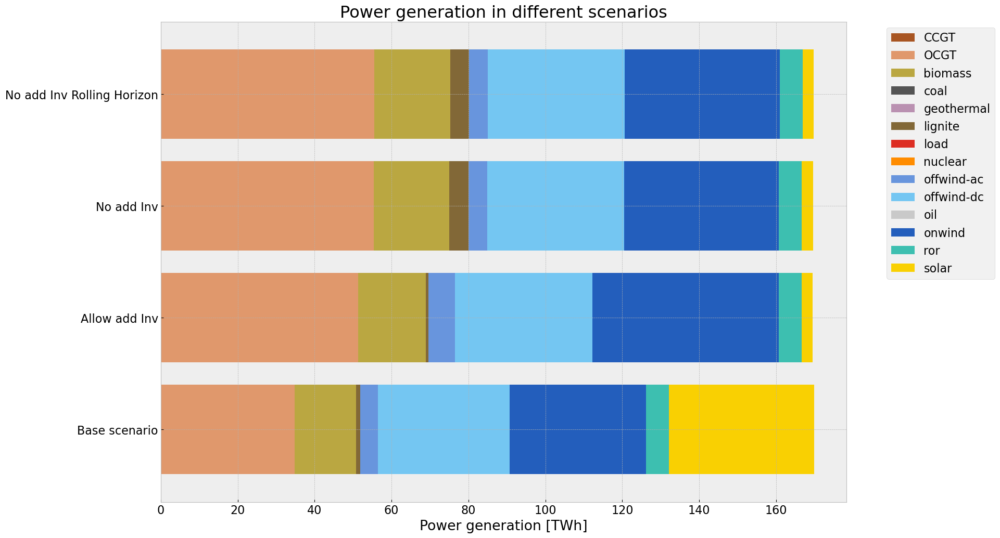

In [203]:
comp_gen_electr = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = tech_list_gen_table)

comp_gen_electr.loc["Base scenario"] = gen_base.sum().div(1e3) # TWh/a
comp_gen_electr.loc["Allow add Inv"] = gen_inv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv"] = gen_noinv.sum().div(1e3) # TWh/a
comp_gen_electr.loc["No add Inv Rolling Horizon"] = gen_noinv_roll.sum().div(1e3) # TWh/a


#comp_gen_electr.rename(columns = {"coal": "Coal"}, inplace=True)
#comp_gen_electr.rename(columns = {"gas": "Gas"}, inplace=True)
#comp_gen_electr.rename(columns = {"hydro": "Hydro"}, inplace=True)
#comp_gen_electr.rename(columns = {"offwind": "Offshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"onwind": "Onshore Wind"}, inplace=True)
#comp_gen_electr.rename(columns = {"solar": "Solar"}, inplace=True)
#comp_gen_electr.rename(columns = {"oil": "Oil"}, inplace=True)
#comp_gen_electr.rename(columns = {"geothermal": "Geothermal"}, inplace=True)
#comp_gen_electr.rename(columns = {"nuclear": "Nuclear"}, inplace=True)

comp_gen_electr.fillna(0, inplace=True)
comp_gen_electr.plot.barh(figsize=(17,12),
                        color=colors_gen_table,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Power generation [TWh]",
                        title=f"Power generation in different scenarios",
                        #xlim=[0,200],
                        width=0.8
)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Average System Cost

In [204]:
tech_comp = system_cost_base.index.tolist()
comp_system_cost = pd.DataFrame(index = ["Base scenario", "Allowed add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns =tech_comp)

demand = n.snapshot_weightings.generators @ n.loads_t.p_set.sum(axis=1) # the same in each scenario

comp_system_cost.loc["Base scenario"] = system_cost_base # Million €/a
comp_system_cost.loc["Allowed add Inv"] = system_cost_inv # Million €/a
#if tot_cost_0_PV > 0: 
#    comp_system_cost.loc["0% PV potential"] = system_cost_0_PV # Million €/a
#else: comp_system_cost.loc["0% PV potential"] = 0.0
#if tot_cost_20_PV > 0: 
#    comp_system_cost.loc["20% PV potential"] = system_cost_20_PV # Million €/a
#else: comp_system_cost.loc["20% PV potential"] = 0.0
comp_system_cost.loc["No add Inv"] = system_cost_noinv # Million €/a
comp_system_cost.loc["No add Inv Rolling Horizon"] = system_cost_noinv_roll # Million €/a

#if 'AC' in system_cost_base:
#   comp_system_cost.AC = comp_system_cost.AC-system_cost_base.AC # expenditure for already existing transmission lines

comp_system_cost[comp_system_cost<0] = 0 # since we subtact the AC cost (for the 0% or 20%) 
comp_system_cost.drop('-', axis=1, inplace=True)
#comp_system_cost.iloc[0,0] = system_cost_base.AC


comp_system_cost = comp_system_cost.mul(1e6).div(demand) #eur0/

#comp_system_cost.rename(columns = {"battery storage": "Battery storage"}, inplace=True)
#comp_system_cost.rename(columns = {"hydrogen storage underground": "Hydrogen storage underground"}, inplace=True)

comp_system_cost.fillna(0, inplace=True)

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3585904631.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3585904631.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_comp.append(n.carriers.color[j])


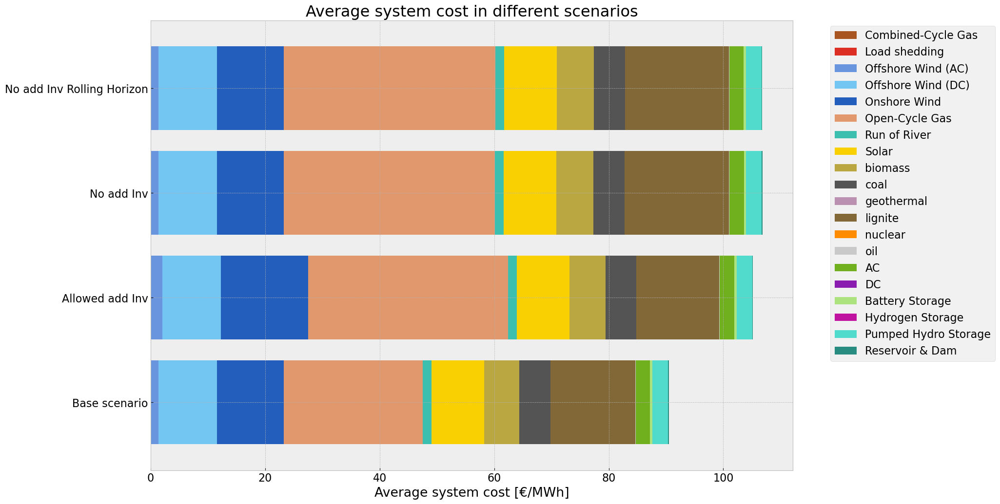

In [205]:
colors_comp = []

for i in range(len(comp_system_cost.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_system_cost.columns[i] == n.carriers.nice_name[j]:
            colors_comp.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found  



comp_system_cost.plot.barh(figsize=(17,12),
                        color=colors_comp,
                        grid=True,
                        stacked=True,
                        ylabel="",
                        xlabel="Average system cost [€/MWh]",
                        title=f"Average system cost in different scenarios",
                        #xlim=[0,100],
                        width=0.8
)
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Curtailment

In [206]:
comp_curtailment = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns = stat_base.loc["Generator"].index)

comp_curtailment.loc["Base scenario"] = stat_base.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["Allow add Inv"] = stat_inv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv"] = stat_noinv.loc["Generator"].Curtailment.div(1e6) # TWh
comp_curtailment.loc["No add Inv Rolling Horizon"] = stat_noinv_roll.loc["Generator"].Curtailment.div(1e6) # TWh

comp_curtailment.fillna(0, inplace=True)

In [207]:
color_curtailment=[]

for i in range(len(comp_curtailment.columns)):
    for j in range(len(n.carriers.nice_name)):
        if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
            color_curtailment.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found 

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3109801822.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if comp_curtailment.columns[i] == n.carriers.nice_name[j]:
C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\3109801822.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color_curtailment.append(n.carriers.color[j])


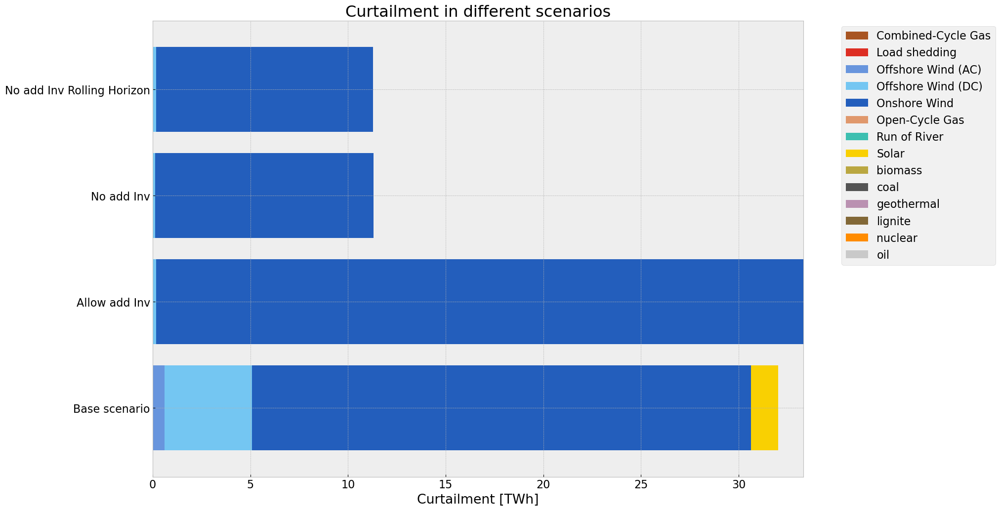

In [208]:
comp_curtailment.plot.barh(figsize=(17,12),
                        color=color_curtailment,
                        grid=True,
                        stacked=True, 
                        ylabel="",
                        xlabel="Curtailment [TWh]",
                        title=f"Curtailment in different scenarios",
                        #xlim=[0,120],
                        width=0.8
)
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Emission

C:\Users\Jeremy\AppData\Local\Temp\ipykernel_19316\189732353.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  colors_comp.append(n.carriers.color[j])


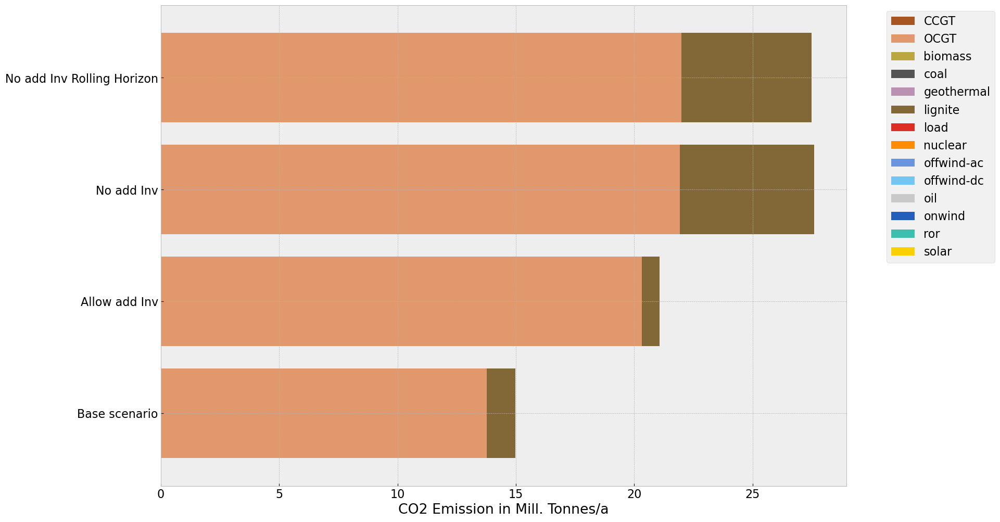

In [209]:
tech_comp = em_base.index.tolist()
comp_system_em = pd.DataFrame(index = ["Base scenario", "Allow add Inv", "No add Inv", "No add Inv Rolling Horizon"],
                                columns =tech_comp)

#demand = n.snapshot_weightings.generators @ n.loads_t.p_set.sum(axis=1) # the same in each scenario

comp_system_em.loc["Base scenario"] = em_base['emissions in Tonnes CO2']/1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["Allow add Inv"] = em_inv['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["No add Inv"] = em_noinv['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a
comp_system_em.loc["No add Inv Rolling Horizon"] = em_noinv_roll['emissions in Tonnes CO2'] /1e6 # Mill. Tonnes CO2 /a

comp_system_em.fillna(0, inplace=True)

colors_comp = []

for i in range(len(comp_system_em.columns)):
    for j in range(len(n.carriers.index)):
        if comp_system_em.columns[i] == n.carriers.index[j]:
            colors_comp.append(n.carriers.color[j])
            #print(n.carriers.nice_name[j],comp_system_cost.columns[i],n.carriers.color[j])
            break  # break the inner loop once a match is found  



comp_system_em.plot.barh(figsize=(17,12),
                        color=colors_comp,
                        grid=True,
                        stacked=True,
                        ylabel="",
                        xlabel="CO2 Emission in Mill. Tonnes/a",
                        #title=f"Average system cost in different scenarios",
                        #xlim=[0,100],
                        width=0.8
)
#global_constraint
#plt.axvline(x=n.global_constraints.loc['CO2Limit','constant']/1e6, color='r', linestyle='-', linewidth=2, label='CO2 cap')
# Move legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()